# Step 1 : Import Libraries

The required libraries are imported for various purposes: 

**Visualization Libraries :**
- `matplotlib.pyplot` and `seaborn` : 
  - Used for static visualizations and statistical plots.
- `plotly.express`,  `plotly.graph_objects`, and `plotly.subplots` : 
  - For creating interactive and more detailed visualizations.

**Pre-processing Libraries :**
  - `pandas` : For data manipulation and analysis.
  - `numpy` : For numerical operations on array.
  - Pre-processing modules :
    - `FunctionTransformer` : 
      -  Transforms input data using a custom function.
   -  `StandardScaler` :
      -  Standardizes features
   -  `OneHotEncoder` :
      -  Converts categorical features into one-hot encoded
  -  `ColumnTransformer` :
     -  Allows the application of different preprocessing steps to specific columns in the dataset.
  -  `Pipeline` :
     -  Combines preprocessing steps and machine learning algorithms into a single pipeline, simplifying the workflow.

**Machine Learning Libraries :**
- Model Selection and Tuning :
  - `train_test_split` : 
    - Splits the dataset into training and testing subsets.
  - `KFold` : 
    - Implements K-Fold cross-validation to evaluate model performance on different data splits.
  - `GridSearchCV` and `RandomizedSearchCV` :
    - Tools for hyperparameter optimization.
  - `cross_val_score` :
    - Computes cross-validated scores for assessing model performance.
- Model Metrics :
  - `precision`, `recall_score`, `f1_score` and `accuracy_score` :
    - Evaluate classification model performance
  - `classification_report` and `confusion_matrix` :
    - Provide detailed insights into model predictions.
- Machine Learning Models :
  - `RandomForestClassifier`
  - `LogisticRegression`
  - `KNeighborsClassifier`
  - `XGBClassifier`



In [1]:
# Import Libraries

# Visualization Library
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mticker
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Pre-processing Data Library
import pandas as pd
import numpy as np
from sklearn.preprocessing import FunctionTransformer, StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Machine Learning Tuning Library
from sklearn.model_selection import train_test_split, KFold, GridSearchCV, RandomizedSearchCV, cross_val_score
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier, plot_importance


# Step 2 : Download Dataset

## Configurations
To make numerical outputs easier to interpret:
- `pd.set_option('display.float_format', '{:.3f}'.format)` : 
  - Configures pandas to display floating-point numbers with three decimal places.
- `np.set_printoptions(suppress=True, formatter={'float_kind': '{:.3f}'.format})` : 
  - Configures NumPy to suppress scientific notation and display floats with three decimal places.

In [2]:
# Set pandas to display numbers in normal format
pd.set_option('display.float_format', '{:.3f}'.format)

# Set NumPy to display numbers in normal format
np.set_printoptions(suppress=True, formatter={'float_kind': '{:.3f}'.format})

## Train Dataset

The train dataset and test dataset are loaded using `pd.read_csv()` and named as `train_df` and `test_df`, respectively. These dataset are analyzed using the following functions :
- `head()` :
  - Displays the first few rows of the dataset to understand its structure.
- `isna().sum()` :
  - Checks for missing values in each column.
- `info()` :
  - Provides data types and non-null counts for each column.
- `describe()` :
  - Generates summary statistics for numerical columns.

The train dataset consists of 58,645 entries and 13 columns, which can be categorized into two groups: numerical and categorical (string/object) data types. Detailed information about each column is provided in the next section. Additionally, there are no missing values in the train dataset, ensuring data completeness.

Each column of the dataset provide specific information about the individuals and their loans. Below is a detailed description of each column :
- `id` : 
  - unique identifier assigned to each individual in the dataset.
- `person_age` : 
  - Represents the age of the individual in years.
- `person_income` :
  - Indicates the annual income of the individual in monetary units.
- `person_home_ownership` :
  - Specifies the home ownership status of the individual.
- `person_emp_length` :
  - Shows the total length of employment of the individual, measured in years.
- `loan_intent` :
  - Identifies the purpose of the loan
- `loan_grade` : 
  - A grade assigned to the loan based on the creditworthiness of the borrower.
- `loan_amt` : 
  - Specifies the amount of loan taken by the individual.
- `loan_int_rate` : 
  - Represents the interest rate applied to the loan.
- `loan_percent_income` : 
  - Indicates the proportion of the individual’s income allocated to repaying the loan.
- `cb_person_default_on_file` : 
  - Indicates whether the individual has a record of defaulting on any previous loans:
    - Y: Yes, the individual has defaulted before.
    - N: No, the individual has not defaulted before.
- `cb_person_cred_hist_length` : 
  - The length of the individual’s credit history, measured in years.
- `loan_status` :
  - The target variable, indicating the status of the loan:
    - 0: The loan is not defaulted.
    - 1: The loan is defaulted.

In [3]:
# Import train dataset
train_df = pd.read_csv("train.csv")

train_df.head()

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
0,0,37,35000,RENT,0.000,EDUCATION,B,6000,11.490,0.170,N,14,0
1,1,22,56000,OWN,6.000,MEDICAL,C,4000,13.350,0.070,N,2,0
2,2,29,28800,OWN,8.000,PERSONAL,A,6000,8.900,0.210,N,10,0
3,3,30,70000,RENT,14.000,VENTURE,B,12000,11.110,0.170,N,5,0
4,4,22,60000,RENT,2.000,MEDICAL,A,6000,6.920,0.100,N,3,0


In [4]:
# Checking the null value in the train dataset
print("Number of Null Value in each column:")

train_df.isna().sum()

Number of Null Value in each column:


id                            0
person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
loan_status                   0
dtype: int64

In [5]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58645 entries, 0 to 58644
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          58645 non-null  int64  
 1   person_age                  58645 non-null  int64  
 2   person_income               58645 non-null  int64  
 3   person_home_ownership       58645 non-null  object 
 4   person_emp_length           58645 non-null  float64
 5   loan_intent                 58645 non-null  object 
 6   loan_grade                  58645 non-null  object 
 7   loan_amnt                   58645 non-null  int64  
 8   loan_int_rate               58645 non-null  float64
 9   loan_percent_income         58645 non-null  float64
 10  cb_person_default_on_file   58645 non-null  object 
 11  cb_person_cred_hist_length  58645 non-null  int64  
 12  loan_status                 58645 non-null  int64  
dtypes: float64(3), int64(6), object

In [6]:
train_df.describe()

,id,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,loan_status
count,58645.000,58645.000,58645.000,58645.000,58645.000,58645.000,58645.000,58645.000,58645.000
mean,29322.000,27.551,64046.173,4.701,9217.557,10.678,0.159,5.814,0.142
std,16929.498,6.033,37931.107,3.960,5563.807,3.035,0.092,4.029,0.349
min,0.000,20.000,4200.000,0.000,500.000,5.420,0.000,2.000,0.000
25%,14661.000,23.000,42000.000,2.000,5000.000,7.880,0.090,3.000,0.000
50%,29322.000,26.000,58000.000,4.000,8000.000,10.750,0.140,4.000,0.000
75%,43983.000,30.000,75600.000,7.000,12000.000,12.990,0.210,8.000,0.000
max,58644.000,123.000,1900000.000,123.000,35000.000,23.220,0.830,30.000,1.000


## Test Dataset
The test dataset contains 39,098 entries and 12 columns (excluding the loan_status column, which is only present in the train dataset). There are no missing value within the test dataset

In [7]:
# Import test dataset
test_df = pd.read_csv("test.csv")

test_df.head()

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,58645,23,69000,RENT,3.000,HOMEIMPROVEMENT,F,25000,15.760,0.360,N,2
1,58646,26,96000,MORTGAGE,6.000,PERSONAL,C,10000,12.680,0.100,Y,4
2,58647,26,30000,RENT,5.000,VENTURE,E,4000,17.190,0.130,Y,2
3,58648,33,50000,RENT,4.000,DEBTCONSOLIDATION,A,7000,8.900,0.140,N,7
4,58649,26,102000,MORTGAGE,8.000,HOMEIMPROVEMENT,D,15000,16.320,0.150,Y,4


In [8]:
print("Number of Null Value in each column:")

test_df.isna().sum()

Number of Null Value in each column:


id                            0
person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
dtype: int64

In [9]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39098 entries, 0 to 39097
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          39098 non-null  int64  
 1   person_age                  39098 non-null  int64  
 2   person_income               39098 non-null  int64  
 3   person_home_ownership       39098 non-null  object 
 4   person_emp_length           39098 non-null  float64
 5   loan_intent                 39098 non-null  object 
 6   loan_grade                  39098 non-null  object 
 7   loan_amnt                   39098 non-null  int64  
 8   loan_int_rate               39098 non-null  float64
 9   loan_percent_income         39098 non-null  float64
 10  cb_person_default_on_file   39098 non-null  object 
 11  cb_person_cred_hist_length  39098 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.6+ MB


In [10]:
test_df.describe()

,id,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length
count,39098.000,39098.000,39098.000,39098.000,39098.000,39098.000,39098.000,39098.000
mean,78193.500,27.567,64060.461,4.687,9251.466,10.661,0.160,5.831
std,11286.765,6.033,37955.829,3.868,5576.255,3.020,0.092,4.072
min,58645.000,20.000,4000.000,0.000,700.000,5.420,0.000,2.000
25%,68419.250,23.000,42000.000,2.000,5000.000,7.880,0.090,3.000
50%,78193.500,26.000,58000.000,4.000,8000.000,10.750,0.140,4.000
75%,87967.750,30.000,75885.000,7.000,12000.000,12.990,0.210,8.000
max,97742.000,94.000,1900000.000,42.000,35000.000,22.110,0.730,30.000


# Step 2 : Preprocessing Dataset

## Create a loan_status dataframe

Before beginning the preprocessing of the dataset, the `loan_status` column was extracted from the `train_df` and stored in a new variable named `loan_status_df`. The `.copy()` method was used to ensure that any modifications to `loan_status_df` would not affect the original column in `train_df`. Additionally, the data type of `loan_status_df` was converted from `integer` to `boolean` for simplified analysis and logical operations.

In [11]:
# Create a copy of the "loan_status" column from the train_df DataFrame
loan_status_df = train_df["loan_status"].copy()

# Convert the data type of the "loan_status" column to boolean
loan_status_df = loan_status_df.astype(bool)

# Display the updated loan_status_df
loan_status_df

0        False
1        False
2        False
3        False
4        False
         ...  
58640    False
58641     True
58642     True
58643    False
58644    False
Name: loan_status, Length: 58645, dtype: bool

## Drop loan_status and id from train_df

The `id` and `loan_status` columns were removed from the train_df DataFrame. The `id` was dropped because it serves only as a unique identifier and does not provide any meaningful information for predicting loan status. Similarly, the `loan_status` column was dropped because it represents the target variable that the machine learning model is intended to predict, and it should not be included as a feature during training.

In [12]:
# Drop id and loan status from train dataset
train_df.drop(["id", "loan_status"], axis =1 , inplace= True)

train_df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,37,35000,RENT,0.000,EDUCATION,B,6000,11.490,0.170,N,14
1,22,56000,OWN,6.000,MEDICAL,C,4000,13.350,0.070,N,2
2,29,28800,OWN,8.000,PERSONAL,A,6000,8.900,0.210,N,10
3,30,70000,RENT,14.000,VENTURE,B,12000,11.110,0.170,N,5
4,22,60000,RENT,2.000,MEDICAL,A,6000,6.920,0.100,N,3
...,...,...,...,...,...,...,...,...,...,...,...
58640,34,120000,MORTGAGE,5.000,EDUCATION,D,25000,15.950,0.210,Y,10
58641,28,28800,RENT,0.000,MEDICAL,C,10000,12.730,0.350,N,8
58642,23,44000,RENT,7.000,EDUCATION,D,6800,16.000,0.150,N,2
58643,22,30000,RENT,2.000,EDUCATION,A,5000,8.900,0.170,N,3


## Drop id from test_df
The `id` column was also removed from the test_df DataFrame for the same reason mentioned earlier: it serves only as a unique identifier and does not provide any insightful information for prediction, making it irrelevant for the machine learning model.

In [13]:
# Drop id from test dataset
test_df.drop("id", axis =1 , inplace= True)

test_df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,23,69000,RENT,3.000,HOMEIMPROVEMENT,F,25000,15.760,0.360,N,2
1,26,96000,MORTGAGE,6.000,PERSONAL,C,10000,12.680,0.100,Y,4
2,26,30000,RENT,5.000,VENTURE,E,4000,17.190,0.130,Y,2
3,33,50000,RENT,4.000,DEBTCONSOLIDATION,A,7000,8.900,0.140,N,7
4,26,102000,MORTGAGE,8.000,HOMEIMPROVEMENT,D,15000,16.320,0.150,Y,4
...,...,...,...,...,...,...,...,...,...,...,...
39093,22,31200,MORTGAGE,2.000,DEBTCONSOLIDATION,B,3000,10.370,0.100,N,4
39094,22,48000,MORTGAGE,6.000,EDUCATION,A,7000,6.030,0.150,N,3
39095,51,60000,MORTGAGE,0.000,PERSONAL,A,15000,7.510,0.250,N,25
39096,22,36000,MORTGAGE,4.000,PERSONAL,D,14000,15.620,0.390,Y,4


## Create a function for inspecting the info within the column

The `show_info( )` function is designed to provide detailed insights into a specified column within a DataFrame. Here's a breakdown of what the function does:
- **Display Unique Values :**
    - The function first prints a list of unique values in the specified column, sorted in ascending order. This helps in understanding the range or categories present in the column.
- **Count Unique Values :**
    - Next, it calculates and displays the frequency of each unique value in the column, including NaN values if they exist. This helps in identifying how often each value occurs.
- **Show Summary Statistics :**
    - Finally, it prints summary statistics for the column, such as count, mean, standard deviation, minimum, and maximum values (for numerical columns) or counts for categorical data.
- **Separator Lines :**
    - Horizontal separators ("-" * 100) are printed before and after each section to improve readability and make the output more organized.

This function is useful for quickly exploring and understanding the characteristics of a specific column in a dataset. It helps identify data types, distributions, and potential issues (e.g., missing values or outliers) that might require attention during preprocessing.

In [14]:
def show_info(df, column):
    # Sort and display the unique values in the specified column
    print("-" * 100)  # Line separator
    print("Unique Values within", column, ":")
    print(np.sort(df[column].unique()), "\n")
    print("-" * 100)  # Line separator
    
    # Get the value counts of the specified column, including NaN values
    print("Count of unique values in", column, ":")
    print(df[column].value_counts(dropna=False), "\n")
    print("-" * 100)  # Line separator

    # Display summary statistics for the specified column
    print("Summary Statistics of", column, ":")
    print(df[column].describe(), "\n")
    print("-" * 100)  # Line separator



## Person Age : The age of the individual customer

### Inspect the person_age in train_df

In [15]:
show_info(train_df, "person_age")

----------------------------------------------------------------------------------------------------
Unique Values within person_age :
[ 20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37
  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55
  56  57  58  59  60  61  62  64  65  66  69  70  73  76  80  84 123] 

----------------------------------------------------------------------------------------------------
Count of unique values in person_age :
person_age
23     7726
22     7051
24     6395
25     5067
27     4450
26     3874
28     3707
29     3270
30     2333
31     1917
21     1795
32     1565
33     1306
36     1117
34     1041
37      992
35      862
38      745
39      536
40      438
41      433
43      320
42      291
44      229
46      164
45      163
47      125
48       97
53       75
51       69
50       63
52       62
54       60
49       59
58       35
55       34
56       29
60       28
57       25
65       13
61       13
20  

### Inspect the person_age in test_df

In [16]:
show_info(test_df, "person_age")

----------------------------------------------------------------------------------------------------
Unique Values within person_age :
[20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43
 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 68
 69 70 84 94] 

----------------------------------------------------------------------------------------------------
Count of unique values in person_age :
person_age
23    5059
22    4616
24    4305
25    3474
27    3102
26    2578
28    2454
29    2198
30    1531
31    1222
21    1180
32    1037
33     863
36     771
34     673
37     670
35     585
38     531
39     359
41     287
40     268
43     213
42     189
44     131
45     113
47      94
46      89
48      66
51      55
49      51
52      44
53      39
54      38
55      34
50      34
58      26
57      22
56      20
60      17
70      11
61       8
66       8
65       7
62       6
59       5
69       5
64       4
20       2
84       1
63       1
68

### Creating a function for generating an age bins

The `add_age_group( )` function is designed to create a new column, age_group, in a DataFrame by categorizing individuals into specific age bins. Here's a detailed explanation:
- **Define Age Bins :**
  - The function starts by defining a list of bins, which specify the age ranges to group individuals :
    - `bins = [0, 24, 34, 44, 54, 64, np.inf]` 
      - 0-24, 24-34, 34-44, 44-54, 54-64, 65 and above
- **Assign Labels to Bins :**
  - Labels corresponding to each bin are defined :
    - `labels = ['<25', '25-34', '35-44', '45-54', '55-64', '65+']`
      - '<25', '25-34', '35-44', '45-54', '55-64', '65+'
- **Create the age_group Column :**
  - The `pd.cut( )` function is used to map the person_age values in the DataFrame to the appropriate bins and assign the corresponding labels:
    - `df.loc[:, 'age_group'] = pd.cut(df['person_age'], bins=bins, labels=labels)`
      - The `.loc[ ]` method is used to ensure that the new column is added without modifying other parts of the DataFrame.
      - The new column, `age_group`, categorizes each individual's age into one of the predefined groups.

The `add_age_group( )` function simplifies the analysis of age-related patterns in the data by grouping individuals into defined age ranges. This is especially useful for visualizations, aggregations, or modeling tasks where analyzing age as continuous data might not be as intuitive or effective.

In [17]:
# Function for creating age bins 
def add_age_group(df):
    # Define bins for age groups
    bins = [0, 24, 34, 44, 54, 64, np.inf]

    # Define labels corresponding to the bins
    labels = ['<25', '25-34', '35-44', '45-54', '55-64', '65+']

    # Create the 'age_group' column
    df.loc[:, 'age_group'] = pd.cut(df['person_age'], bins=bins, labels=labels)

    return df

# add_age_group(train_df)

# train_df

## person_income : The annual income of the individual customer

### Inspect the person_income in train_df

In [18]:
show_info(train_df, "person_income")

----------------------------------------------------------------------------------------------------
Unique Values within person_income :
[   4200    5000    9600 ... 1824000 1839784 1900000] 

----------------------------------------------------------------------------------------------------
Count of unique values in person_income :
person_income
60000     4164
50000     2992
30000     2200
40000     1981
70000     1876
          ... 
48602        1
46151        1
128474       1
43900        1
124600       1
Name: count, Length: 2641, dtype: int64 

----------------------------------------------------------------------------------------------------
Summary Statistics of person_income :
count     58645.000
mean      64046.173
std       37931.107
min        4200.000
25%       42000.000
50%       58000.000
75%       75600.000
max     1900000.000
Name: person_income, dtype: float64 

----------------------------------------------------------------------------------------------------


### Inspect the person_income in test_df

In [19]:
show_info(test_df, "person_income")

----------------------------------------------------------------------------------------------------
Unique Values within person_income :
[   4000    4200    4800 ... 1200000 1782000 1900000] 

----------------------------------------------------------------------------------------------------
Count of unique values in person_income :
person_income
60000    2871
50000    1974
30000    1414
40000    1347
70000    1175
         ... 
69936       1
61150       1
72984       1
64320       1
70399       1
Name: count, Length: 2196, dtype: int64 

----------------------------------------------------------------------------------------------------
Summary Statistics of person_income :
count     39098.000
mean      64060.461
std       37955.829
min        4000.000
25%       42000.000
50%       58000.000
75%       75885.000
max     1900000.000
Name: person_income, dtype: float64 

----------------------------------------------------------------------------------------------------


### Creating function for generating person income bins

The `add_person_income_group( )` function is designed to create a new column, age_group, in a DataFrame by categorizing individuals into specific age bins. Here's a detailed explanation:
- **Define Income Bins :**
  - The function begins by defining a list of bins that segment income into meaningful ranges :
    - `bins = [0, 20000, 40000, 60000, 80000, 100000, np.inf]` 
      - 0-20k, 20k-40k, 40k-60k, 60k-80k, 80k-100k, 100k and above
- **Assign Labels to Bins :**
  - Labels corresponding to each bin are defined :
    - `labels = ['<20k', '20k-40k', '40k-60k', '60k-80k', '80k-100k', '100k+']`
      - '<20k', '20k-40k', '40k-60k', '60k-80k', '80k-100k', '100k+'
- **Create the income_group Column :**
  - The `pd.cut( )` function is used to map the person_income values in the DataFrame to the appropriate bins and assign the corresponding labels:
    - `df.loc[:, 'income_group'] = pd.cut(df['person_income'], bins=bins, labels=labels)`
      - The `loc[ ]` method ensures that the new column is added without altering other parts of the DataFrame.
      - The new column, `income_group`, categorizes each individual's income into one of the predefined brackets.

The `add_person_income_group( )` function provides a way to analyze income-related patterns in the data by grouping individuals into defined income brackets.

In [20]:
# Function for creating person income bins 
def add_person_income_group(df):
    # Define bins based on the income distribution
    bins = [0, 20000, 40000, 60000, 80000, 100000, np.inf]
    
    # Define labels corresponding to the bins
    labels = ['<20k', '20k-40k', '40k-60k', '60k-80k', '80k-100k', '100k+']

    # Create the 'income_group' column
    df.loc[:, 'income_group'] = pd.cut(df['person_income'], bins=bins, labels=labels)

    return df

# add_age_group(train_df)

# train_df

## person_home_ownership : The home ownership status of the individual customer

### Inspect the person_home_ownership in train_df

In [21]:
show_info(train_df, "person_home_ownership")

----------------------------------------------------------------------------------------------------
Unique Values within person_home_ownership :
['MORTGAGE' 'OTHER' 'OWN' 'RENT'] 

----------------------------------------------------------------------------------------------------
Count of unique values in person_home_ownership :
person_home_ownership
RENT        30594
MORTGAGE    24824
OWN          3138
OTHER          89
Name: count, dtype: int64 

----------------------------------------------------------------------------------------------------
Summary Statistics of person_home_ownership :
count     58645
unique        4
top        RENT
freq      30594
Name: person_home_ownership, dtype: object 

----------------------------------------------------------------------------------------------------


### Inspect the person_home_ownership in test_df

In [22]:
show_info(test_df, "person_home_ownership")

----------------------------------------------------------------------------------------------------
Unique Values within person_home_ownership :
['MORTGAGE' 'OTHER' 'OWN' 'RENT'] 

----------------------------------------------------------------------------------------------------
Count of unique values in person_home_ownership :
person_home_ownership
RENT        20280
MORTGAGE    16683
OWN          2056
OTHER          79
Name: count, dtype: int64 

----------------------------------------------------------------------------------------------------
Summary Statistics of person_home_ownership :
count     39098
unique        4
top        RENT
freq      20280
Name: person_home_ownership, dtype: object 

----------------------------------------------------------------------------------------------------


## person_emp_length : The length of employment of the individual customers

### Inspect the person_emp_length in train_df

In [23]:
show_info(train_df, "person_emp_length")

----------------------------------------------------------------------------------------------------
Unique Values within person_emp_length :
[0.000 1.000 2.000 3.000 4.000 5.000 6.000 7.000 8.000 9.000 10.000 11.000
 12.000 13.000 14.000 15.000 16.000 17.000 18.000 19.000 20.000 21.000
 22.000 23.000 24.000 25.000 26.000 27.000 28.000 29.000 30.000 31.000
 35.000 39.000 41.000 123.000] 

----------------------------------------------------------------------------------------------------
Count of unique values in person_emp_length :
person_emp_length
0.000      7586
2.000      7270
3.000      6475
5.000      5839
4.000      5461
1.000      5203
6.000      4902
7.000      4275
8.000      3015
9.000      2290
11.000     1491
12.000     1105
10.000     1072
13.000      797
14.000      590
15.000      367
16.000      280
17.000      168
18.000      153
21.000       78
19.000       72
20.000       65
22.000       20
24.000       14
23.000       12
26.000       11
25.000        8
27.000     

### Remove 123 year from the dataset
We removed the customer with 123 years of employment from the dataset, as this value is likely an extreme outlier. From a real-world perspective, it is highly unusual for someone to work for over 100 years, as most people typically retire around the age of 60.

To remove the outlier from our dataset, we first create a condition to identify the outlier. Next, we use `.index` to retrieve the index of the outlier, and then apply the `.drop()` method with this index to effectively remove the outlier from the `loan_status_df`.

In [24]:
# Create a condition to identify rows where "person_emp_length" equals 123.0
person_emp_length_condition = train_df["person_emp_length"] == 123.0

# Get the indices of the rows where the condition is true
person_emp_length_123 = train_df[person_emp_length_condition].index

# Drop the rows with the identified indices from the loan_status_df DataFrame
loan_status_df.drop(index=person_emp_length_123, inplace=True)

# Display the updated loan_status_df
loan_status_df

0        False
1        False
2        False
3        False
4        False
         ...  
58640    False
58641     True
58642     True
58643    False
58644    False
Name: loan_status, Length: 58643, dtype: bool

To remove the outlier from our `train_df`, we first create a condition to filter rows where the `person_emp_length` is not equal to `123.0`. Next, we apply this condition to the `train_df` to keep only the rows that meet the criteria, effectively removing the outlier. Finally, we sort and display the unique values in the `person_emp_length` column to verify that the outlier has been successfully removed.

In [25]:
# Create a condition to filter rows where "person_emp_length" is not equal to 123.0
person_emp_length_condition = train_df["person_emp_length"] != 123.0

# Filter the train_df DataFrame to keep only the rows that meet the condition
train_df = train_df[person_emp_length_condition]

# Sort and display the unique values in the "person_emp_length" column after filtering
np.sort(train_df["person_emp_length"].unique())

array([0.000, 1.000, 2.000, 3.000, 4.000, 5.000, 6.000, 7.000, 8.000,
       9.000, 10.000, 11.000, 12.000, 13.000, 14.000, 15.000, 16.000,
       17.000, 18.000, 19.000, 20.000, 21.000, 22.000, 23.000, 24.000,
       25.000, 26.000, 27.000, 28.000, 29.000, 30.000, 31.000, 35.000,
       39.000, 41.000])

In [26]:
# Convert the "person_emp_length" column to integer type
train_df.loc[:, "person_emp_length"] = train_df["person_emp_length"].astype(int)

# Display the updated "person_emp_length" column to confirm the changes
train_df["person_emp_length"]

0        0.000
1        6.000
2        8.000
3       14.000
4        2.000
         ...  
58640    5.000
58641    0.000
58642    7.000
58643    2.000
58644    2.000
Name: person_emp_length, Length: 58643, dtype: float64

### Inspect the person_emp_length in test_df

In [27]:
show_info(test_df, "person_emp_length")

----------------------------------------------------------------------------------------------------
Unique Values within person_emp_length :
[0.000 1.000 2.000 3.000 4.000 5.000 6.000 7.000 8.000 9.000 10.000 11.000
 12.000 13.000 14.000 15.000 16.000 17.000 18.000 19.000 20.000 21.000
 22.000 23.000 24.000 25.000 26.000 28.000 29.000 31.000 42.000] 

----------------------------------------------------------------------------------------------------
Count of unique values in person_emp_length :
person_emp_length
0.000     5105
2.000     4817
3.000     4393
5.000     3844
4.000     3548
6.000     3423
1.000     3413
7.000     2714
8.000     2034
9.000     1656
11.000    1009
10.000     737
12.000     731
13.000     546
14.000     350
15.000     210
16.000     134
17.000     125
18.000      94
19.000      57
20.000      56
21.000      45
22.000      18
23.000      13
24.000       8
31.000       6
26.000       4
28.000       3
25.000       3
42.000       1
29.000       1
Name: count, dt

In [28]:
# Convert the "person_emp_length" column to integer type
test_df["person_emp_length"] = test_df["person_emp_length"].astype(int)

# Display the updated "person_emp_length" column to confirm the changes
test_df["person_emp_length"]

0        3
1        6
2        5
3        4
4        8
        ..
39093    2
39094    6
39095    0
39096    4
39097    6
Name: person_emp_length, Length: 39098, dtype: int64

### Create a function for generating person employment length bins

The `add_emp_length_group( )` function creates a new column, `emp_length_group`, in a DataFrame by categorizing individuals based on their employment length. Here's a detailed explanation:
- **Define Employment Length Bins :**
  - The function starts by defining a list of bins that categorize employment lengths into meaningful ranges:
    - `bins = [-1, 0, 3, 7, 15, 30, np.inf]` 
      - -1-0, 1-3, 4-7, 8-15, 16-30, 31 and above
- **Assign Labels to Bins :**
  - Labels corresponding to each bin are defined :
    - `labels = ['0', '1-3', '4-7', '8-15', '16-30', '31+']`
      - '0', '1-3', '4-7', '8-15', '16-30', '31+'
- **Create the age_group Column :**
  - The `pd.cut( )` function is used to map the `person_emp_length` values in the DataFrame to the appropriate bins and assign the corresponding labels:
    - `df.loc[:, 'emp_length_group'] = pd.cut(df['person_emp_length'], bins=bins, labels=labels)`
      - The `loc[ ]` method ensures that the new column is added without altering other parts of the DataFrame.
      - The new column, `emp_length_group`, categorizes each individual’s employment length into one of the defined groups.

The `add_emp_length_group( )` function simplifies the analysis of employment length by grouping individuals into defined employment categories.

In [29]:
# Function for creating person employment length bins 
def add_emp_length_group(df):
    # Define bins for employment length
    bins = [-1, 0, 3, 7, 15, 30, np.inf]

    # Define labels corresponding to the bins
    labels = ['0', '1-3', '4-7', '8-15', '16-30', '31+']

    # Create the 'emp_length_group' column
    df.loc[:, 'emp_length_group'] = pd.cut(df['person_emp_length'], bins=bins, labels=labels)

    return df

# add_emp_length_group(train_df)

# train_df

## loan_intent : The purpose for which the loan was taken by individual customer

### Inspect the loan_intent in train_df

In [30]:
show_info(train_df, "loan_intent")

----------------------------------------------------------------------------------------------------
Unique Values within loan_intent :
['DEBTCONSOLIDATION' 'EDUCATION' 'HOMEIMPROVEMENT' 'MEDICAL' 'PERSONAL'
 'VENTURE'] 

----------------------------------------------------------------------------------------------------
Count of unique values in loan_intent :
loan_intent
EDUCATION            12271
MEDICAL              10933
PERSONAL             10016
VENTURE              10010
DEBTCONSOLIDATION     9133
HOMEIMPROVEMENT       6280
Name: count, dtype: int64 

----------------------------------------------------------------------------------------------------
Summary Statistics of loan_intent :
count         58643
unique            6
top       EDUCATION
freq          12271
Name: loan_intent, dtype: object 

----------------------------------------------------------------------------------------------------


### Inspect the loan_intent in test_df

In [31]:
show_info(test_df, "loan_intent")

----------------------------------------------------------------------------------------------------
Unique Values within loan_intent :
['DEBTCONSOLIDATION' 'EDUCATION' 'HOMEIMPROVEMENT' 'MEDICAL' 'PERSONAL'
 'VENTURE'] 

----------------------------------------------------------------------------------------------------
Count of unique values in loan_intent :
loan_intent
EDUCATION            8076
MEDICAL              7447
PERSONAL             6815
VENTURE              6632
DEBTCONSOLIDATION    5915
HOMEIMPROVEMENT      4213
Name: count, dtype: int64 

----------------------------------------------------------------------------------------------------
Summary Statistics of loan_intent :
count         39098
unique            6
top       EDUCATION
freq           8076
Name: loan_intent, dtype: object 

----------------------------------------------------------------------------------------------------


## loan_grade : The grade assigned to the loan based on creditworthiness

### Inspect the loan_grade in train_df

In [32]:
show_info(train_df, "loan_grade")

----------------------------------------------------------------------------------------------------
Unique Values within loan_grade :
['A' 'B' 'C' 'D' 'E' 'F' 'G'] 

----------------------------------------------------------------------------------------------------
Count of unique values in loan_grade :
loan_grade
A    20984
B    20399
C    11036
D     5033
E     1009
F      149
G       33
Name: count, dtype: int64 

----------------------------------------------------------------------------------------------------
Summary Statistics of loan_grade :
count     58643
unique        7
top           A
freq      20984
Name: loan_grade, dtype: object 

----------------------------------------------------------------------------------------------------


### Inspect the loan_grade in test_df

In [33]:
show_info(test_df, "loan_grade")

----------------------------------------------------------------------------------------------------
Unique Values within loan_grade :
['A' 'B' 'C' 'D' 'E' 'F' 'G'] 

----------------------------------------------------------------------------------------------------
Count of unique values in loan_grade :
loan_grade
A    14005
B    13604
C     7460
D     3269
E      637
F      105
G       18
Name: count, dtype: int64 

----------------------------------------------------------------------------------------------------
Summary Statistics of loan_grade :
count     39098
unique        7
top           A
freq      14005
Name: loan_grade, dtype: object 

----------------------------------------------------------------------------------------------------


### Create a function for generating loan grade group

The `classify_loan_grade( )` function creates a new column, `loan_grade_class`, in a DataFrame by classifying loan grades into two categories: "Good" and "Bad." Here's a detailed explanation:

- **Apply Classification Logic :**
  - The function uses the `apply()` method along with a lambda function to classify each value in the loan_grade column:
    - `df.loc[:, 'loan_grade_class'] = df['loan_grade'].apply(lambda x: 'Good' if x in ['A', 'B', 'C'] else 'Bad')`
      - If the loan grade is 'A', 'B', or 'C', it is categorized as "Good."
      - Otherwise (e.g., grades 'D', 'E', etc.), it is categorized as "Bad."
- **Create the loan_grade_class Column :**
  - The results of the classification are stored in a new column called `loan_grade_class`.
    - The `loc[ ]` method ensures that this column is added to the DataFrame without altering other parts of the dataset.

The classify_loan_grade function simplifies the analysis of loan grades by grouping them into two broad categories:
- `Good Grades (A, B, C)`: Represent loans with higher creditworthiness.
- `Bad Grades (Other grades)`: Represent loans with lower creditworthiness.

In [34]:
# Function for classifying loan grades into Good or Bad
def classify_loan_grade(df):
    df.loc[:, 'loan_grade_class'] = df['loan_grade'].apply(lambda x: 'Good' if x in ['A', 'B', 'C'] else 'Bad')
    return df

# classify_loan_grade(train_df)

# train_df

## loan_amnt : The amount of loan taken

### Inspect the loan_amnt in train_df

In [35]:
show_info(train_df, "loan_amnt")

----------------------------------------------------------------------------------------------------
Unique Values within loan_amnt :
[  500   700   900  1000  1050  1075  1150  1200  1225  1250  1275  1300
  1325  1350  1375  1400  1450  1475  1500  1525  1600  1675  1700  1750
  1775  1800  1807  1825  1850  1875  1900  1925  1950  2000  2050  2100
  2125  2150  2200  2225  2250  2275  2300  2325  2350  2375  2400  2425
  2450  2500  2525  2550  2575  2600  2650  2700  2725  2750  2800  2850
  2875  2925  2950  3000  3075  3100  3125  3150  3175  3200  3250  3275
  3300  3325  3350  3375  3400  3425  3450  3500  3525  3550  3575  3600
  3625  3650  3675  3700  3725  3750  3775  3800  3825  3850  3900  3925
  3950  4000  4025  4050  4075  4100  4125  4200  4250  4275  4300  4325
  4350  4375  4400  4425  4450  4475  4500  4525  4550  4600  4650  4700
  4725  4750  4775  4800  4850  4900  4925  4950  4975  5000  5025  5050
  5075  5100  5125  5150  5175  5200  5225  5250  5275  5300  5

### Inspect the loan_amnt in test_df

In [36]:
show_info(test_df, "loan_amnt")

----------------------------------------------------------------------------------------------------
Unique Values within loan_amnt :
[  700   900  1000  1050  1075  1200  1225  1250  1275  1300  1325  1350
  1400  1450  1500  1550  1600  1675  1700  1725  1750  1775  1800  1850
  1875  1900  1925  1950  2000  2050  2100  2125  2150  2200  2225  2250
  2275  2300  2350  2375  2400  2425  2475  2500  2525  2550  2600  2650
  2700  2725  2750  2800  2850  2875  2900  2925  2950  3000  3025  3050
  3075  3100  3125  3150  3200  3250  3275  3300  3350  3375  3400  3425
  3450  3475  3500  3525  3550  3575  3600  3625  3650  3675  3700  3725
  3750  3775  3800  3825  3850  3900  3950  4000  4050  4100  4125  4150
  4175  4200  4250  4275  4300  4325  4350  4375  4400  4425  4450  4500
  4600  4650  4700  4725  4750  4775  4800  4875  4900  4975  5000  5050
  5100  5125  5150  5175  5200  5225  5250  5275  5300  5325  5375  5400
  5500  5525  5550  5575  5600  5650  5700  5750  5800  5825  5

### Creating function for generating loan amount groups

The `add_loan_amt_group( )` function creates a new column, loan_amt_group, in a DataFrame by categorizing loan amounts into specific size groups. Here's a detailed explanation:

- **Define Loan Amount Bins :**
  - The function starts by defining a list of bins that categorize loan amounts into meaningful ranges:
    - `bins = [0, 5000, 8000, 12000, 20000, np.inf]` 
      - 0-5000, 5000-8000, 8000-12000, 12000-20000, 20000 and above
- **Assign Labels to Bins :**
  - Labels corresponding to each bin are defined :
    - `labels = ['Small', 'Medium', 'Large', 'Very Large', 'Extreme']`
      - 'Small', 'Medium', 'Large', 'Very Large', 'Extreme'
- **Create the loan_amt_group Column :**
  - The `pd.cut( )` function is used to map the `loan_amnt` values in the DataFrame to the appropriate bins and assign the corresponding labels:
    - `df.loc[:, 'loan_amt_group'] = pd.cut(df['loan_amnt'], bins=bins, labels=labels, right=False)`
      - The `loc[ ]` method ensures that the new column is added without altering other parts of the DataFrame.
      - The `right=False` parameter ensures that the intervals are closed on the left and open on the right (e.g., [0, 5000) includes values from 0 up to, but not including, 5000).

The `add_loan_amt_group( )` function simplifies the analysis of loan amounts by grouping them into defined size categories.

In [37]:
# Function for generating loan amount group
def add_loan_amt_group(df):

    # Define bins for loan amounts
    bins = [0, 5000, 8000, 12000, 20000, np.inf]
    
    # Define labels corresponding to the bins
    labels = ['Small', 'Medium', 'Large', 'Very Large', 'Extreme']

    # Create the 'loan_amt_group' column
    df.loc[:, 'loan_amt_group'] = pd.cut(df['loan_amnt'], bins=bins, labels=labels, right=False)

    return df

## loan_int_rate : The interest rate of the loan

### Inspect the loan_int_rate in train_df

In [38]:
show_info(train_df, "loan_int_rate")

----------------------------------------------------------------------------------------------------
Unique Values within loan_int_rate :
[5.420 5.430 5.790 5.990 6.000 6.030 6.050 6.170 6.390 6.420 6.540 6.620
 6.760 6.910 6.920 6.960 6.990 7.050 7.120 7.140 7.250 7.290 7.370 7.400
 7.420 7.430 7.460 7.490 7.510 7.660 7.680 7.710 7.740 7.750 7.880 7.900
 7.910 7.940 8.000 8.070 8.100 8.320 8.380 8.450 8.490 8.590 8.630 8.700
 8.880 8.900 8.940 9.010 9.070 9.130 9.170 9.200 9.220 9.250 9.320 9.330
 9.380 9.450 9.510 9.590 9.620 9.630 9.640 9.670 9.700 9.760 9.830 9.880
 9.910 9.960 9.990 10.000 10.010 10.030 10.080 10.140 10.200 10.250 10.280
 10.330 10.360 10.370 10.380 10.390 10.460 10.510 10.540 10.590 10.620
 10.640 10.650 10.680 10.710 10.740 10.750 10.780 10.790 10.830 10.910
 10.950 10.960 10.990 11.030 11.090 11.110 11.120 11.140 11.220 11.260
 11.280 11.340 11.360 11.410 11.460 11.480 11.490 11.540 11.580 11.590
 11.620 11.660 11.710 11.720 11.780 11.830 11.860 11.890 11.910 1

### Inspect the loan_int_rate in test_df

In [39]:
show_info(test_df, "loan_int_rate")

----------------------------------------------------------------------------------------------------
Unique Values within loan_int_rate :
[5.420 5.620 5.650 5.790 5.830 5.990 6.000 6.030 6.170 6.390 6.540 6.620
 6.760 6.910 6.920 6.990 7.050 7.120 7.140 7.170 7.290 7.340 7.370 7.400
 7.420 7.430 7.460 7.490 7.510 7.660 7.680 7.700 7.740 7.750 7.880 7.900
 7.910 8.000 8.070 8.320 8.380 8.400 8.480 8.490 8.590 8.630 8.700 8.770
 8.880 8.900 8.910 8.940 9.010 9.070 9.200 9.250 9.320 9.330 9.380 9.450
 9.460 9.510 9.590 9.620 9.630 9.640 9.670 9.700 9.760 9.830 9.880 9.910
 9.960 9.990 10.000 10.010 10.080 10.140 10.200 10.250 10.280 10.330
 10.360 10.370 10.380 10.390 10.460 10.510 10.590 10.620 10.640 10.650
 10.710 10.740 10.750 10.780 10.830 10.910 10.950 10.960 10.990 11.030
 11.090 11.110 11.120 11.140 11.160 11.220 11.260 11.280 11.340 11.360
 11.410 11.460 11.480 11.490 11.540 11.580 11.590 11.610 11.660 11.710
 11.720 11.780 11.830 11.860 11.890 11.910 11.970 11.990 12.040 12.090


### Create a function for generating interest rate group

The `add_int_rate_group( )` function creates a new column, `int_rate_group`, in a DataFrame by categorizing loan interest rates into specific groups. Here's a detailed explanation:

- **Define Interest Rate Bins :**
  - The function starts by defining a list of bins that segment interest rates into meaningful ranges:
    - `bins = [0, 8, 11, 13, 15, np.inf]` 
      - 0-8%, 8-11%, 11-13%, 13-15%, 15% and above
- **Assign Labels to Bins :**
  - Labels corresponding to each bin are defined :
    - `labels = ['Low', 'Moderate', 'High', 'Very High', 'Extremely High']`
      - 'Small', 'Medium', 'Large', 'Very Large', 'Extreme'
- **Create the loan_amt_group Column :**
  - The `pd.cut( )` function is used to map the `loan_int_rate` values in the DataFrame to the appropriate bins and assign the corresponding labels:
    - `df.loc[:, 'int_rate_group'] = pd.cut(df['loan_int_rate'], bins=bins, labels=labels, right=False)`
      - The `loc[ ]` method ensures that the new column is added without altering other parts of the DataFrame.
      - The `right=False` parameter ensures that the intervals are closed on the left and open on the right (e.g., [0, 5000) includes values from 0 up to, but not including, 5000).

The `add_int_rate_group( )` function simplifies the analysis of loan interest rates by grouping them into defined categories.

In [40]:
# Function for classifying the loan interest into group
def add_int_rate_group(df):

    # Define bins for interest rates
    bins = [0, 8, 11, 13, 15, np.inf] 

    # Define labels corresponding to the bins
    labels = ['Low', 'Moderate', 'High', 'Very High', 'Extremely High']

    # Create the 'int_rate_group' column
    df.loc[:, 'int_rate_group'] = pd.cut(df['loan_int_rate'], bins=bins, labels=labels, right=False)

    return df

# add_int_rate_group(train_df)

# train_df

## loan_percent_income : The percentage of the individual's income that goes towards paying the loan

### Inspect the loan_percent_income in train_df

In [41]:
show_info(train_df, "loan_percent_income")

----------------------------------------------------------------------------------------------------
Unique Values within loan_percent_income :
[0.000 0.010 0.020 0.030 0.040 0.050 0.060 0.070 0.080 0.090 0.100 0.110
 0.120 0.130 0.140 0.150 0.160 0.170 0.180 0.190 0.200 0.210 0.220 0.230
 0.240 0.250 0.260 0.270 0.280 0.290 0.300 0.310 0.320 0.330 0.340 0.350
 0.360 0.370 0.380 0.384 0.390 0.400 0.410 0.420 0.430 0.440 0.450 0.460
 0.470 0.480 0.490 0.500 0.510 0.520 0.530 0.540 0.550 0.560 0.590 0.630
 0.830] 

----------------------------------------------------------------------------------------------------
Count of unique values in loan_percent_income :
loan_percent_income
0.100    3247
0.130    3226
0.080    2834
0.170    2795
0.070    2725
         ... 
0.550       1
0.830       1
0.540       1
0.590       1
0.630       1
Name: count, Length: 61, dtype: int64 

----------------------------------------------------------------------------------------------------
Summary Statistic

### Inspect the loan_percent_income in test_df

In [42]:
show_info(test_df, "loan_percent_income")

----------------------------------------------------------------------------------------------------
Unique Values within loan_percent_income :
[0.000 0.010 0.020 0.030 0.040 0.050 0.060 0.070 0.080 0.090 0.100 0.110
 0.120 0.130 0.140 0.150 0.160 0.170 0.180 0.190 0.200 0.210 0.220 0.230
 0.240 0.250 0.260 0.270 0.280 0.290 0.300 0.310 0.320 0.330 0.340 0.350
 0.360 0.370 0.380 0.390 0.400 0.410 0.420 0.430 0.440 0.450 0.460 0.470
 0.480 0.490 0.496 0.500 0.510 0.520 0.530 0.540 0.550 0.570 0.580 0.590
 0.600 0.630 0.730] 

----------------------------------------------------------------------------------------------------
Count of unique values in loan_percent_income :
loan_percent_income
0.130    2248
0.100    2100
0.080    1930
0.170    1870
0.070    1792
         ... 
0.590       1
0.540       1
0.730       1
0.600       1
0.496       1
Name: count, Length: 63, dtype: int64 

----------------------------------------------------------------------------------------------------
Summa

### Create a function for generating loan percent income group

The `classify_loan_percent_income( )` function creates a new column, `loan_percent_income_group`, in a DataFrame by categorizing the percentage of income allocated to loans into specific groups. Here's a detailed explanation:

- **Define Bins for loan_percent_income :**
  - The function defines a list of bins to classify the proportion of income spent on loans into meaningful ranges :
    - `bins = [0, 0.1, 0.2, 0.35, 0.5, np.inf]`
      - 0-10%, 10-20%, 20-35%, 35-50%, 50% and above.
- **Assign Labels to Bins :**
  - Labels corresponding to each bin are defined :
    - `labels = ['Low', 'Moderate', 'High', 'Very High', 'Extremely High']`
      - 'Low', 'Moderate', 'High', 'Very High', 'Extremely High'
- **Create the loan_percent_income_group :**
  - The `pd.cut( )` function is used to map the `loan_percent_income` values in the DataFrame to the appropriate bins and assign the corresponding labels:
    - `df.loc[:, 'loan_percent_income_group'] = pd.cut(
    df['loan_percent_income'], bins=bins, labels=labels, include_lowest=True)`
      - The `include_lowest=True` parameter ensures that the first interval [0, 0.1] includes its lower boundary (0).
      - The `loc[ ]` method ensures that the new column is added without altering other parts of the DataFrame.

The `classify_loan_percent_income( )` function helps analyze how much of an individual’s income is allocated to loan repayments by grouping the data into predefined categories. 

In [43]:
# Function for creating loan percent income bins 
def classify_loan_percent_income(df):

    # Define bins and labels for loan_percent_income
    bins = [0, 0.1, 0.2, 0.35, 0.5, np.inf]  
    
    # Define labels corresponding to the bins
    labels = ['Low', 'Moderate', 'High', 'Very High', 'Extremely High']

    # Classify loan_percent_income into groups
    df.loc[:, 'loan_percent_income_group'] = pd.cut(
        df['loan_percent_income'], bins=bins, labels=labels, include_lowest=True)

    return df

# train_df = classify_loan_percent_income(train_df)

# train_df

## cb_person_default_on_file : Whether the individual has defaulted on any pervious loans

### Inspect the cb_person_default_on_file in train_df

In [44]:
show_info(train_df, "cb_person_default_on_file")

----------------------------------------------------------------------------------------------------
Unique Values within cb_person_default_on_file :
['N' 'Y'] 

----------------------------------------------------------------------------------------------------
Count of unique values in cb_person_default_on_file :
cb_person_default_on_file
N    49942
Y     8701
Name: count, dtype: int64 

----------------------------------------------------------------------------------------------------
Summary Statistics of cb_person_default_on_file :
count     58643
unique        2
top           N
freq      49942
Name: cb_person_default_on_file, dtype: object 

----------------------------------------------------------------------------------------------------


### Inspect the cb_person_default_on_file in test_df

In [45]:
show_info(test_df, "cb_person_default_on_file")

----------------------------------------------------------------------------------------------------
Unique Values within cb_person_default_on_file :
['N' 'Y'] 

----------------------------------------------------------------------------------------------------
Count of unique values in cb_person_default_on_file :
cb_person_default_on_file
N    33227
Y     5871
Name: count, dtype: int64 

----------------------------------------------------------------------------------------------------
Summary Statistics of cb_person_default_on_file :
count     39098
unique        2
top           N
freq      33227
Name: cb_person_default_on_file, dtype: object 

----------------------------------------------------------------------------------------------------


### Convert the data type of cb_person_default_on_file to boolean

The `cb_person_default_on_file` column in the `train_df` and `test_df` were updated by mapping the values `"N"` (No Default) and `"Y"` (Default) to `0` and `1`, respectively, since we want to convert the categorical data into numerical format. Following this, the columns were further converted into a `boolean` type, where `False` represents `0` `(No Default)` and `True` represents `1` `(Default)`.This transformation simplifies the data and ensures compatibility with machine learning models.

In [46]:
# Map the "cb_person_default_on_file" column values: "N" to 0 (No Default) and "Y" to 1 (Default)
train_df.loc[:, "cb_person_default_on_file"] = train_df["cb_person_default_on_file"].map({"N": 0, "Y": 1})

# Convert the "cb_person_default_on_file" column to a boolean type (False for 0 and True for 1)
train_df.loc[:, "cb_person_default_on_file"] = train_df["cb_person_default_on_file"].astype(bool)

# Display the updated DataFrame to verify the changes
train_df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,37,35000,RENT,0.000,EDUCATION,B,6000,11.490,0.170,False,14
1,22,56000,OWN,6.000,MEDICAL,C,4000,13.350,0.070,False,2
2,29,28800,OWN,8.000,PERSONAL,A,6000,8.900,0.210,False,10
3,30,70000,RENT,14.000,VENTURE,B,12000,11.110,0.170,False,5
4,22,60000,RENT,2.000,MEDICAL,A,6000,6.920,0.100,False,3
...,...,...,...,...,...,...,...,...,...,...,...
58640,34,120000,MORTGAGE,5.000,EDUCATION,D,25000,15.950,0.210,True,10
58641,28,28800,RENT,0.000,MEDICAL,C,10000,12.730,0.350,False,8
58642,23,44000,RENT,7.000,EDUCATION,D,6800,16.000,0.150,False,2
58643,22,30000,RENT,2.000,EDUCATION,A,5000,8.900,0.170,False,3


In [47]:
# Map the "cb_person_default_on_file" column values: "N" to 0 (No Default) and "Y" to 1 (Default)
test_df.loc[:, "cb_person_default_on_file"] = test_df["cb_person_default_on_file"].map({"N": 0, "Y": 1})

# Convert the "cb_person_default_on_file" column to a boolean type (False for 0 and True for 1)
test_df.loc[:, "cb_person_default_on_file"] = test_df["cb_person_default_on_file"].astype(bool)

# Display the updated DataFrame to verify the changes
test_df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,23,69000,RENT,3,HOMEIMPROVEMENT,F,25000,15.760,0.360,False,2
1,26,96000,MORTGAGE,6,PERSONAL,C,10000,12.680,0.100,True,4
2,26,30000,RENT,5,VENTURE,E,4000,17.190,0.130,True,2
3,33,50000,RENT,4,DEBTCONSOLIDATION,A,7000,8.900,0.140,False,7
4,26,102000,MORTGAGE,8,HOMEIMPROVEMENT,D,15000,16.320,0.150,True,4
...,...,...,...,...,...,...,...,...,...,...,...
39093,22,31200,MORTGAGE,2,DEBTCONSOLIDATION,B,3000,10.370,0.100,False,4
39094,22,48000,MORTGAGE,6,EDUCATION,A,7000,6.030,0.150,False,3
39095,51,60000,MORTGAGE,0,PERSONAL,A,15000,7.510,0.250,False,25
39096,22,36000,MORTGAGE,4,PERSONAL,D,14000,15.620,0.390,True,4


## cb_person_cred_hist_length : The length of the individual's credit history

### Inspect the cb_person_cred_hist_length in train_df

In [48]:
show_info(train_df, "cb_person_cred_hist_length")

----------------------------------------------------------------------------------------------------
Unique Values within cb_person_cred_hist_length :
[ 2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25
 26 27 28 29 30] 

----------------------------------------------------------------------------------------------------
Count of unique values in cb_person_cred_hist_length :
cb_person_cred_hist_length
3     10708
2     10656
4     10566
9      3499
8      3477
7      3392
6      3390
10     3364
5      3345
14      927
12      883
11      858
13      850
16      776
15      735
17      725
20       62
24       48
19       47
27       46
28       39
22       38
21       37
23       35
26       31
25       31
30       28
29       26
18       24
Name: count, dtype: int64 

----------------------------------------------------------------------------------------------------
Summary Statistics of cb_person_cred_hist_length :
count   58643.000
mean        5.814
std       

### Inspect the cb_person_cred_hist_length in test_df

In [49]:
show_info(test_df, "cb_person_cred_hist_length")

----------------------------------------------------------------------------------------------------
Unique Values within cb_person_cred_hist_length :
[ 2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25
 26 27 28 29 30] 

----------------------------------------------------------------------------------------------------
Count of unique values in cb_person_cred_hist_length :
cb_person_cred_hist_length
2     7154
3     7058
4     7020
8     2368
6     2294
9     2286
5     2265
7     2235
10    2210
12     608
16     584
11     577
14     576
13     511
17     504
15     500
28      44
20      41
24      38
27      34
22      29
18      26
23      24
30      24
19      24
25      23
21      20
29      12
26       9
Name: count, dtype: int64 

----------------------------------------------------------------------------------------------------
Summary Statistics of cb_person_cred_hist_length :
count   39098.000
mean        5.831
std         4.072
min         2.000
25%

### Create a function for generating credit history length group

The `add_credit_hist_length_group( )` function creates a new column, `credit_hist_length_group`, in a DataFrame by categorizing the length of credit history into specific groups. 

- **Define Bins for Credit Histroy Length :**
  - The function defines a list of bins to classify the length of an individual's credit history into meaningful ranges:
    - `bins = [0, 3, 5, 10, 20, np.inf]`
      - 0-3, 3-5, 5-10, 10-20, 20 and above
- **Assign Labels to Bins :**
  - `labels = ['Very Short', 'Short', 'Medium', 'Long', 'Very Long']`
- **Create the credit_hist_length_group Column :**
  - The `pd.cut( )` function is used to map the `cb_person_cred_hist_length` values in the DataFrame to the appropriate bins and assign the corresponding labels:
    - `df.loc[:, 'credit_hist_length_group'] = pd.cut(df['cb_person_cred_hist_length'], bins=bins, labels=labels, include_lowest=True)`
      - The `include_lowest=True` parameter ensures that the first interval [0, 3] includes its lower boundary (0).
      - The `loc[ ]` method ensures that the new column is added without affecting other parts of the DataFrame.

The `add_credit_hist_length_group( )` function simplifies the analysis of credit history length by grouping individuals into defined categories. 

In [50]:
# Function for classifying credit history length into group
def add_credit_hist_length_group(df):

    # Define bins for credit history length
    bins = [0, 3, 5, 10, 20, np.inf]  
    
    # Define labels corresponding to the bins
    labels = ['Very Short', 'Short', 'Medium', 'Long', 'Very Long']

    # Create the 'credit_hist_length_group' column
    df.loc[:, 'credit_hist_length_group'] = pd.cut(df['cb_person_cred_hist_length'], bins=bins, labels=labels, include_lowest=True)

    return df

## debt_to_income_stress 

### Extract debt_to_income_stress from train_df

To get the `debt_to_income_stress` we multiply `loan_percent_income` with `loan_amnt`. This metric quantify the financial stress the loan might impose on the customer.

In [51]:
train_df.loc[:, "debt_to_income_stress"] = train_df["loan_percent_income"] * train_df["loan_amnt"]

train_df.head()

/var/folders/sx/x_0znzqn4x19b07rxqhhxxgh0000gn/T/ipykernel_29282/294853603.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df.loc[:, "debt_to_income_stress"] = train_df["loan_percent_income"] * train_df["loan_amnt"]


,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,debt_to_income_stress
0,37,35000,RENT,0.000,EDUCATION,B,6000,11.490,0.170,False,14,1020.000
1,22,56000,OWN,6.000,MEDICAL,C,4000,13.350,0.070,False,2,280.000
2,29,28800,OWN,8.000,PERSONAL,A,6000,8.900,0.210,False,10,1260.000
3,30,70000,RENT,14.000,VENTURE,B,12000,11.110,0.170,False,5,2040.000
4,22,60000,RENT,2.000,MEDICAL,A,6000,6.920,0.100,False,3,600.000


In [52]:
show_info(train_df, "debt_to_income_stress")

----------------------------------------------------------------------------------------------------
Unique Values within debt_to_income_stress :
[0.000 10.000 11.500 ... 16500.000 16800.000 17500.000] 

----------------------------------------------------------------------------------------------------
Count of unique values in debt_to_income_stress :
debt_to_income_stress
1200.000     1032
400.000       976
300.000       844
720.000       772
600.000       751
             ... 
1072.500        1
6743.250        1
1326.500        1
10083.500       1
10148.000       1
Name: count, Length: 2527, dtype: int64 

----------------------------------------------------------------------------------------------------
Summary Statistics of debt_to_income_stress :
count   58643.000
mean     1797.860
std      1903.392
min         0.000
25%       480.000
50%      1190.000
75%      2400.000
max     17500.000
Name: debt_to_income_stress, dtype: float64 

----------------------------------------------

### Extract debt_to_income_stress from test_df

In [53]:
test_df.loc[:, "debt_to_income_stress"] = test_df["loan_percent_income"] * test_df["loan_amnt"]

test_df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,debt_to_income_stress
0,23,69000,RENT,3,HOMEIMPROVEMENT,F,25000,15.760,0.360,False,2,9000.000
1,26,96000,MORTGAGE,6,PERSONAL,C,10000,12.680,0.100,True,4,1000.000
2,26,30000,RENT,5,VENTURE,E,4000,17.190,0.130,True,2,520.000
3,33,50000,RENT,4,DEBTCONSOLIDATION,A,7000,8.900,0.140,False,7,980.000
4,26,102000,MORTGAGE,8,HOMEIMPROVEMENT,D,15000,16.320,0.150,True,4,2250.000


In [54]:
show_info(test_df, "debt_to_income_stress")

----------------------------------------------------------------------------------------------------
Unique Values within debt_to_income_stress :
[0.000 10.000 12.000 ... 17500.000 17700.000 20300.000] 

----------------------------------------------------------------------------------------------------
Count of unique values in debt_to_income_stress :
debt_to_income_stress
1200.000    678
400.000     661
300.000     584
720.000     532
600.000     512
           ... 
417.000       1
358.750       1
4662.000      1
2180.000      1
8558.000      1
Name: count, Length: 2113, dtype: int64 

----------------------------------------------------------------------------------------------------
Summary Statistics of debt_to_income_stress :
count   39098.000
mean     1810.648
std      1936.217
min         0.000
25%       500.000
50%      1190.000
75%      2400.000
max     20300.000
Name: debt_to_income_stress, dtype: float64 

--------------------------------------------------------------------

## emp_stability

### Extract emp_stability from train_df

To get the `emp_stability` we divide `person_emp_length` with `person_age`. This metric reflects the stability of employment relative to age. A higher value indicates someone has been employed for a larger proportion of their life, which could signify a stable career path.

In [55]:
train_df.loc[:, 'emp_stability'] = train_df['person_emp_length'] / train_df['person_age']

train_df.head()

/var/folders/sx/x_0znzqn4x19b07rxqhhxxgh0000gn/T/ipykernel_29282/3326622248.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df.loc[:, 'emp_stability'] = train_df['person_emp_length'] / train_df['person_age']


,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,debt_to_income_stress,emp_stability
0,37,35000,RENT,0.000,EDUCATION,B,6000,11.490,0.170,False,14,1020.000,0.000
1,22,56000,OWN,6.000,MEDICAL,C,4000,13.350,0.070,False,2,280.000,0.273
2,29,28800,OWN,8.000,PERSONAL,A,6000,8.900,0.210,False,10,1260.000,0.276
3,30,70000,RENT,14.000,VENTURE,B,12000,11.110,0.170,False,5,2040.000,0.467
4,22,60000,RENT,2.000,MEDICAL,A,6000,6.920,0.100,False,3,600.000,0.091


In [56]:
show_info(train_df, "emp_stability")

----------------------------------------------------------------------------------------------------
Unique Values within emp_stability :
[0.000 0.014 0.015 0.015 0.016 0.016 0.017 0.017 0.018 0.018 0.019 0.019
 0.019 0.020 0.020 0.020 0.021 0.021 0.022 0.022 0.023 0.023 0.024 0.024
 0.025 0.026 0.026 0.027 0.028 0.029 0.029 0.030 0.031 0.031 0.032 0.033
 0.033 0.034 0.034 0.035 0.036 0.036 0.037 0.038 0.038 0.039 0.040 0.041
 0.041 0.042 0.043 0.043 0.044 0.045 0.046 0.047 0.047 0.048 0.048 0.049
 0.049 0.050 0.051 0.052 0.053 0.054 0.054 0.055 0.056 0.057 0.057 0.057
 0.058 0.059 0.060 0.061 0.061 0.062 0.064 0.065 0.065 0.066 0.067 0.068
 0.069 0.070 0.070 0.071 0.073 0.073 0.074 0.075 0.075 0.076 0.077 0.078
 0.078 0.079 0.080 0.081 0.082 0.082 0.083 0.085 0.085 0.086 0.086 0.087
 0.087 0.088 0.088 0.089 0.089 0.091 0.093 0.093 0.094 0.094 0.095 0.096
 0.096 0.097 0.098 0.098 0.100 0.102 0.102 0.103 0.103 0.104 0.105 0.106
 0.107 0.108 0.109 0.111 0.113 0.113 0.114 0.114 0.115 0.11

### Extract emp_stability from test_df

In [57]:
test_df.loc[:, 'emp_stability'] = test_df['person_emp_length'] / test_df['person_age']

test_df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,debt_to_income_stress,emp_stability
0,23,69000,RENT,3,HOMEIMPROVEMENT,F,25000,15.760,0.360,False,2,9000.000,0.130
1,26,96000,MORTGAGE,6,PERSONAL,C,10000,12.680,0.100,True,4,1000.000,0.231
2,26,30000,RENT,5,VENTURE,E,4000,17.190,0.130,True,2,520.000,0.192
3,33,50000,RENT,4,DEBTCONSOLIDATION,A,7000,8.900,0.140,False,7,980.000,0.121
4,26,102000,MORTGAGE,8,HOMEIMPROVEMENT,D,15000,16.320,0.150,True,4,2250.000,0.308


In [58]:
show_info(test_df, "emp_stability")

----------------------------------------------------------------------------------------------------
Unique Values within emp_stability :
[0.000 0.014 0.017 0.017 0.018 0.018 0.018 0.019 0.019 0.019 0.020 0.020
 0.020 0.021 0.021 0.022 0.022 0.023 0.023 0.024 0.024 0.025 0.026 0.026
 0.027 0.028 0.029 0.029 0.029 0.030 0.031 0.031 0.032 0.033 0.034 0.035
 0.036 0.036 0.037 0.038 0.038 0.039 0.040 0.041 0.042 0.043 0.043 0.043
 0.044 0.045 0.046 0.047 0.047 0.048 0.048 0.049 0.049 0.050 0.051 0.051
 0.053 0.054 0.054 0.055 0.056 0.057 0.057 0.058 0.059 0.060 0.061 0.061
 0.062 0.062 0.064 0.065 0.065 0.067 0.068 0.069 0.070 0.070 0.071 0.072
 0.073 0.073 0.074 0.075 0.075 0.076 0.077 0.078 0.079 0.080 0.081 0.082
 0.082 0.083 0.085 0.085 0.086 0.086 0.087 0.088 0.088 0.089 0.089 0.091
 0.093 0.093 0.094 0.094 0.095 0.096 0.097 0.098 0.098 0.100 0.102 0.103
 0.103 0.104 0.105 0.106 0.107 0.108 0.109 0.109 0.109 0.111 0.113 0.114
 0.114 0.115 0.116 0.118 0.119 0.119 0.120 0.121 0.121 0.12

## interest_burden

### Extract interest_burden from train_df

To get the `interest_burden` we multiply `loan_int_rate` with `loan_amnt`. This metric quantifies the total cost of interest, which can indicate how "expensive" the loan is for the customer.

In [59]:
train_df.loc[:, 'interest_burden'] = train_df['loan_int_rate'] * train_df['loan_amnt']

train_df.head()

/var/folders/sx/x_0znzqn4x19b07rxqhhxxgh0000gn/T/ipykernel_29282/2693042623.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df.loc[:, 'interest_burden'] = train_df['loan_int_rate'] * train_df['loan_amnt']


,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,debt_to_income_stress,emp_stability,interest_burden
0,37,35000,RENT,0.000,EDUCATION,B,6000,11.490,0.170,False,14,1020.000,0.000,68940.000
1,22,56000,OWN,6.000,MEDICAL,C,4000,13.350,0.070,False,2,280.000,0.273,53400.000
2,29,28800,OWN,8.000,PERSONAL,A,6000,8.900,0.210,False,10,1260.000,0.276,53400.000
3,30,70000,RENT,14.000,VENTURE,B,12000,11.110,0.170,False,5,2040.000,0.467,133320.000
4,22,60000,RENT,2.000,MEDICAL,A,6000,6.920,0.100,False,3,600.000,0.091,41520.000


In [60]:
show_info(train_df, "interest_burden")

----------------------------------------------------------------------------------------------------
Unique Values within interest_burden :
[4732.000 5420.000 5790.000 ... 615300.000 643650.000 652400.000] 

----------------------------------------------------------------------------------------------------
Count of unique values in interest_burden :
interest_burden
75100.000     402
109900.000    253
74900.000     241
78800.000     240
45060.000     224
             ... 
82656.000       1
12608.000       1
108744.000      1
28866.000       1
108800.000      1
Name: count, Length: 9536, dtype: int64 

----------------------------------------------------------------------------------------------------
Summary Statistics of interest_burden :
count    58643.000
mean    100334.357
std      73587.955
min       4732.000
25%      48440.000
50%      78855.000
75%     131880.000
max     652400.000
Name: interest_burden, dtype: float64 

----------------------------------------------------------

### Extract interest_burden from train_df

In [61]:
test_df.loc[:, 'interest_burden'] = (test_df['loan_int_rate']/ 100) * test_df['loan_amnt']

test_df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,debt_to_income_stress,emp_stability,interest_burden
0,23,69000,RENT,3,HOMEIMPROVEMENT,F,25000,15.760,0.360,False,2,9000.000,0.130,3940.000
1,26,96000,MORTGAGE,6,PERSONAL,C,10000,12.680,0.100,True,4,1000.000,0.231,1268.000
2,26,30000,RENT,5,VENTURE,E,4000,17.190,0.130,True,2,520.000,0.192,687.600
3,33,50000,RENT,4,DEBTCONSOLIDATION,A,7000,8.900,0.140,False,7,980.000,0.121,623.000
4,26,102000,MORTGAGE,8,HOMEIMPROVEMENT,D,15000,16.320,0.150,True,4,2250.000,0.308,2448.000


In [62]:
show_info(test_df, "interest_burden")

----------------------------------------------------------------------------------------------------
Unique Values within interest_burden :
[54.200 57.900 59.900 ... 6436.500 6524.000 6660.500] 

----------------------------------------------------------------------------------------------------
Count of unique values in interest_burden :
interest_burden
751.000     234
788.000     177
450.600     141
945.600     140
1099.000    140
           ... 
1140.750      1
1440.000      1
1466.920      1
577.320       1
1927.495      1
Name: count, Length: 7932, dtype: int64 

----------------------------------------------------------------------------------------------------
Summary Statistics of interest_burden :
count   39098.000
mean     1004.755
std       733.522
min        54.200
25%       488.700
50%       793.800
75%      1318.800
max      6660.500
Name: interest_burden, dtype: float64 

----------------------------------------------------------------------------------------------------

## Pipeline for Pre-processing Dataset

To streamline the preprocessing workflow, we utilize a `pipeline`. This approach ensures a smooth and efficient process, allowing for easy adjustments and seamless execution of preprocessing tasks.

In [63]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 58643 entries, 0 to 58644
Data columns (total 14 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  58643 non-null  int64  
 1   person_income               58643 non-null  int64  
 2   person_home_ownership       58643 non-null  object 
 3   person_emp_length           58643 non-null  float64
 4   loan_intent                 58643 non-null  object 
 5   loan_grade                  58643 non-null  object 
 6   loan_amnt                   58643 non-null  int64  
 7   loan_int_rate               58643 non-null  float64
 8   loan_percent_income         58643 non-null  float64
 9   cb_person_default_on_file   58643 non-null  object 
 10  cb_person_cred_hist_length  58643 non-null  int64  
 11  debt_to_income_stress       58643 non-null  float64
 12  emp_stability               58643 non-null  float64
 13  interest_burden             58643 no

### Numerical Column

To extract numerical columns from `train_df`, we use the `.select_dtypes( )` function. This function enables us to include or exclude specific data types from the dataset. By combining it with `.columns` and `.tolist( )`, we can obtain a list of columns that have a numerical data type.

In [64]:
numeric_column_names = train_df.select_dtypes(include=['int', 'float']).columns.tolist()

numeric_column_names

['person_age',
 'person_income',
 'person_emp_length',
 'loan_amnt',
 'loan_int_rate',
 'loan_percent_income',
 'cb_person_cred_hist_length',
 'debt_to_income_stress',
 'emp_stability',
 'interest_burden']

### Categorical Column

To extract categorical columns from `train_df`, we follow a similar process as extracting numerical columns. However, we also manually add specific columns, such as `'age_group', 'emp_length_group', 'loan_grade_class', 'int_rate_group', 'loan_percent_income_group', 'credit_hist_length_group', 'income_group', and 'loan_amt_group'`, since these columns are created during preprocessing and should be included as categorical features.

In [65]:
category_column = train_df.select_dtypes(include=["object", "category"]).columns.to_list()

for col in ['age_group', 'emp_length_group', 'loan_grade_class', 'int_rate_group', 'loan_percent_income_group', 'credit_hist_length_group', 'income_group', 'loan_amt_group'] :
    category_column.append(col)

category_column

['person_home_ownership',
 'loan_intent',
 'loan_grade',
 'cb_person_default_on_file',
 'age_group',
 'emp_length_group',
 'loan_grade_class',
 'int_rate_group',
 'loan_percent_income_group',
 'credit_hist_length_group',
 'income_group',
 'loan_amt_group']

In [66]:
train_df_for_rfr = train_df.copy()

train_df_for_rfr.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,debt_to_income_stress,emp_stability,interest_burden
0,37,35000,RENT,0.000,EDUCATION,B,6000,11.490,0.170,False,14,1020.000,0.000,68940.000
1,22,56000,OWN,6.000,MEDICAL,C,4000,13.350,0.070,False,2,280.000,0.273,53400.000
2,29,28800,OWN,8.000,PERSONAL,A,6000,8.900,0.210,False,10,1260.000,0.276,53400.000
3,30,70000,RENT,14.000,VENTURE,B,12000,11.110,0.170,False,5,2040.000,0.467,133320.000
4,22,60000,RENT,2.000,MEDICAL,A,6000,6.920,0.100,False,3,600.000,0.091,41520.000


In [67]:
test_df_for_rfr = test_df.copy()

test_df_for_rfr.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,debt_to_income_stress,emp_stability,interest_burden
0,23,69000,RENT,3,HOMEIMPROVEMENT,F,25000,15.760,0.360,False,2,9000.000,0.130,3940.000
1,26,96000,MORTGAGE,6,PERSONAL,C,10000,12.680,0.100,True,4,1000.000,0.231,1268.000
2,26,30000,RENT,5,VENTURE,E,4000,17.190,0.130,True,2,520.000,0.192,687.600
3,33,50000,RENT,4,DEBTCONSOLIDATION,A,7000,8.900,0.140,False,7,980.000,0.121,623.000
4,26,102000,MORTGAGE,8,HOMEIMPROVEMENT,D,15000,16.320,0.150,True,4,2250.000,0.308,2448.000


### Creating a function to drop unwanted column

In [68]:
def drop_columns(data, columns_to_drop) :
    return data.drop(columns = columns_to_drop, errors= "ignore")

### Create Pipeline with Scaling

Our preprocessing pipeline is organized into three main steps :
- **Feature Engineering Pipeline :**
  - The `feature_engineering_pipeline` is built using `Pipeline( )`, where each step applies a custom transformation function:
    - Each function (e.g., add_age_group, add_person_income_group) is integrated using `FunctionTransformer( )`, enabling seamless incorporation of custom logic.
    - The `validate=False` parameter allows the transformations to be applied to the entire DataFrame without enforcing strict type checks.
    - This pipeline creates new features such as age_group, income_group, and other derived columns as part of the preprocessing process.
- **Preprocessing Pipeline :**
  - The `preprocessing_pipeline` uses `ColumnTransformer( )` to handle both numeric and categorical features efficiently:
    - **Scaling Numeric Features :**
      - `StandardScaler( )` is applied to numeric columns to standardize them by removing the mean and scaling to unit variance.
    - **Encoding Categorical Features :**
      - `OneHotEncoder( )` is used to convert categorical columns into one-hot encoded format.
      - The parameter `sparse_output=False` ensures the output is a dense matrix rather than a sparse representation.
      - `handle_unknown='ignore'` prevents errors when encountering unseen categories in the test dataset.

- **Full Pipeline :**
  - The `full_pipeline_with_scaling` integrates the feature engineering and preprocessing pipelines into a unified framework:
    - The `feature_engineering_pipeline` step applies all custom feature transformations.
    - The `preprocessing_pipeline` step standardizes numeric features and encodes categorical features, ensuring the data is ready for modeling.

In [69]:
columns_to_drop = []

# Combine all transformations into a pipeline
feature_engineering_pipeline = Pipeline([
    ('add_age_group', FunctionTransformer(add_age_group, validate= False)),
    ('add_person_income_group', FunctionTransformer(add_person_income_group, validate= False)),
    ('add_emp_length_group', FunctionTransformer(add_emp_length_group, validate= False)),
    ('classify_loan_grade', FunctionTransformer(classify_loan_grade, validate= False)),
    ('add_loan_amt_group', FunctionTransformer(add_loan_amt_group, validate= False)),
    ('add_int_rate_group', FunctionTransformer(add_int_rate_group, validate= False)),
    ('classify_loan_percent_income', FunctionTransformer(classify_loan_percent_income, validate= False)),
    ('add_credit_hist_length_group', FunctionTransformer(add_credit_hist_length_group, validate= False)),
])

# ColumnTransformer to handle categorical and numerical features
preprocessing_pipeline = ColumnTransformer([
    ('scaling', StandardScaler(), numeric_column_names),
    ('one_hot_encoding', OneHotEncoder(sparse_output= False, handle_unknown='ignore'), category_column)
])

# Combine feature engineering and preprocessing into a full pipeline
full_pipeline_with_scaling = Pipeline([
    ('feature_engineering', feature_engineering_pipeline),
    ('preprocessing', preprocessing_pipeline)
])

# Now you can fit and transform your data using this pipeline
preprocess_train_df_with_scaling = full_pipeline_with_scaling.fit_transform(train_df)
preprocess_test_df_with_scaling = full_pipeline_with_scaling.transform(test_df)

/var/folders/sx/x_0znzqn4x19b07rxqhhxxgh0000gn/T/ipykernel_29282/228332615.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, 'age_group'] = pd.cut(df['person_age'], bins=bins, labels=labels)
/var/folders/sx/x_0znzqn4x19b07rxqhhxxgh0000gn/T/ipykernel_29282/33579890.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, 'income_group'] = pd.cut(df['person_income'], bins=bins, labels=labels)
/var/folders/sx/x_0znzqn4x19b07rxqhhxxgh0000gn/T/ipykernel_29282/3688364565.py:10: SettingWithCopyW

In [70]:
preprocess_train_df_with_scaling.shape

(58643, 69)

In [71]:
preprocess_test_df_with_scaling.shape

(39098, 69)

### Create Pipeline without Scaling

The pipeline process here is similar to `full_pipeline_with_scaling`, but with one key difference: the `StandardScaler( )` step is removed from the preprocessing pipeline. This adjustment is made because scaling is not required for tree-based models like Random Forest and XGBoost, which are not sensitive to the magnitude of the input features.

In [72]:
# Combine all transformations into a pipeline
feature_engineering_pipeline = Pipeline([
    ('add_age_group', FunctionTransformer(add_age_group, validate= False)),
    ('add_person_income_group', FunctionTransformer(add_person_income_group, validate= False)),
    ('add_emp_length_group', FunctionTransformer(add_emp_length_group, validate= False)),
    ('classify_loan_grade', FunctionTransformer(classify_loan_grade, validate= False)),
    ('add_loan_amt_group', FunctionTransformer(add_loan_amt_group, validate= False)),
    ('add_int_rate_group', FunctionTransformer(add_int_rate_group, validate= False)),
    ('classify_loan_percent_income', FunctionTransformer(classify_loan_percent_income, validate= False)),
    ('add_credit_hist_length_group', FunctionTransformer(add_credit_hist_length_group, validate= False)),
])

# ColumnTransformer to handle categorical and numerical features
preprocessing_pipeline = ColumnTransformer([
    ('passthrough', 'passthrough', numeric_column_names),  # Pass numerical columns unchanged
    ('one_hot_encoding', OneHotEncoder(sparse_output= False, handle_unknown='ignore'), category_column)
])

# Combine feature engineering and preprocessing into a full pipeline
full_pipeline_without_scaling = Pipeline([
    ('feature_engineering', feature_engineering_pipeline),
    ('preprocessing', preprocessing_pipeline)
])

# Now you can fit and transform your data using this pipeline
preprocess_train_df_without_scaling = full_pipeline_without_scaling.fit_transform(train_df_for_rfr)
preprocess_test_df_without_scaling = full_pipeline_without_scaling.transform(test_df_for_rfr)

In [73]:
preprocess_train_df_without_scaling.shape

(58643, 69)

In [74]:
preprocess_test_df_without_scaling.shape

(39098, 69)

# Step 3 : Exploratory Analysis

In [75]:
explore_df = train_df.copy()

explore_df["cb_person_default_on_file"] = explore_df["cb_person_default_on_file"].astype(int)

explore_df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,...,emp_stability,interest_burden,age_group,income_group,emp_length_group,loan_grade_class,loan_amt_group,int_rate_group,loan_percent_income_group,credit_hist_length_group
0,37,35000,RENT,0.000,EDUCATION,B,6000,11.490,0.170,0,...,0.000,68940.000,35-44,20k-40k,0,Good,Medium,High,Moderate,Long
1,22,56000,OWN,6.000,MEDICAL,C,4000,13.350,0.070,0,...,0.273,53400.000,<25,40k-60k,4-7,Good,Small,Very High,Low,Very Short
2,29,28800,OWN,8.000,PERSONAL,A,6000,8.900,0.210,0,...,0.276,53400.000,25-34,20k-40k,8-15,Good,Medium,Moderate,High,Medium
3,30,70000,RENT,14.000,VENTURE,B,12000,11.110,0.170,0,...,0.467,133320.000,25-34,60k-80k,8-15,Good,Very Large,High,Moderate,Short
4,22,60000,RENT,2.000,MEDICAL,A,6000,6.920,0.100,0,...,0.091,41520.000,<25,40k-60k,1-3,Good,Medium,Low,Low,Very Short


## Pairplot of the dataset

By using sns.pairplot(), we can draw several insights regarding the relationships among features and how they relate to the loan status (`True` for defaulted and `False` for non-defaulted loans):

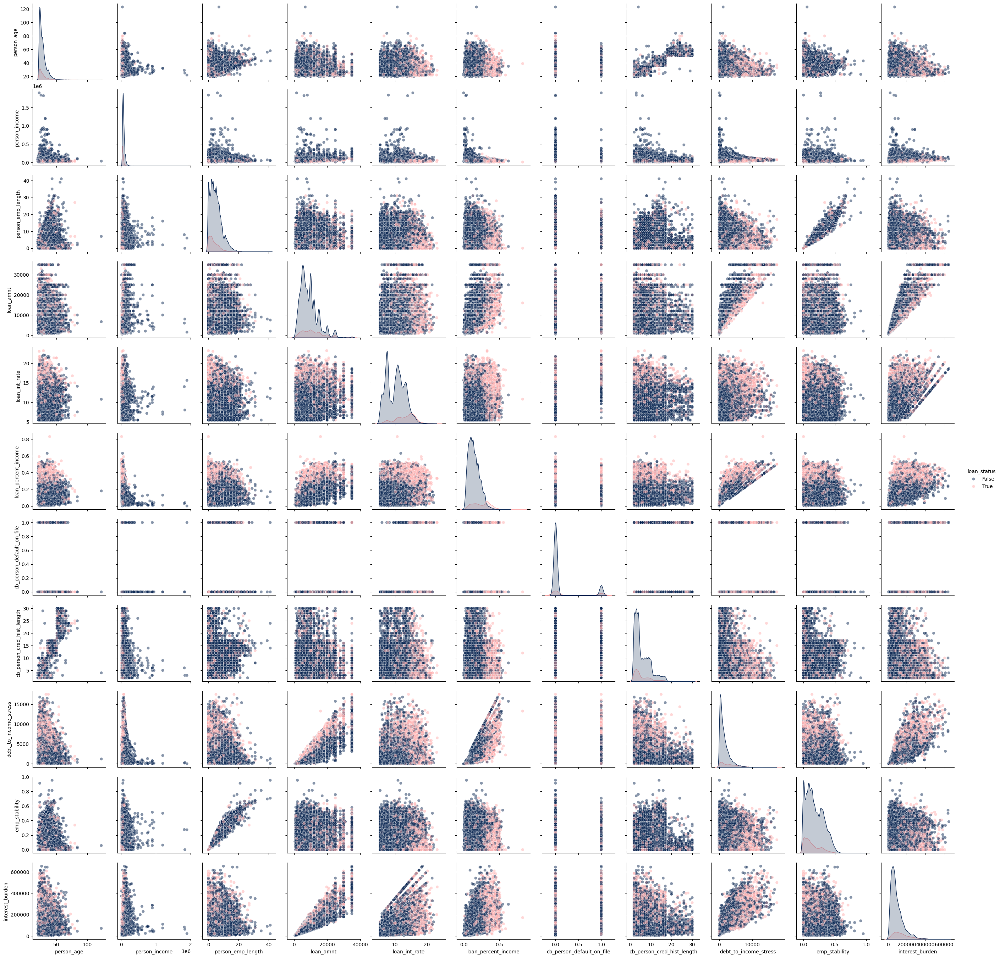

In [76]:
# Add loan status to the dataframe
explore_df.loc[:, "loan_status"] = loan_status_df

# Create a column list
columns = explore_df.columns.to_list()

# Create a pairplot with hue='loan_status' and custom palette
sns.pairplot(explore_df[columns], 
             hue='loan_status',
             plot_kws={'alpha': 0.5},
             palette={0: "#102C57", 1: "#FFB1B1"})  

# Show the plot
plt.show()

### 1. Loan Amount (loan_amnt) vs. Interest Burden (interest_burden)
- `Observation:`
  - There is a strong positive linear correlation between `loan_amnt` and `interest_burden`.
  - `Higher` loan amounts result in `higher` interest burdens, as expected.
  - `Defaulted loans (True)` are more concentrated in the `higher ranges of both loan_amnt and interest_burden`.
- `Insight:`
  - Borrowers with larger loans face a higher interest burden, increasing their likelihood of default. Loan policies should focus on capping the interest burden for high-value loans.

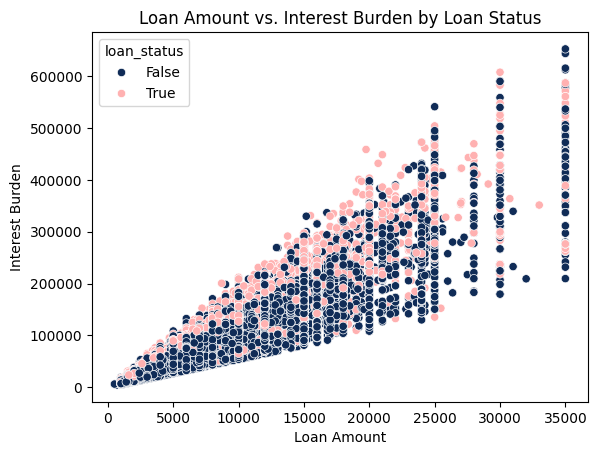

In [77]:
sns.scatterplot(explore_df, x= "loan_amnt", y= "interest_burden", hue= "loan_status", palette={0: "#102C57", 1: "#FFB1B1"})

plt.title("Loan Amount vs. Interest Burden by Loan Status")
plt.xlabel("Loan Amount")
plt.ylabel("Interest Burden")

plt.show()

### 2. Loan Amount (loan_amnt) vs. Loan Percent Income (loan_percent_income)
- `Observation :`
  - There is a visible positive relationship between `loan_amnt` and `loan_percent_income`, but with significant variability.
  - `Defaulted loans` tend to c`luster around higher values of loan_percent_income`, even for loans with moderate amounts.
- `Insight :`
  - `Borrowers with higher loan-to-income ratios are more prone to defaults`, even with moderate loan amounts. Capping this ratio can reduce default risks.

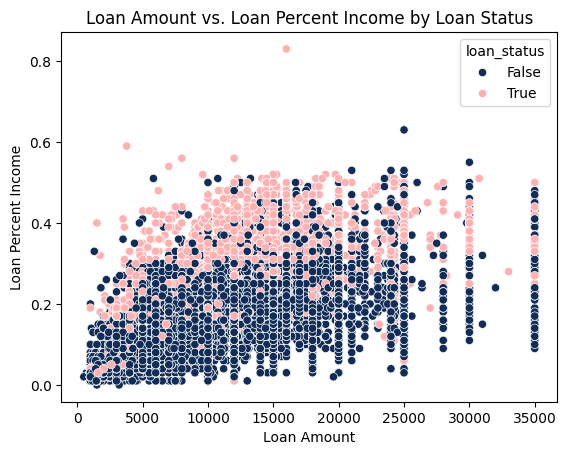

In [78]:
sns.scatterplot(explore_df, x= "loan_amnt", y= "loan_percent_income", hue= "loan_status", palette={0: "#102C57", 1: "#FFB1B1"})

plt.title("Loan Amount vs. Loan Percent Income by Loan Status")
plt.xlabel("Loan Amount")
plt.ylabel("Loan Percent Income")

plt.show()

### 3. Interest Rate (loan_int_rate) vs. Loan Status
- `Observation :`
  - `Higher interest rates` are strongly `associated with defaulted loans (True)`.
  - Most `non-defaulted loans` (False) are `concentrated in the lower interest rate `range (around 8-12%).
- `Insight :`
  - `Interest rates above 12-15% are a key indicator of higher default risks`. Borrowers in this range should be carefully assessed, as they may already be considered high-risk.

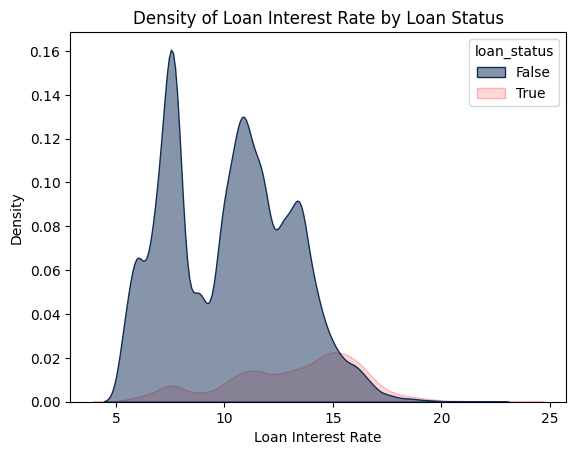

In [79]:
sns.kdeplot(data=explore_df, x="loan_int_rate", hue="loan_status", fill=True, alpha=0.5, palette={0: "#102C57", 1: "#FFB1B1"})

plt.title("Density of Loan Interest Rate by Loan Status")
plt.xlabel("Loan Interest Rate")
plt.ylabel("Density")

plt.show()

### 4. Income (person_income) vs. Debt-to-Income Stress (debt_to_income_stress)
- `Observation :`
  - As expected, `debt-to-income stress` decreases as `income increases`.
  - `Defaulted loans` are concentrated in `lower income ranges` with higher debt-to-income stress.
- `Insight :`
  - `Low-income borrowers with high debt-to-income stress are at the greatest risk of default`. Lending strategies should focus on managing stress levels for low-income groups.

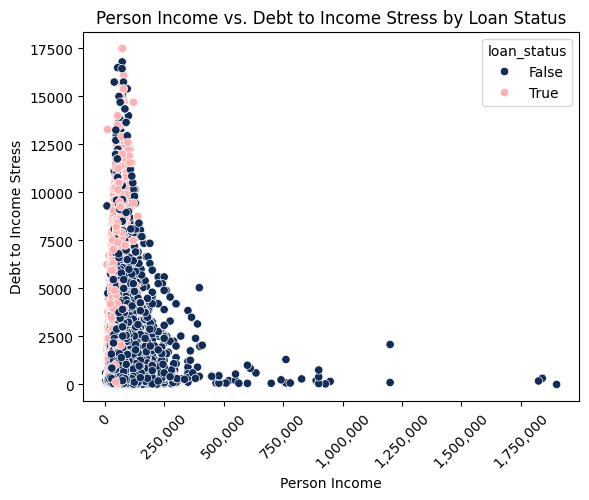

In [80]:
sns.scatterplot(explore_df, x= "person_income", y= "debt_to_income_stress", hue= "loan_status", palette={0: "#102C57", 1: "#FFB1B1"})

plt.title("Person Income vs. Debt to Income Stress by Loan Status")
plt.xlabel("Person Income")
plt.xticks(rotation= 45)
plt.ylabel("Debt to Income Stress")

plt.gca().xaxis.set_major_formatter(mticker.StrMethodFormatter('{x:,.0f}'))

plt.show()

### 5. Employment Length (person_emp_length) vs. Loan Status
- `Observation :`
  - `Non-defaulted loans` (False) show a wider distribution across `longer employment lengths`.
  - `Defaulted loans (True)` are concentrated in s`horter employment lengths` (0-5 years).
- `Insight :`
    - Employment length is a strong predictor of repayment ability. `Borrowers with shorter employment histories should be considered higher-risk.`

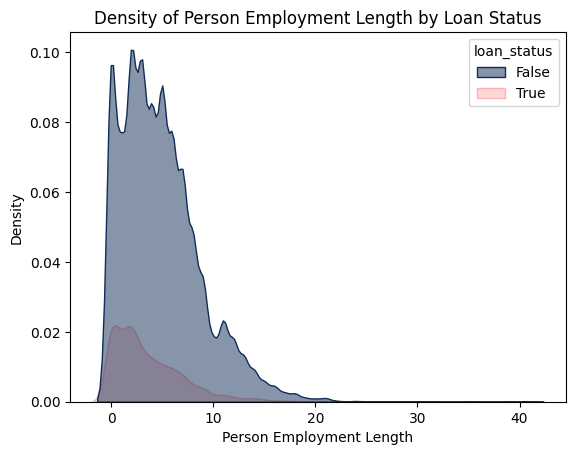

In [81]:
sns.kdeplot(data=explore_df, x="person_emp_length", hue="loan_status", fill=True, alpha=0.5, palette={0: "#102C57", 1: "#FFB1B1"})

plt.title("Density of Person Employment Length by Loan Status")
plt.xlabel("Person Employment Length")
plt.ylabel("Density")

plt.show()

### 6. Credit History Length (cb_person_cred_hist_length) vs. Loan Status
- `Observation :`
  - Borrowers with `longer credit histories` are more likely to fall into the `non-defaulted category` (False).
  - `Defaulted loans` are more common among borrowers with `shorter credit histories`.
- `Insight :`
  - `Short credit histories (<5 years) correlate with higher default risks`. Credit history length should remain a key criterion for loan approval.

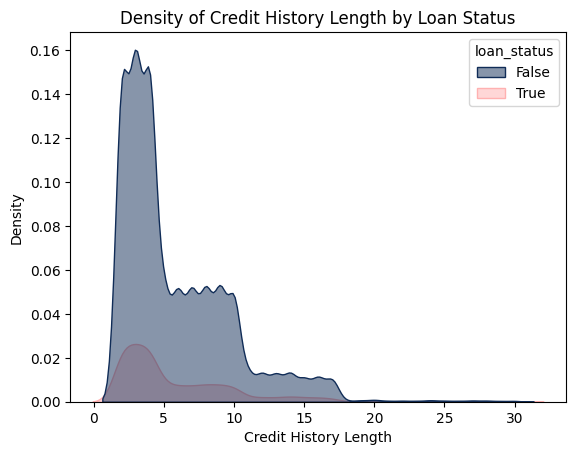

In [82]:
sns.kdeplot(data=explore_df, x="cb_person_cred_hist_length", hue="loan_status", fill=True, alpha=0.5, palette={0: "#102C57", 1: "#FFB1B1"})

plt.title("Density of Credit History Length by Loan Status")
plt.xlabel("Credit History Length")
plt.ylabel("Density")

plt.show()

### 7. Loan Percent Income (loan_percent_income) vs. Interest Rate (loan_int_rate)
- `Observation :`
  - Higher loan-to-income ratios and higher interest rates tend to overlap in defaulted loans.
  - `Non-defaulted loans` are more concentrated `at lower values for both features.`
- `Insight :`
  - The combination of high interest rates and high loan-to-income ratios is a strong signal of default risk. These features should be evaluated together during risk assessment.

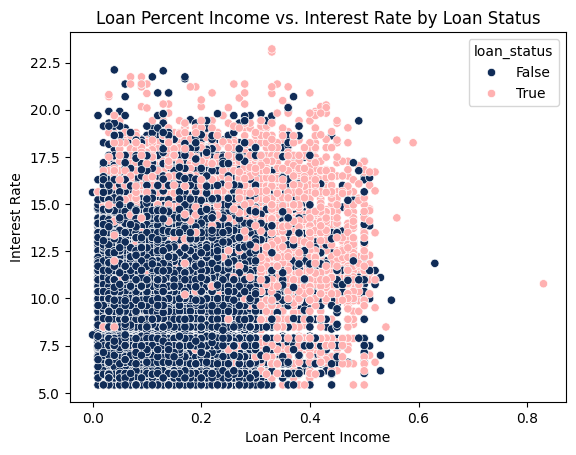

In [83]:
sns.scatterplot(explore_df, x= "loan_percent_income", y= "loan_int_rate", hue= "loan_status", palette={0: "#102C57", 1: "#FFB1B1"})

plt.title("Loan Percent Income vs. Interest Rate by Loan Status")
plt.xlabel("Loan Percent Income")
plt.ylabel("Interest Rate")

plt.show()

### 8. Debt-to-Income Stress vs. Interest Burden
- `Observation :`
  - A clear `positive trend` exists between debt-to-income stress and interest burden.
  - `Defaulted loans (True)` are `concentrated in higher ranges for both metrics`, while non-defaulted loans (False) tend to cluster in lower ranges.
- `Insight :`
  - High debt-to-income stress and interest burden create significant financial pressure on borrowers, increasing default likelihood.

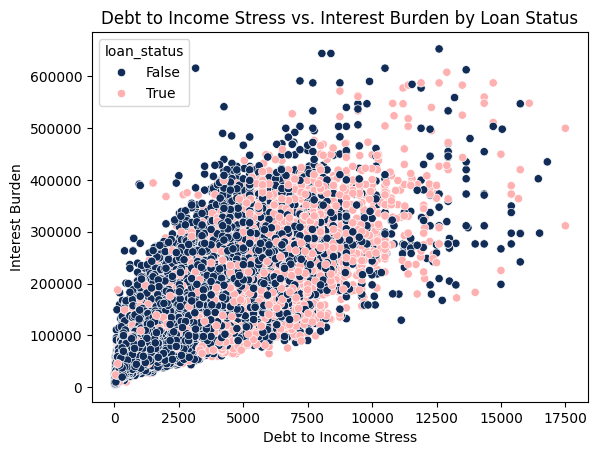

In [84]:
sns.scatterplot(explore_df, x= "debt_to_income_stress", y= "interest_burden", hue= "loan_status", palette={0: "#102C57", 1: "#FFB1B1"})

plt.title("Debt to Income Stress vs. Interest Burden by Loan Status")
plt.xlabel("Debt to Income Stress")
plt.ylabel("Interest Burden")

plt.show()

## Correlation Heatmap

In [85]:
# List of functions to apply to the DataFrame (for data transformation or feature engineering)
function_list = [
    add_age_group,
    add_person_income_group,
    add_emp_length_group,
    classify_loan_grade,
    add_loan_amt_group,
    add_int_rate_group,
    classify_loan_percent_income,
    add_credit_hist_length_group
]

# Apply each function in the function_list to the DataFrame 'explore_df'
for func in function_list:
    explore_df = func(explore_df)

# Iterate over categorical columns to create dummy variables (one-hot encoding)
for dummy in category_column:
    # Generate dummy variables for the current column
    dummies = pd.get_dummies(explore_df[dummy], prefix=dummy, drop_first=False)

    # Concatenate the dummy variables to the original DataFrame
    explore_df = pd.concat([explore_df, dummies], axis=1)

# Create a copy of the updated DataFrame to clean up and prepare the final DataFrame
explore_df_clean = explore_df.copy()

# Remove the original categorical columns after creating dummy variables
for drop in category_column:
    explore_df_clean.drop(drop, axis=1, inplace=True)

# Define the column to move (typically the target variable) to the end of the DataFrame
column_to_move = 'loan_status'

# Rearrange the columns to move 'loan_status' to the end
columns = [col for col in explore_df_clean.columns if col != column_to_move] + [column_to_move]

# Reorganize the DataFrame columns in the new order
explore_df_clean = explore_df_clean[columns]

# Display the first few rows of the cleaned and transformed DataFrame
explore_df_clean.head()


,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,debt_to_income_stress,emp_stability,interest_burden,...,income_group_40k-60k,income_group_60k-80k,income_group_80k-100k,income_group_100k+,loan_amt_group_Small,loan_amt_group_Medium,loan_amt_group_Large,loan_amt_group_Very Large,loan_amt_group_Extreme,loan_status
0,37,35000,0.000,6000,11.490,0.170,14,1020.000,0.000,68940.000,...,False,False,False,False,False,True,False,False,False,False
1,22,56000,6.000,4000,13.350,0.070,2,280.000,0.273,53400.000,...,True,False,False,False,True,False,False,False,False,False
2,29,28800,8.000,6000,8.900,0.210,10,1260.000,0.276,53400.000,...,False,False,False,False,False,True,False,False,False,False
3,30,70000,14.000,12000,11.110,0.170,5,2040.000,0.467,133320.000,...,False,True,False,False,False,False,False,True,False,False
4,22,60000,2.000,6000,6.920,0.100,3,600.000,0.091,41520.000,...,True,False,False,False,False,True,False,False,False,False


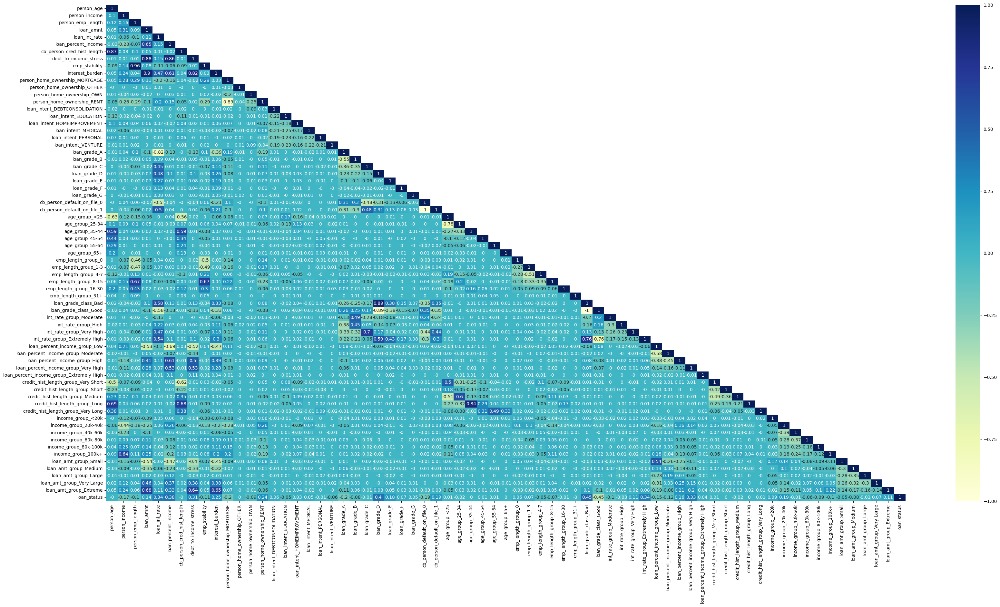

In [86]:
# Get a list of all column names in the cleaned DataFrame
columns = explore_df_clean.columns.to_list()

# Calculate the correlation matrix for all columns in the DataFrame
corr = explore_df_clean[columns].corr().round(2)  # Round correlation values to 2 decimal places

# Drop the row corresponding to 'int_rate_group_Low' from the correlation matrix
corr.drop("int_rate_group_Low", axis=0, inplace=True)

# Drop the column corresponding to 'int_rate_group_Low' from the correlation matrix
corr.drop("int_rate_group_Low", axis=1, inplace=True)

# Create an upper triangular mask for the heatmap to avoid duplicate correlation values
mask = np.triu(np.ones_like(corr, dtype=bool), k=1)  # k=1 excludes the diagonal

# Set the figure size for the heatmap
plt.figure(figsize=(40, 20))

# Plot the heatmap of the correlation matrix
sns.heatmap(
    corr,           
    annot=True,     
    cmap="YlGnBu",  
    mask=mask       
)

# Display the heatmap
plt.show()


### Summary of Correlation with Loan Status :
The analysis reveals insights into the factors most closely correlated with loan_status. These features highlight key aspects of borrower behavior, loan characteristics, and financial metrics that influence loan outcomes.

#### Key Features with High Correlation :
- `loan_grade_class_Bad (0.45) :`
  - A positive correlation suggests that loans classified as "Bad" have a notable association with adverse outcomes in loan_status. This is expected, as the "Bad" grade likely aggregates risk factors.
- `loan_grade_class_Good (-0.45) :` 
  - A negative correlation indicates that loans graded as "Good" are associated with favorable loan outcomes. This complements the "Bad" grade, showing a clear split in loan performance based on creditworthiness. 
- `loan_grade_D (0.40) :`
  - A moderately strong correlation reflects that borrowers graded as "D" also show significant risks or adverse loan outcomes. This may represent a middle tier between high-risk and low-risk borrowers.
- `loan_percent_income (0.38) :`
  - A positive correlation suggests that a higher percentage of income spent on loans is associated with poor loan performance. Borrowers allocating more of their income to loan repayments may be at a higher risk of default.
- `loan_int_rate (0.34) :`
  - A moderately strong positive correlation suggests that higher interest rates are linked to adverse loan outcomes. This could reflect the increased financial strain on borrowers due to higher repayment obligations. It also indicates that higher-risk borrowers are often charged higher rates, leading to a stronger relationship with loan performance.  

#### Patterns and Implications :
- `Loan Grade Features are critical predictors :`
  - Grades (e.g., loan_grade_class_Bad, loan_grade_class_Good, loan_grade_D) show strong correlations, indicating their predictive power.
  - These classifications condense various risk-related factors into a single metric, making them highly useful for modeling loan outcomes.
- `Borrower's Financial Strain :`
  - Features like `loan_percent_income` and `loan_int_rate` reflect financial burdens on borrowers. High correlations highlight their importance as indicators of repayment difficulty.
- `Interest Rate Reflect Risk Profiles :`
  - The correlation between `loan_int_rate` and `loan_status` emphasizes the importance of understanding pricing dynamics. Loans with higher interest rates often signify higher credit risk.

#### Actionable Insights :
- `Focus on Loan Grade Features :`
  - `loan_grade_class_Bad` and `loan_grade_class_Good` should be high-priority features in predictive models. Their binary nature simplifies classification and aids in separating risky loans from safer ones.
- `Monitor Borrower's Financial Metrics :`
  - Features like `loan_percent_income` and `loan_int_rate` could serve as early warning signs of potential defaults. Adjusting loan pricing strategies may improve portfolio outcomes.

In [87]:
# Calculate the absolute correlations with the target variable 'loan_status'
correlations_with_loan_status = corr['loan_status'].abs().sort_values(ascending=False)

# Display the top 20 features with the highest absolute correlation with 'loan_status'
correlations_with_loan_status.head(20)

loan_status                           1.000
loan_grade_class_Bad                  0.450
loan_grade_class_Good                 0.450
loan_grade_D                          0.400
loan_percent_income                   0.380
int_rate_group_Extremely High         0.340
loan_int_rate                         0.340
loan_percent_income_group_Very High   0.330
debt_to_income_stress                 0.310
interest_burden                       0.250
person_home_ownership_RENT            0.240
loan_grade_A                          0.200
person_home_ownership_MORTGAGE        0.200
cb_person_default_on_file_1           0.190
cb_person_default_on_file_0           0.190
income_group_20k-40k                  0.190
loan_grade_E                          0.180
person_income                         0.170
loan_percent_income_group_High        0.160
loan_percent_income_group_Low         0.150
Name: loan_status, dtype: float64

In [88]:
correlations_with_loan_status = corr['loan_status']

correlations_with_loan_status.to_csv("correlation.csv")

## Function for generating dataframe for ploting stacked bar

The `generate_df( )` function is designed to prepare data for plotting stacked bar charts, providing both count-based and proportion-based DataFrames.

1. **Group Data to Calculate Counts :**
   - The function groups the input DataFrame (df) based on the specified `groupby_condition` to calculate the counts of each combination in the group:
     - `groupby_condition` : A list of columns to group by,
     - `.size( )` : Calculates the count of rows for each group.
     - `reset_index(name=values_name)` : Converts the grouped data into a DataFrame and names the count column as specified by values_name.
2.  **Pivot the Data for Stacked Bar Chart**
   - The grouped data is pivoted to create a format suitable for stacked bar charts:
     - The `index` parameter specifies the main grouping column.
     - The `columns` parameter creates separate columns for each value in the second grouping condition.
     - `.fillna(0)`: Replaces any missing values with 0 to handle cases where a group may not exist.
     - Column names are updated for clarity.
3. **Sort by Total Counts :**
   - The DataFrame is sorted based on the specified column (`sort_value_name`) to order the bars in the stacked bar chart.
4. **Calculate Total Counts :**
   - A new column is added to represent the total counts for each category.
5. **Normalize for Proportions :**
   - The counts are normalized to calculate the proportions for each category.
     - `.div(...., axis= 0)` : Divides each count by the total count row-wise to calculate proportions.
6. **Sort by Proportion of "Default" :**
   - The proportion DataFrame is also sorted by the specified column for consistent ordering.
7. **Return Results :**
   - The function returns two DataFrames :
     - `category_counts_pivot` : For counts-based stacked bar charts.
     - `category_proportions_pivot` : For proportion-based stacked bar charts.

This function automates the preparation of data for creating stacked bar charts, which can be used to:
   - Visualize the distribution of `default (loan_status == 1)` and `non-default (loan_status == 0)` loans across different categories.
   - Compare counts and proportions within each category for better insights.

In [89]:
# Function for generating dataframe for plotting stacked bar
def generate_df(df, groupby_condition, values_name, col_names, sort_value_name, total_name, ) :
    
    # Group the data to calculate counts for Default (loan_status == 1) and Not Default (loan_status == 0)
    category_counts = (
        df.groupby(groupby_condition)
        .size()
        .reset_index(name= values_name)
    )

    # Pivot the data to prepare for stacked bar chart (counts)
    category_counts_pivot = category_counts.pivot(index= groupby_condition[0], columns= groupby_condition[1], values= values_name).fillna(0)
    category_counts_pivot.columns = col_names  # Rename columns for clarity

    # Sort by total counts for the stacked bar chart of counts
    category_counts_pivot = category_counts_pivot.sort_values(by= sort_value_name, ascending=False)

    # Add to total count of loan
    category_counts_pivot[total_name] = category_counts_pivot[col_names[0]] + category_counts_pivot[col_names[1]]

    # Normalize the counts to get proportions
    category_proportions_pivot = category_counts_pivot.div(category_counts_pivot[total_name], axis=0)

    # Sort by proportion of "Default" for the stacked bar chart of proportions
    category_proportions_pivot = category_proportions_pivot.sort_values(by= sort_value_name, ascending=False)

    return category_counts_pivot, category_proportions_pivot

## Function for generating stacked bar

The `plot_stacked( )` function generates two stacked bar charts: one for counts and the other for proportions. These charts provide a visual representation of the distribution of categories and their respective proportions. Here's a detailed breakdown of the function:
  1. **Function Parameters :**
      - `df_list` : A list of two DataFrames :
        - The first DataFrame contains counts for the stacked bar chart.
        - The second DataFrame contains proportions for the proportion-based stacked bar chart.
      - `bottom_bar` : The column name representing the bottom part of the stacked bar (e.g., "Default").
      - `top_bar` : The column name representing the top part of the stacked bar
      - `title_list` : A list of titles for the two charts.
      - `y_label_list` : A list of Y-axis labels for the two charts.
      - `x_label` : The X-axis label shared by both charts.
      - `legend_title` : The title for the legend shared by both charts.
  2. **Set up Subplots :**
      - Creates a figure with two subplot arranged vertically (nrows = 2)
      - `figsize = (10,10)` sets the dimensions of the figure
  3. **Plot Stacked Bar Chart for Counts :** 
      - Plots the bottom part of the stacked bar using the first DataFrame.
      - Plots the top part of the stacked bar on top of the `bottom_bar`.
      - Sets the chart title, X and Y labels, legend, and rotates X-axis ticks for readability.
  4. **Plot Stacked Bar Chart for Proportions :**
      - Similar to the counts chart, but uses the second DataFrame for proportions.
  5. **Adjust Layout :**
      - Ensures proper spacing between subplots to avoid overlapping.
    
This function creates visually clear stacked bar charts for:
- Comparing counts between categories (e.g., "Default" and "Not Default").
- Analyzing category proportions within the total.

In [90]:
# Function for generating for plotting stacked bar
def plot_stacked(df_list, bottom_bar, top_bar, title_list, y_label_list, x_label, legend_title) :

    # Plot the stacked bar charts
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 10))

    # First stacked bar chart for count
    # Bottom stacked
    axes[0].bar(
        df_list[0].index,
        df_list[0][bottom_bar],
        label= bottom_bar,
        color= "#FFB1B1",
        edgecolor= "black"
    )

    # Top stacked
    axes[0].bar(
        df_list[0].index,
        df_list[0][top_bar],
        bottom= df_list[0][bottom_bar],
        label= top_bar,
        color= "#102C57",
        edgecolor= "black"
    )
    axes[0].set_title(title_list[0])
    axes[0].set_ylabel(y_label_list[0])
    axes[0].set_xlabel(x_label)
    axes[0].legend(title= legend_title, bbox_to_anchor=(1.05, 1), loc="upper left")
    axes[0].tick_params(axis= "x", rotation=45)

    # Second stacked bar chart for proportions
    axes[1].bar(
        df_list[1].index,
        df_list[1][bottom_bar],
        label= bottom_bar,
        color= "#FFB1B1",
        edgecolor= "black"
    )
    axes[1].bar(
        df_list[1].index,
        df_list[1][top_bar],
        bottom= df_list[1][bottom_bar],
        label= top_bar,
        color= "#102C57",
        edgecolor= "black"
    )
    axes[1].set_title(title_list[1])
    axes[1].set_ylabel(y_label_list[1])
    axes[1].set_xlabel(x_label)
    axes[1].legend(title= legend_title, bbox_to_anchor=(1.05, 1), loc="upper left")
    axes[1].tick_params(axis="x", rotation=45)
    axes[1].set_yticks([i / 10 for i in range(0, 11)])

    # Adjust layout
    plt.tight_layout()

    # Show the plots
    plt.show()

In [91]:
df = pd.read_csv("train.csv")

## The number of loan in each loan intent

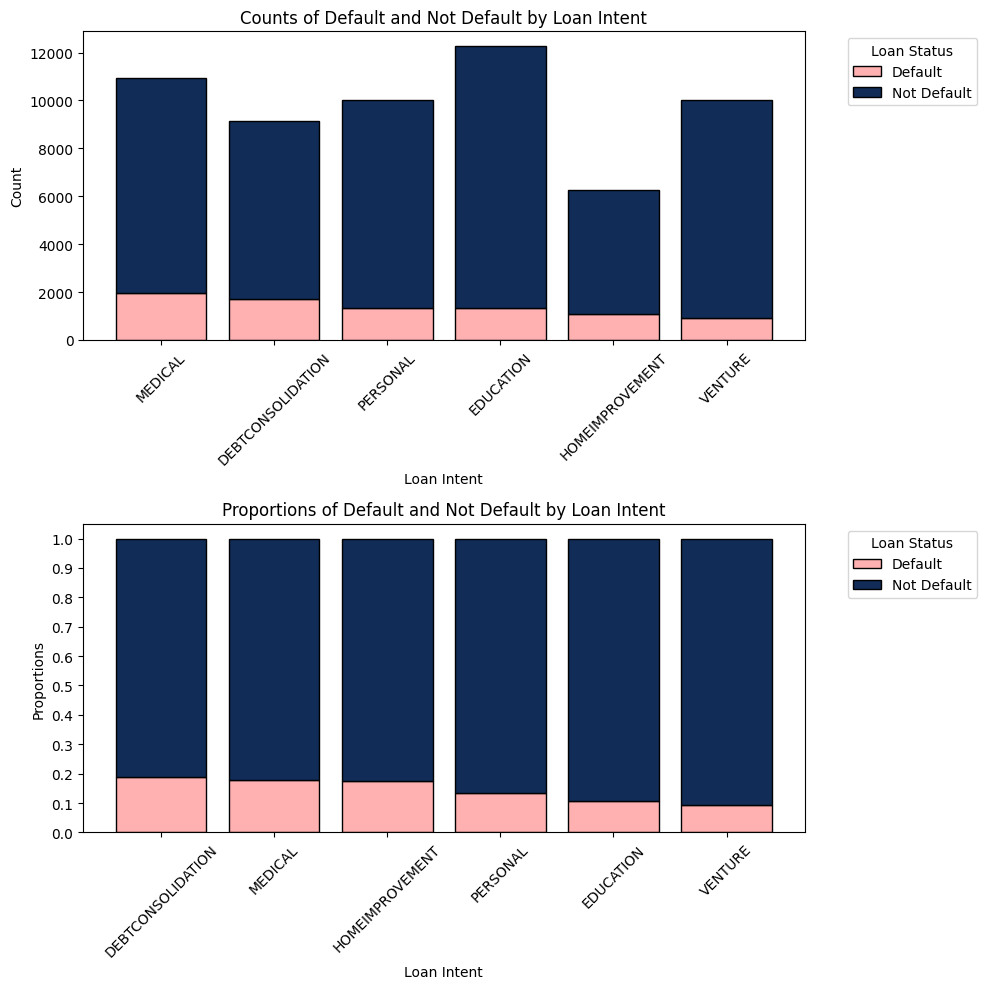

                   Not Default  Default  Total Loans
loan_intent                                         
MEDICAL                   8985     1949        10934
DEBTCONSOLIDATION         7404     1729         9133
PERSONAL                  8686     1330        10016
EDUCATION                10949     1322        12271
HOMEIMPROVEMENT           5189     1091         6280
VENTURE                   9082      929        10011 

                   Not Default  Default  Total Loans
loan_intent                                         
DEBTCONSOLIDATION        0.811    0.189        1.000
MEDICAL                  0.822    0.178        1.000
HOMEIMPROVEMENT          0.826    0.174        1.000
PERSONAL                 0.867    0.133        1.000
EDUCATION                0.892    0.108        1.000
VENTURE                  0.907    0.093        1.000


In [92]:
loan_intent_count, loan_intent_proportion = generate_df(
                                                        df= df,
                                                        groupby_condition= ["loan_intent", "loan_status"],
                                                        values_name= "Count",
                                                        col_names= ["Not Default", "Default"],
                                                        sort_value_name= "Default",
                                                        total_name= "Total Loans"
    )

plot_stacked(
            df_list= [loan_intent_count, loan_intent_proportion],
            bottom_bar= "Default",
            top_bar= "Not Default",
            title_list= ["Counts of Default and Not Default by Loan Intent", "Proportions of Default and Not Default by Loan Intent"],
            y_label_list= ["Count", "Proportions"],
            x_label= "Loan Intent",
            legend_title= "Loan Status"
)

print(loan_intent_count, "\n")

print(loan_intent_proportion)

## The number of loan in each person income group

/var/folders/sx/x_0znzqn4x19b07rxqhhxxgh0000gn/T/ipykernel_29282/3166141051.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(groupby_condition)


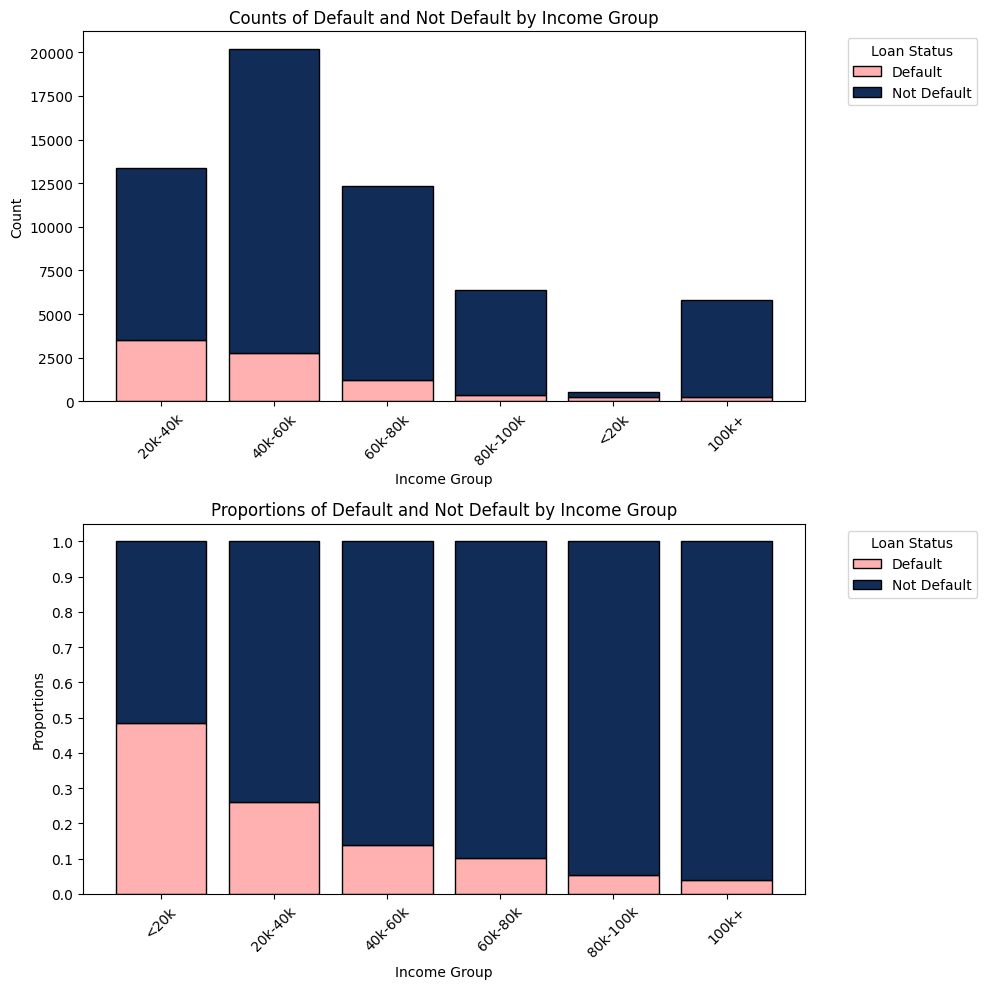

              Not Default  Default  Total Loans
income_group                                   
20k-40k              9891     3507        13398
40k-60k             17418     2779        20197
60k-80k             11072     1241        12313
80k-100k             6047      345         6392
<20k                  272      256          528
100k+                5594      221         5815 

              Not Default  Default  Total Loans
income_group                                   
<20k                0.515    0.485        1.000
20k-40k             0.738    0.262        1.000
40k-60k             0.862    0.138        1.000
60k-80k             0.899    0.101        1.000
80k-100k            0.946    0.054        1.000
100k+               0.962    0.038        1.000


In [93]:
person_income_group_count, person_income_group_proportion = generate_df(
                                                        df= explore_df,
                                                        groupby_condition= ["income_group", "loan_status"],
                                                        values_name= "Count",
                                                        col_names= ["Not Default", "Default"],
                                                        sort_value_name= "Default",
                                                        total_name= "Total Loans"
    )

plot_stacked(
            df_list= [person_income_group_count, person_income_group_proportion],
            bottom_bar= "Default",
            top_bar= "Not Default",
            title_list= ["Counts of Default and Not Default by Income Group", "Proportions of Default and Not Default by Income Group"],
            y_label_list= ["Count", "Proportions"],
            x_label= "Income Group",
            legend_title= "Loan Status"
)

print(person_income_group_count, "\n")

print(person_income_group_proportion)

## The number of loan in each loan amount group

/var/folders/sx/x_0znzqn4x19b07rxqhhxxgh0000gn/T/ipykernel_29282/3166141051.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(groupby_condition)


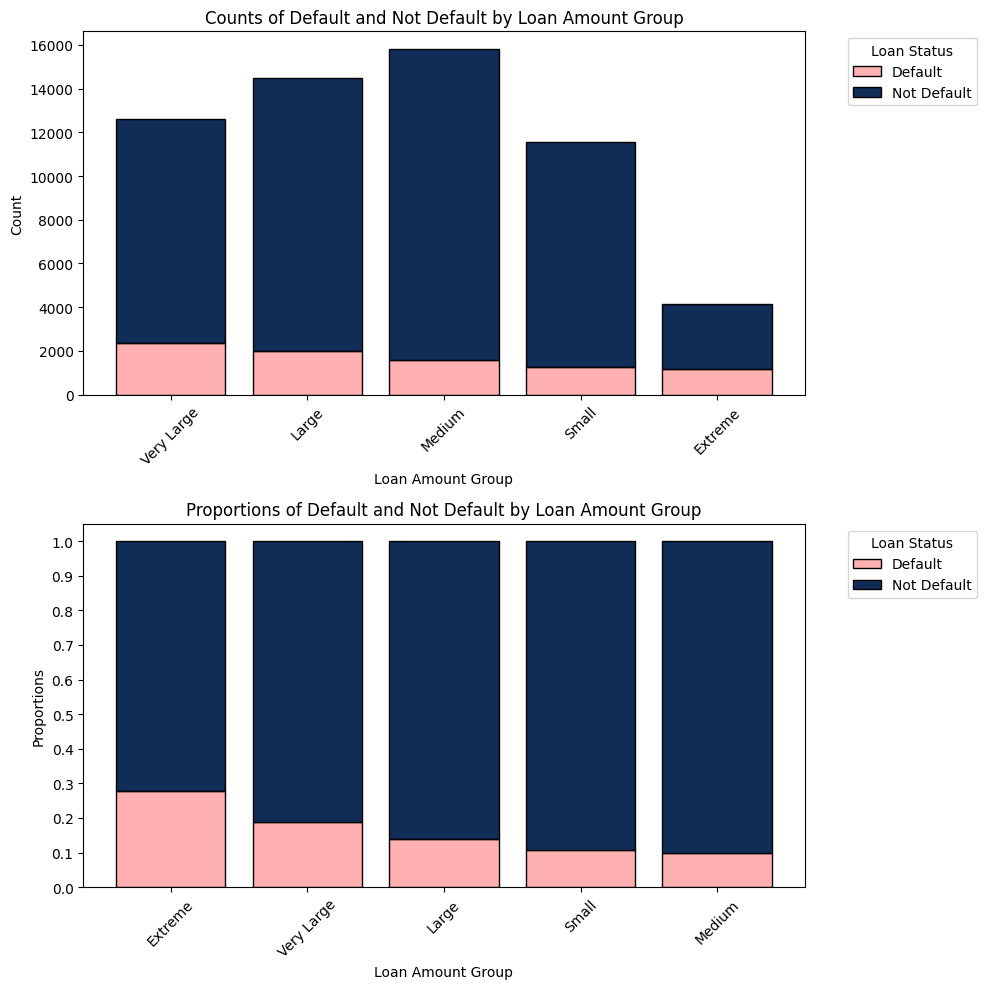

                Not Default  Default  Total Loans
loan_amt_group                                   
Very Large            10235     2384        12619
Large                 12467     1999        14466
Medium                14267     1562        15829
Small                 10316     1253        11569
Extreme                3009     1151         4160 

                Not Default  Default  Total Loans
loan_amt_group                                   
Extreme               0.723    0.277        1.000
Very Large            0.811    0.189        1.000
Large                 0.862    0.138        1.000
Small                 0.892    0.108        1.000
Medium                0.901    0.099        1.000


In [94]:
loan_amount_group_count, loan_amount_group_proportion = generate_df(
                                                        df= explore_df,
                                                        groupby_condition= ["loan_amt_group", "loan_status"],
                                                        values_name= "Count",
                                                        col_names= ["Not Default", "Default"],
                                                        sort_value_name= "Default",
                                                        total_name= "Total Loans"
    )

plot_stacked(
            df_list= [loan_amount_group_count, loan_amount_group_proportion],
            bottom_bar= "Default",
            top_bar= "Not Default",
            title_list= ["Counts of Default and Not Default by Loan Amount Group", "Proportions of Default and Not Default by Loan Amount Group"],
            y_label_list= ["Count", "Proportions"],
            x_label= "Loan Amount Group",
            legend_title= "Loan Status"
)

print(loan_amount_group_count, "\n")

print(loan_amount_group_proportion)

## The number of loan in each loan grade

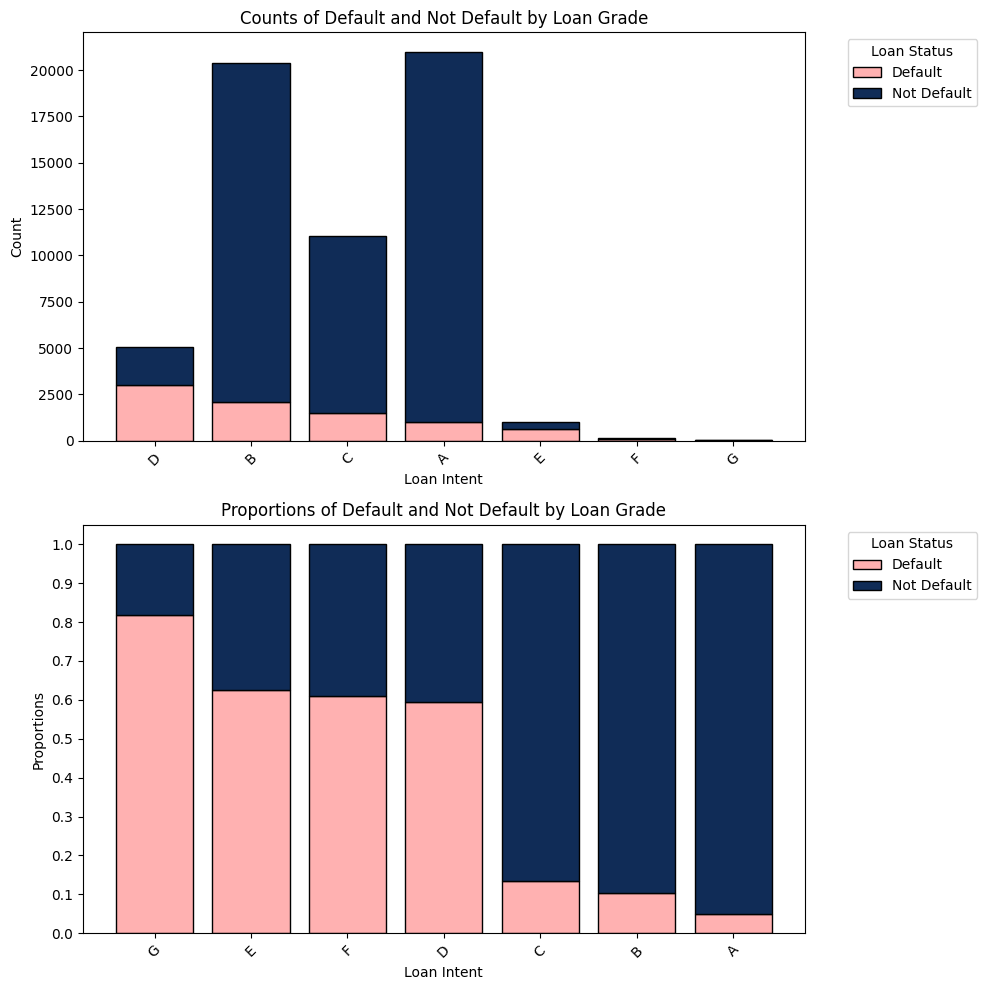

            Not Default  Default  Total Loans
loan_grade                                   
D                  2046     2988         5034
B                 18313     2087        20400
C                  9542     1494        11036
A                 19952     1032        20984
E                   378      631         1009
F                    58       91          149
G                     6       27           33 

            Not Default  Default  Total Loans
loan_grade                                   
G                 0.182    0.818        1.000
E                 0.375    0.625        1.000
F                 0.389    0.611        1.000
D                 0.406    0.594        1.000
C                 0.865    0.135        1.000
B                 0.898    0.102        1.000
A                 0.951    0.049        1.000


In [95]:
loan_grade_count, loan_grade_proportion = generate_df(
                                                        df= df,
                                                        groupby_condition= ["loan_grade", "loan_status"],
                                                        values_name= "Count",
                                                        col_names= ["Not Default", "Default"],
                                                        sort_value_name= "Default",
                                                        total_name= "Total Loans"
    )

plot_stacked(
            df_list= [loan_grade_count, loan_grade_proportion],
            bottom_bar= "Default",
            top_bar= "Not Default",
            title_list= ["Counts of Default and Not Default by Loan Grade", "Proportions of Default and Not Default by Loan Grade"],
            y_label_list= ["Count", "Proportions"],
            x_label= "Loan Intent",
            legend_title= "Loan Status"
)

print(loan_grade_count, "\n")

print(loan_grade_proportion)

## The number of loan in each loan grade class

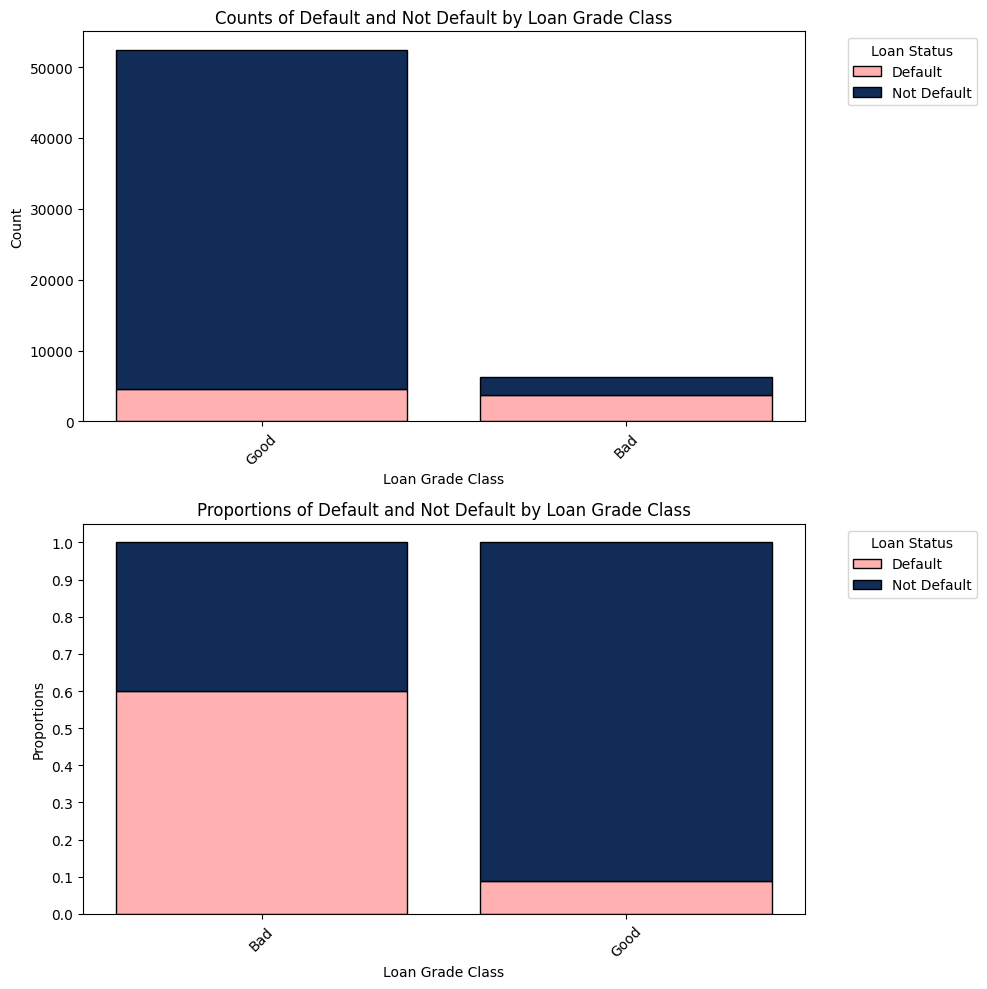

                  Not Default  Default  Total Loans
loan_grade_class                                   
Good                    47806     4613        52419
Bad                      2488     3736         6224 

                  Not Default  Default  Total Loans
loan_grade_class                                   
Bad                     0.400    0.600        1.000
Good                    0.912    0.088        1.000


In [96]:
loan_grade_class_count, loan_grade_class_proportion = generate_df(
                                                        df= explore_df,
                                                        groupby_condition= ["loan_grade_class", "loan_status"],
                                                        values_name= "Count",
                                                        col_names= ["Not Default", "Default"],
                                                        sort_value_name= "Default",
                                                        total_name= "Total Loans"
    )

plot_stacked(
            df_list= [loan_grade_class_count, loan_grade_class_proportion],
            bottom_bar= "Default",
            top_bar= "Not Default",
            title_list= ["Counts of Default and Not Default by Loan Grade Class", "Proportions of Default and Not Default by Loan Grade Class"],
            y_label_list= ["Count", "Proportions"],
            x_label= "Loan Grade Class",
            legend_title= "Loan Status"
)

print(loan_grade_class_count, "\n")

print(loan_grade_class_proportion)

## The number of loan in each person default on file status

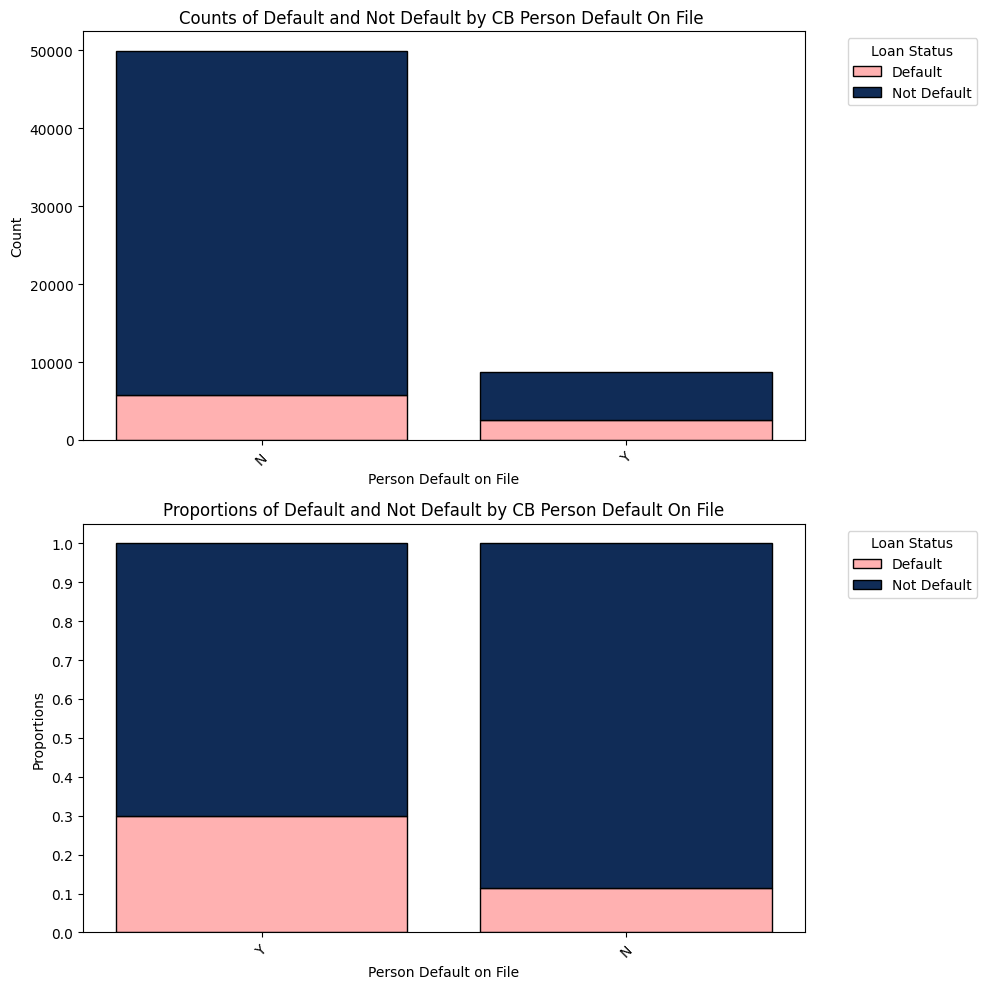

                           Not Default  Default  Total Loans
cb_person_default_on_file                                   
N                                44194     5749        49943
Y                                 6101     2601         8702 

                           Not Default  Default  Total Loans
cb_person_default_on_file                                   
Y                                0.701    0.299        1.000
N                                0.885    0.115        1.000


In [97]:
person_default_on_file_status_count, person_default_on_file_status_proportion = generate_df(
                                                        df= df,
                                                        groupby_condition= ["cb_person_default_on_file", "loan_status"],
                                                        values_name= "Count",
                                                        col_names= ["Not Default", "Default"],
                                                        sort_value_name= "Default",
                                                        total_name= "Total Loans"
    )

plot_stacked(
            df_list= [person_default_on_file_status_count, person_default_on_file_status_proportion],
            bottom_bar= "Default",
            top_bar= "Not Default",
            title_list= ["Counts of Default and Not Default by CB Person Default On File ", "Proportions of Default and Not Default by CB Person Default On File"],
            y_label_list= ["Count", "Proportions"],
            x_label= "Person Default on File",
            legend_title= "Loan Status"
)

print(person_default_on_file_status_count, "\n")

print(person_default_on_file_status_proportion)

## The number of loan in each age group

/var/folders/sx/x_0znzqn4x19b07rxqhhxxgh0000gn/T/ipykernel_29282/3166141051.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(groupby_condition)


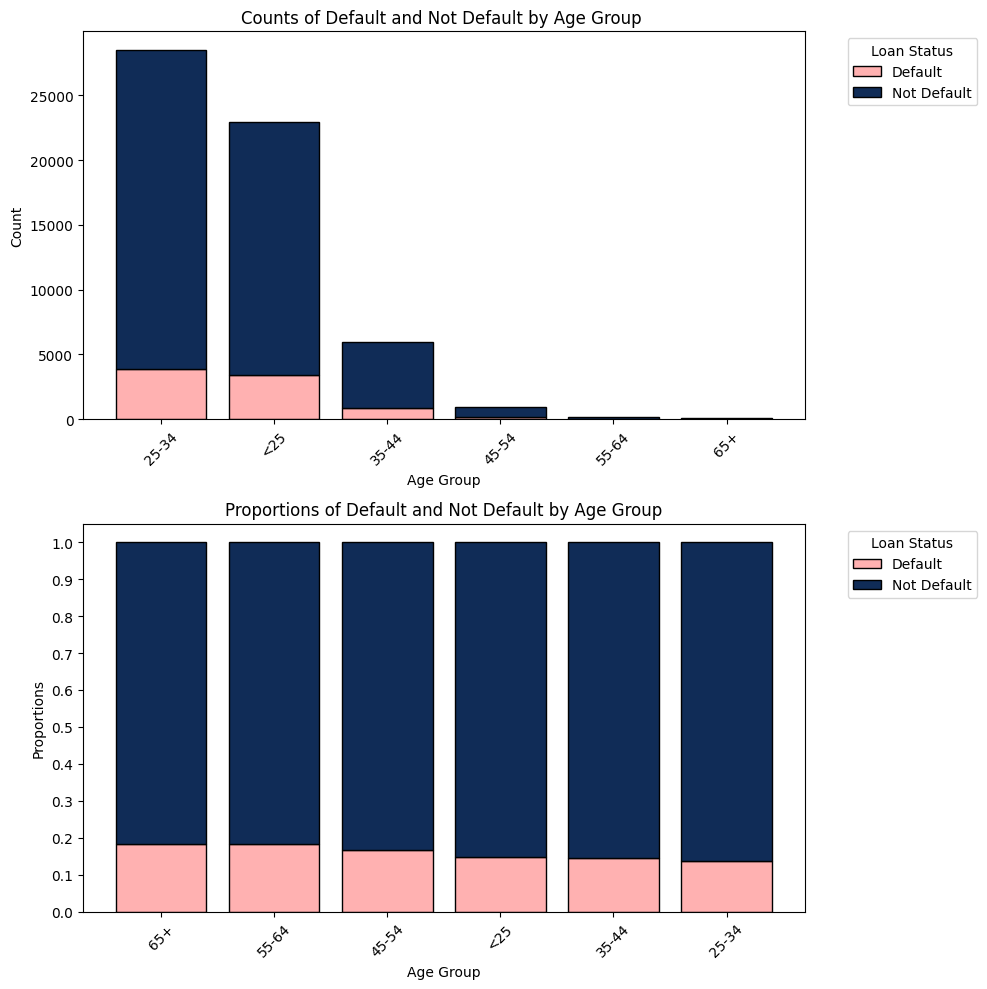

           Not Default  Default  Total Loans
age_group                                   
25-34            24650     3879        28529
<25              19573     3405        22978
35-44             5096      867         5963
45-54              782      155          937
55-64              153       34          187
65+                 40        9           49 

           Not Default  Default  Total Loans
age_group                                   
65+              0.816    0.184        1.000
55-64            0.818    0.182        1.000
45-54            0.835    0.165        1.000
<25              0.852    0.148        1.000
35-44            0.855    0.145        1.000
25-34            0.864    0.136        1.000


In [98]:
age_group_count, age_group_proportion = generate_df(
                                                        df= explore_df,
                                                        groupby_condition= ["age_group", "loan_status"],
                                                        values_name= "Count",
                                                        col_names= ["Not Default", "Default"],
                                                        sort_value_name= "Default",
                                                        total_name= "Total Loans"
    )

plot_stacked(
            df_list= [age_group_count, age_group_proportion],
            bottom_bar= "Default",
            top_bar= "Not Default",
            title_list= ["Counts of Default and Not Default by Age Group ", "Proportions of Default and Not Default by Age Group"],
            y_label_list= ["Count", "Proportions"],
            x_label= "Age Group",
            legend_title= "Loan Status"
)

print(age_group_count, "\n")

print(age_group_proportion)

## The number of loan in each int_rate_group

/var/folders/sx/x_0znzqn4x19b07rxqhhxxgh0000gn/T/ipykernel_29282/3166141051.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(groupby_condition)


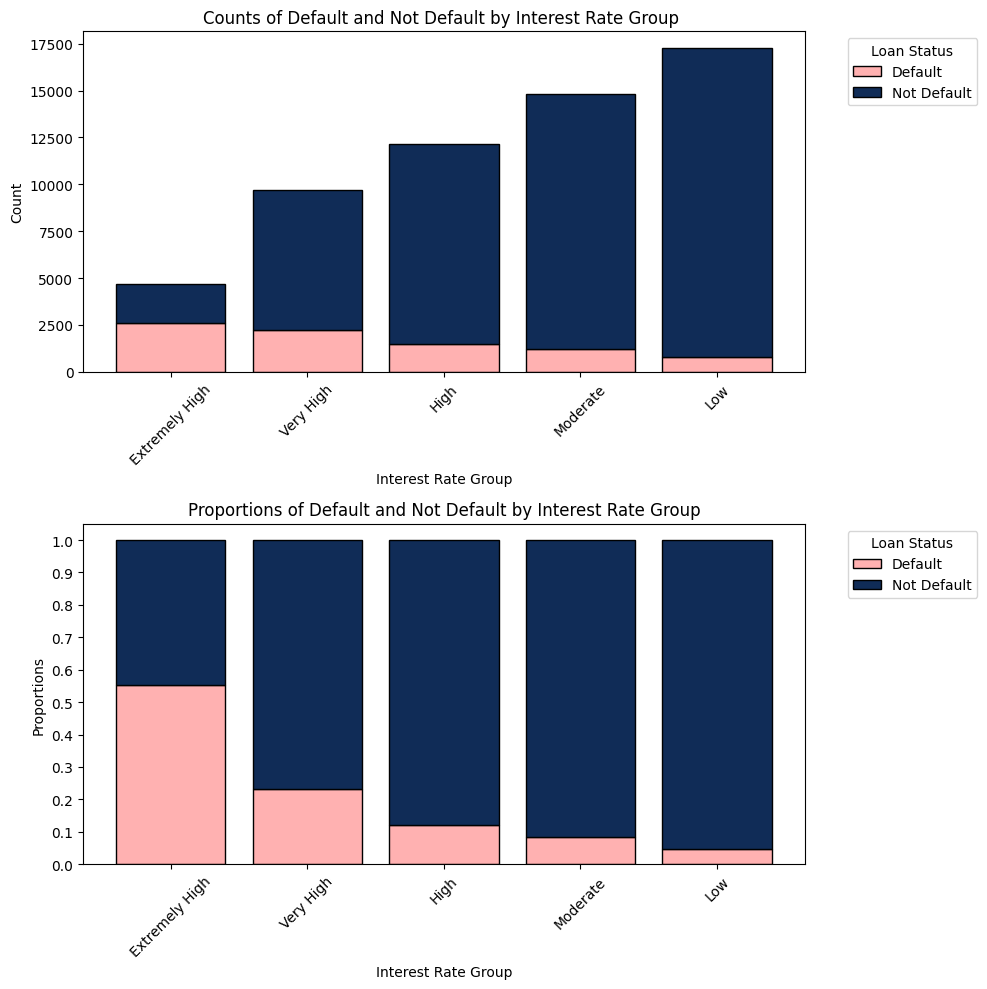

                Not Default  Default  Total Loans
int_rate_group                                   
Extremely High         2102     2584         4686
Very High              7423     2249         9672
High                  10683     1486        12169
Moderate              13582     1239        14821
Low                   16504      791        17295 

                Not Default  Default  Total Loans
int_rate_group                                   
Extremely High        0.449    0.551        1.000
Very High             0.767    0.233        1.000
High                  0.878    0.122        1.000
Moderate              0.916    0.084        1.000
Low                   0.954    0.046        1.000


In [99]:
int_rate_group_count, int_rate_group_proportion = generate_df(
                                                        df= explore_df,
                                                        groupby_condition= ["int_rate_group", "loan_status"],
                                                        values_name= "Count",
                                                        col_names= ["Not Default", "Default"],
                                                        sort_value_name= "Default",
                                                        total_name= "Total Loans"
    )

plot_stacked(
            df_list= [int_rate_group_count, int_rate_group_proportion],
            bottom_bar= "Default",
            top_bar= "Not Default",
            title_list= ["Counts of Default and Not Default by Interest Rate Group ", "Proportions of Default and Not Default by Interest Rate Group"],
            y_label_list= ["Count", "Proportions"],
            x_label= "Interest Rate Group",
            legend_title= "Loan Status"
)

print(int_rate_group_count, "\n")

print(int_rate_group_proportion)

## The number of loan in each loan percent income group

/var/folders/sx/x_0znzqn4x19b07rxqhhxxgh0000gn/T/ipykernel_29282/3166141051.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(groupby_condition)


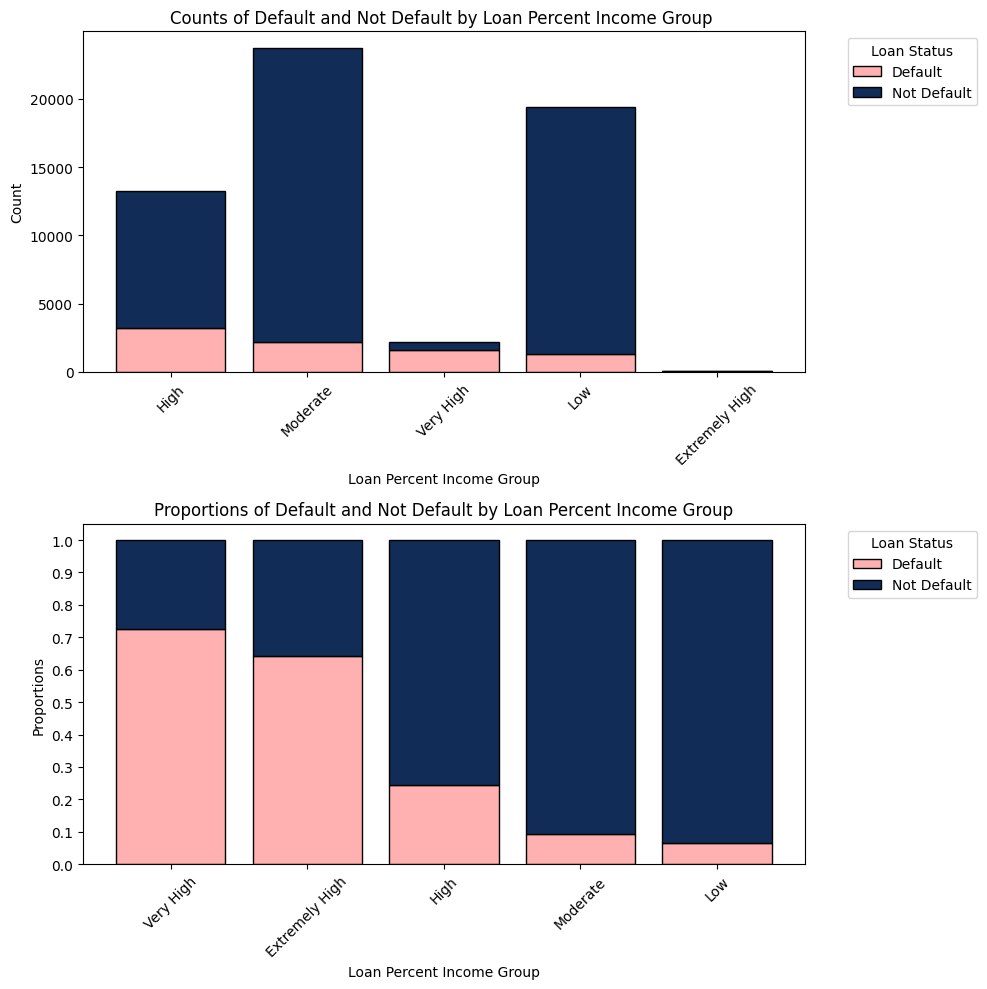

                           Not Default  Default  Total Loans
loan_percent_income_group                                   
High                              9980     3240        13220
Moderate                         21584     2183        23767
Very High                          608     1605         2213
Low                              18108     1296        19404
Extremely High                      14       25           39 

                           Not Default  Default  Total Loans
loan_percent_income_group                                   
Very High                        0.275    0.725        1.000
Extremely High                   0.359    0.641        1.000
High                             0.755    0.245        1.000
Moderate                         0.908    0.092        1.000
Low                              0.933    0.067        1.000


In [100]:
loan_percent_income_group_count, loan_percent_income_group_proportion = generate_df(
                                                        df= explore_df,
                                                        groupby_condition= ["loan_percent_income_group", "loan_status"],
                                                        values_name= "Count",
                                                        col_names= ["Not Default", "Default"],
                                                        sort_value_name= "Default",
                                                        total_name= "Total Loans"
    )

plot_stacked(
            df_list= [loan_percent_income_group_count, loan_percent_income_group_proportion],
            bottom_bar= "Default",
            top_bar= "Not Default",
            title_list= ["Counts of Default and Not Default by Loan Percent Income Group ", "Proportions of Default and Not Default by Loan Percent Income Group"],
            y_label_list= ["Count", "Proportions"],
            x_label= "Loan Percent Income Group",
            legend_title= "Loan Status"
)

print(loan_percent_income_group_count, "\n")

print(loan_percent_income_group_proportion)

## The number of loan in each credit hist length group

/var/folders/sx/x_0znzqn4x19b07rxqhhxxgh0000gn/T/ipykernel_29282/3166141051.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(groupby_condition)


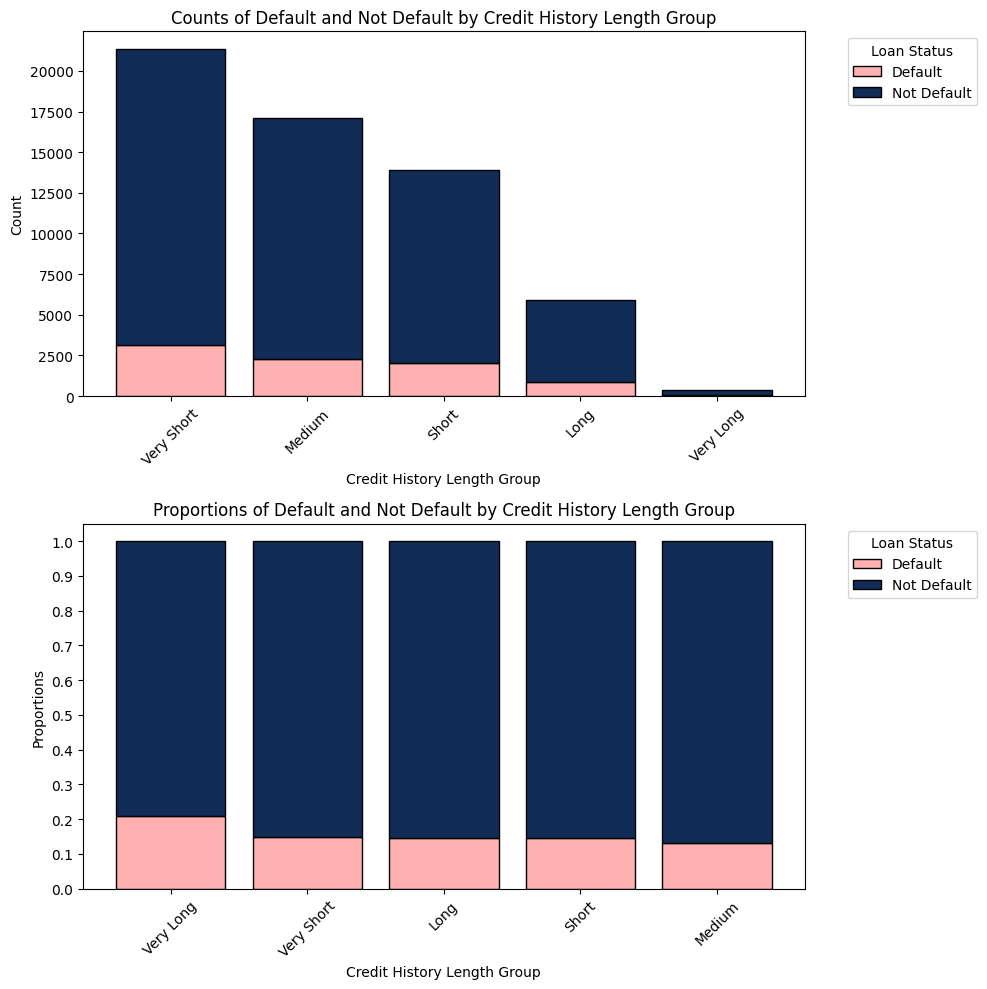

                          Not Default  Default  Total Loans
credit_hist_length_group                                   
Very Short                      18201     3163        21364
Medium                          14872     2250        17122
Short                           11906     2005        13911
Long                             5031      856         5887
Very Long                         284       75          359 

                          Not Default  Default  Total Loans
credit_hist_length_group                                   
Very Long                       0.791    0.209        1.000
Very Short                      0.852    0.148        1.000
Long                            0.855    0.145        1.000
Short                           0.856    0.144        1.000
Medium                          0.869    0.131        1.000


In [101]:
credit_hist_length_group_count, credit_hist_length_group_proportion = generate_df(
                                                        df= explore_df,
                                                        groupby_condition= ["credit_hist_length_group", "loan_status"],
                                                        values_name= "Count",
                                                        col_names= ["Not Default", "Default"],
                                                        sort_value_name= "Default",
                                                        total_name= "Total Loans"
    )

plot_stacked(
            df_list= [credit_hist_length_group_count, credit_hist_length_group_proportion],
            bottom_bar= "Default",
            top_bar= "Not Default",
            title_list= ["Counts of Default and Not Default by Credit History Length Group", "Proportions of Default and Not Default by Credit History Length Group"],
            y_label_list= ["Count", "Proportions"],
            x_label= "Credit History Length Group",
            legend_title= "Loan Status"
)

print(credit_hist_length_group_count, "\n")

print(credit_hist_length_group_proportion)

## Function for generating the boxplot

In [102]:
# Function for plotting the boxplot
def plot_boxplot(df, x, y, hue, show_outlier = True) :

    # Create a boxplot using seaborn
    sns.boxplot(data=df, x=x, y=y, hue=hue, palette={False : "#102C57", True: "#FFB1B1"}, showfliers=show_outlier)

    # Rotate the x-axis tick labels by 45 degrees for better readability
    plt.xticks(rotation=45)

    # Display the boxplot
    plt.show()

    # Display information about the groupings (categories) and their respective data
    summary = df.groupby(x, as_index= False)[y].describe()

    return summary.T

## The boxplot of the loan interest in each loan status

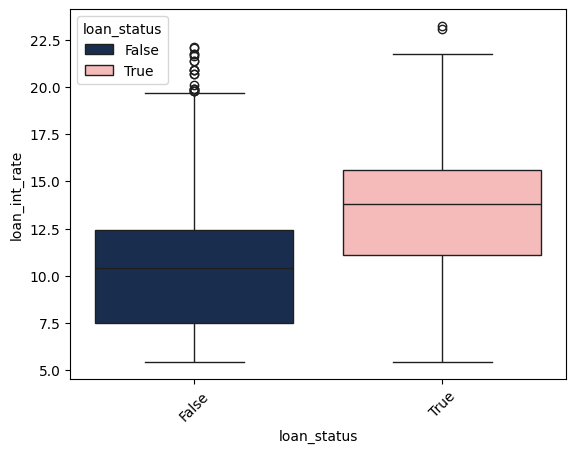

,0,1
loan_status,False,True
count,50294.000,8349.000
mean,10.259,13.202
std,2.827,3.018
min,5.420,5.420
25%,7.510,11.110
50%,10.390,13.790
75%,12.420,15.580
max,22.110,23.220


In [103]:
plot_boxplot(explore_df, x= "loan_status", y= "loan_int_rate", hue= "loan_status")

## The boxplot of the loan amount in each loan status

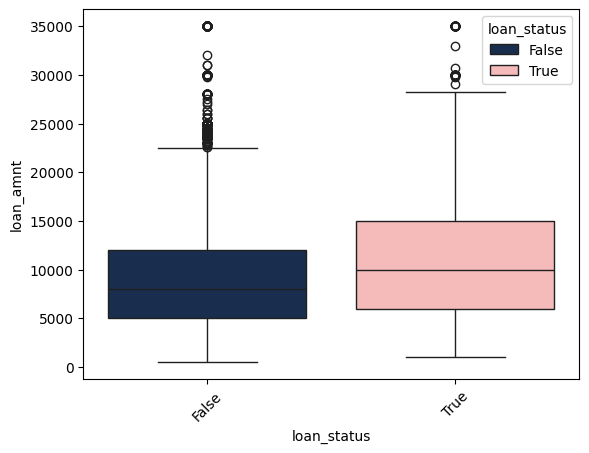

,0,1
loan_status,False,True
count,50294.000,8349.000
mean,8888.662,11195.619
std,5328.182,6466.838
min,500.000,1000.000
25%,5000.000,6000.000
50%,8000.000,10000.000
75%,12000.000,15000.000
max,35000.000,35000.000


In [104]:
plot_boxplot(explore_df, x= "loan_status", y= "loan_amnt", hue= "loan_status")

## The boxplot of the loan percent income in each loan status

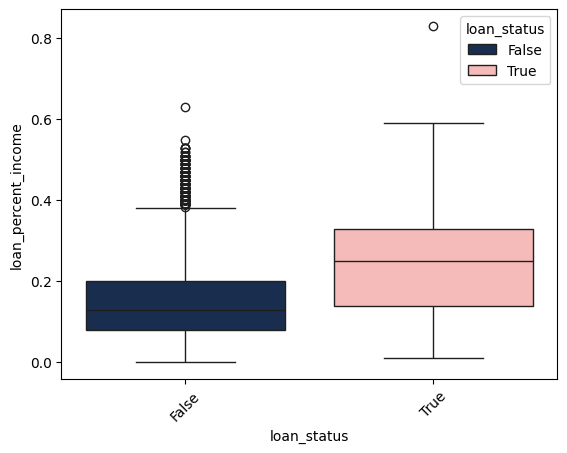

,0,1
loan_status,False,True
count,50294.000,8349.000
mean,0.145,0.244
std,0.078,0.119
min,0.000,0.010
25%,0.080,0.140
50%,0.130,0.250
75%,0.200,0.330
max,0.630,0.830


In [105]:
plot_boxplot(explore_df, x= "loan_status", y= "loan_percent_income", hue= "loan_status")

## The boxplot of the debt to income stress in each loan status

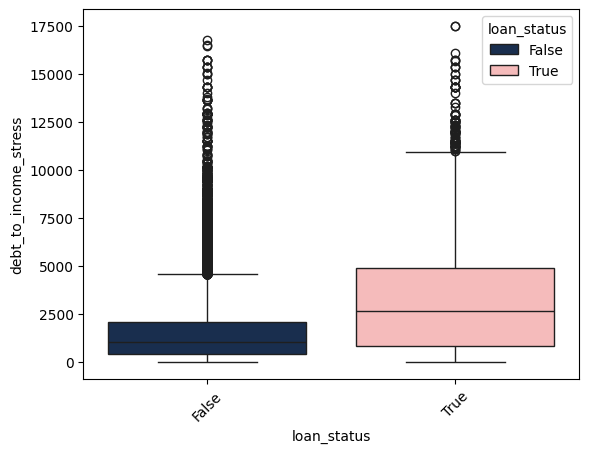

,0,1
loan_status,False,True
count,50294.000,8349.000
mean,1559.353,3234.614
std,1608.087,2731.905
min,0.000,10.000
25%,450.000,855.000
50%,1050.000,2688.000
75%,2100.000,4900.000
max,16800.000,17500.000


In [106]:
plot_boxplot(explore_df, x= "loan_status", y= "debt_to_income_stress", hue= "loan_status")

## The boxplot of the interest burden in each loan status

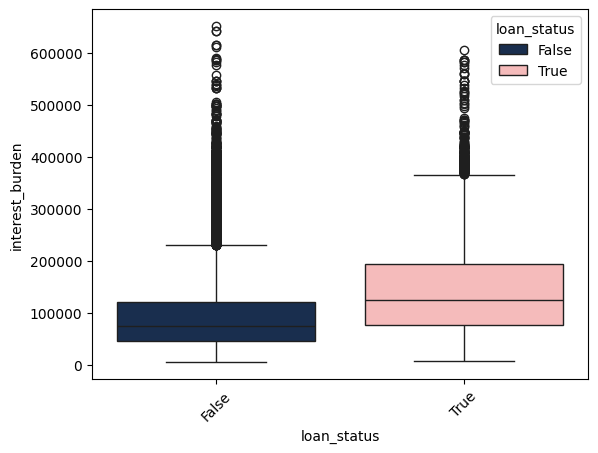

,0,1
loan_status,False,True
count,50294.000,8349.000
mean,92737.754,146095.951
std,67085.379,92112.346
min,4732.000,7510.000
25%,45960.000,77400.000
50%,74560.000,125385.000
75%,120160.000,193312.000
max,652400.000,607500.000


In [107]:
plot_boxplot(explore_df, x= "loan_status", y= "interest_burden", hue= "loan_status")

## The boxplot of the person employment length in each loan status

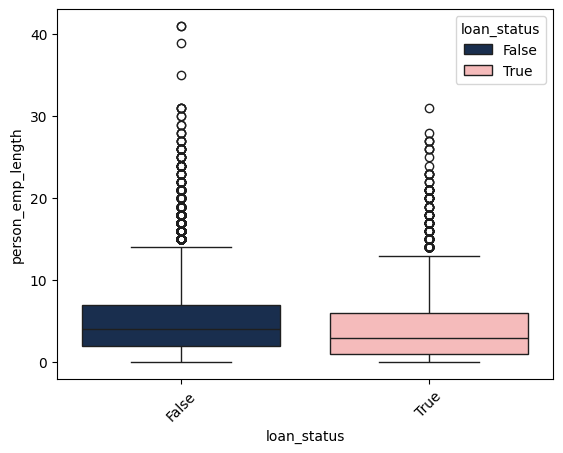

,0,1
loan_status,False,True
count,50294.000,8349.000
mean,4.861,3.711
std,3.913,3.662
min,0.000,0.000
25%,2.000,1.000
50%,4.000,3.000
75%,7.000,6.000
max,41.000,31.000


In [108]:
plot_boxplot(explore_df, x= "loan_status", y= "person_emp_length", hue= "loan_status")

## The boxplot of the person income in each loan status

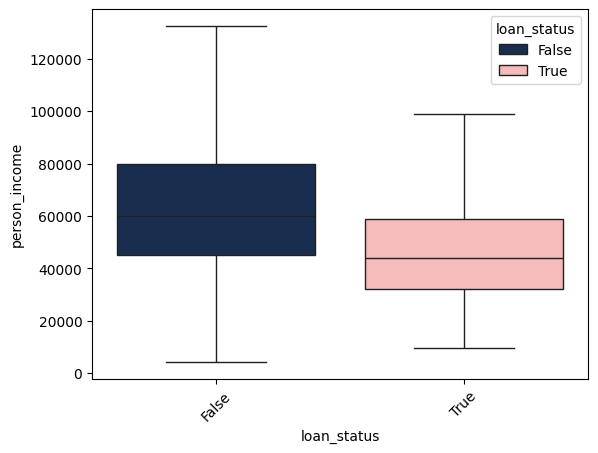

,0,1
loan_status,False,True
count,50294.000,8349.000
mean,66670.376,48223.209
std,39310.798,22436.617
min,4200.000,9600.000
25%,45000.000,32000.000
50%,60000.000,44000.000
75%,80000.000,59000.000
max,1900000.000,397800.000


In [109]:
plot_boxplot(explore_df, x= "loan_status", y= "person_income", hue= "loan_status", show_outlier= False)

### Summary: Characteristics of Defaulted and Non-Defaulted Loans
Based on the insights derived from the stacked bar charts and boxplots, the following summarizes the key characteristics of defaulted loans (`True`) and non-defaulted loans (`False`):

#### 1. Loan Intent
`Defaulted Loans :`
- Higher default rates are observed for loans intended for medical expenses and debt consolidation.
- Borrowers taking loans for venture purposes or education have relatively lower default rates.

`Non-Defaulted Loans :` 
- Majority of non-defaulted loans are associated with education and debt consolidation.

**`Key Insight :`**

Loan intent plays a crucial role in determining default risk. Loans for medical expenses and debt consolidation exhibit higher risk, likely due to financial instability or urgent need for funds.

#### 2. Loan Amount
`Defaulted Loans :`
- Higher loan amounts are common, with a median amount of ~$10,000.
- Loan defaults increase with amounts exceeding $15,000, with some extreme cases up to $35,000.

`Non-Defaulted Loans :` 
- Smaller loans, with a median amount of ~$8,000, dominate this category.
- Most non-defaulted loans are well below the $15,000 threshold.

**`Key Insight :`**

Larger loan amounts increase the risk of default, suggesting that higher-value loans require stricter evaluation or additional guarantees.

#### 3. Interest Rate
`Defaulted Loans :`
- Higher interest rates are strongly associated with defaults, with a median rate of ~13.79%.
- Many defaulted loans carry interest rates above 15%, with some extreme cases exceeding 20%.

`Non-Defaulted Loans :` 
- Lower interest rates dominate, with a median of ~10.39%.
- Interest rates rarely exceed 12% for this group.

**`Key Insight :`**

High interest rates significantly increase the risk of default, emphasizing the importance of careful interest rate assignment based on borrower risk profiles.

#### 3. Interest Rate
`Defaulted Loans :`
- Higher interest rates are strongly associated with defaults, with a median rate of ~13.79%.
- Many defaulted loans carry interest rates above 15%, with some extreme cases exceeding 20%.

`Non-Defaulted Loans :` 
- Lower interest rates dominate, with a median of ~10.39%.
- Interest rates rarely exceed 12% for this group.

**`Key Insight :`**

High interest rates significantly increase the risk of default, emphasizing the importance of careful interest rate assignment based on borrower risk profiles.

#### 4. Loan Percent Income
`Defaulted Loans :`
- Borrowers allocate a higher proportion of their income to loan repayments, with a median of ~25%.
- Many defaulted loans exceed a 30% loan-to-income ratio, with extreme cases going beyond 50%.

`Non-Defaulted Loans :` 
- A lower proportion of income is allocated to loan repayments, with a median of ~13%.
- Loan-to-income ratios rarely exceed 20% in this group.

**`Key Insight :`**

High loan-to-income ratios (above 30%) are a strong indicator of default risk. Policies capping this ratio can help reduce defaults.

#### 5. Debt-to-Income Stress
`Defaulted Loans :`
- Higher stress levels, with a median debt-to-income stress of ~$2,688.
- Some defaulted loans show extreme stress levels above $5,000.

`Non-Defaulted Loans :` 
- Lower stress levels, with a median of ~$1,050.
- Rarely exceeds $3,000 in this group.

**`Key Insight :`**

Borrowers with high debt-to-income stress levels are at greater risk of default. Lenders should monitor this metric closely during loan evaluations.

#### 6. Employment Length
`Defaulted Loans :`
- Shorter employment histories, with a median of ~3 years.
- Borrowers with employment histories less than 2 years are more likely to default.

`Non-Defaulted Loans :` 
- Longer employment histories, with a median of ~4 years.
- Stable employment above 5 years is a common characteristic of non-defaulted loans.

**`Key Insight :`**

Employment stability plays a significant role in loan repayment ability. Borrowers with shorter employment lengths require additional scrutiny.

#### 7. Income Level
`Defaulted Loans :`
- Lower median income of ~$44,000, with many borrowers earning below $30,000.
- High default rates are observed in income groups <20k and 20k-40k.

`Non-Defaulted Loans :` 
- Higher median income of ~$60,000, with most borrowers earning above $40,000.
- The highest income group (100k+) exhibits the lowest default rates.

**`Key Insight :`**

Income level is a strong predictor of loan performance. Loans issued to borrowers with low incomes (<$40,000) have a significantly higher risk of default.

#### 8. Loan Grade
`Defaulted Loans :`
- Predominantly associated with "Bad" grades (D, E, F, G), with G loans having an ~81.8% default rate.
- Interest rates and loan amounts are typically higher in these grades.

`Non-Defaulted Loans :` 
- Concentrated in "Good" grades (A, B, C), with A loans exhibiting the lowest default rate (~10.2%).

**`Key Insight :`**

Loan grades are effective risk indicators. "Bad" grades require stricter evaluation or risk-adjusted pricing to mitigate default risks.

#### Overall Characteristics of `Defaulted Loans`:
- Higher loan amounts (> $10,000).
- Higher interest rates (> 13%).
- Higher loan-to-income ratios (> 25%).
- Shorter employment lengths (< 3 years).
- Lower incomes (< $40,000).
- Predominantly in "Bad" loan grades.

#### Overall Characteristics of `Non-Defaulted Loans`:
- Smaller loan amounts (~$8,000 median).
- Lower interest rates (~10% median).
- Lower loan-to-income ratios (< 20%).
- Longer employment histories (~4+ years).
- Higher incomes (~$60,000+).
- Concentrated in "Good" loan grades.

# Step 4 : Classifier Model

## Define Training and Test Dataset

### X train with Scaling

- A scaled training dataset is created by copying the preprocessed dataset (`preprocess_train_df_with_scaling`).
- `.shape( )` is being used to check and ensure that the dimension of the dataset matches the expected number of rows and columns.

In [110]:
X_train_with_scaling = preprocess_train_df_with_scaling.copy()

X_train_with_scaling.shape

(58643, 69)

### X train without Scaling
- An unscaled training dataset is created by copying the preprocessed dataset (`preprocess_train_df_without_scaling`).
- `.shape( )` is being used to verify and ensure that the dimension of the dataset is consistency with the scaled version.

In [111]:
X_train_without_scaling = preprocess_train_df_without_scaling.copy()

X_train_without_scaling.shape

(58643, 69)

### Y train
- The target variable `loan_status` is separated from the features for training purposes.
- A copy of the `loan_status_df` is used as the target variable.

In [112]:
y_train = loan_status_df.copy()

y_train

0        False
1        False
2        False
3        False
4        False
         ...  
58640    False
58641     True
58642     True
58643    False
58644    False
Name: loan_status, Length: 58643, dtype: bool

### X test with Scaling
- A scaled version of the test dataset is prepared by copying the preprocessed dataset (`preprocess_test_df_with_scaling`).
- `.shape( )` is used to ensure that the test dataset's dimension is align with the scaled dataset.

In [113]:
X_test_with_scaling = preprocess_test_df_with_scaling.copy()

X_test_with_scaling.shape

(39098, 69)

### X test without Scaling
- An unscaled version of the test dataset is prepared by copying the preprocessed dataset (`preprocess_test_df_without_scaling`).
- `.shape( )` is used to verify that the test dataset's dimension is consistency with the scaled dataset.

In [114]:
X_test_without_scaling = preprocess_test_df_without_scaling.copy()

X_test_without_scaling.shape

(39098, 69)

## Split the Train dataset into Training and Validation dataset

To prepare the datasets for model training and validation, the `train_test_split( )` function is used to divide the data into training and validation sets. For the **scaled dataset**, `X_train_with_scaling` and `y_train` are split into `X_train_with_scaling` (80% of data) and `X_validation_with_scaling` (20% of data), with corresponding labels split into `y_train_for_logreg` and `y_validation_for_logreg`. 

Similarly, for the **unscaled dataset**, `X_train_without_scaling` and `y_train` are split into `X_train_without_scaling` (80% of data) and `X_validation_without_scaling` (20% of data), with corresponding labels split into `y_train_for_other` and `y_validation_for_other`. The split is stratified on `y_train` to ensure the class distribution remains consistent across the training and validation sets, and a fixed `random_state` of 33 is used to ensure reproducibility.


### X_train_with_scaling, X_validation_with_scaling 

In [115]:
X_train_with_scaling, X_validation_with_scaling, y_train_for_logreg, y_validation_for_logreg = train_test_split(X_train_with_scaling, y_train, test_size= 0.2, stratify= y_train, random_state= 33)

### X_train_without_scaling, X_validation_without_scaling 

In [116]:
X_train_without_scaling, X_validation_without_scaling, y_train_for_other, y_validation_for_other = train_test_split(X_train_without_scaling, y_train, test_size= 0.2, stratify= y_train, random_state= 33)

## Set up K-Fold Cross-Validation

### Indicate Number of Fold for validating the model
We use **K-Fold Cross Validation** with **4 folds** (`n_splits=4`) to split the dataset for training and validation. In each iteration, the model is trained on three folds and validated on the fourth, ensuring all data points are used for both training and testing. The `shuffle=True` parameter shuffles the data to remove ordering bias, and `random_state=100` ensures reproducible results across runs. This setup provides a more balanced assessment of the model's generalizability, as it avoids relying on a single train-test split.

In [117]:
# Set up K-Fold for performing cross validation
kf = KFold(n_splits= 4, shuffle= True, random_state= 100)

## Model Tuning and Evaluating

We will fine-tune and evaluate four machine learning models: `Logistic Regression`, `Random Forest Classifier`, `K-Nearest Neighbors (KNN)`, and `XGBoost Classifier`. To identify the best-performing model for our dataset, we will compare their performance on the validation set.

The hyperparameter tuning process will involve two steps:
- `RandomizedSearch`: To explore the hyperparameter space and narrow down the search area for key parameters.
- `GridSearch`: To search for the best possible combination of hyperparameters within the refined range.

This two-step approach ensures optimal performance while balancing computational efficiency.

### First Tune

In the first tuning phase, we explore a wide range of hyperparameters to identify promising values for further refinement.

**Hyperparameter Grid**:
- C : `[0.01, 0.1, 1, 10]` (Inverse of regularization strength)
- penalty : `["l1", "l2", "elasticnet"]` (Regularization type)
- solver : `["liblinear"]` (Solver for optimization)
- max_iter : `[100, 300, 500, 700]` (Maximum number of iterations for convergence)
- class_weight : `[None, "balanced"]` (Class balancing)

In [119]:
# Set up Logistic Regression Model
logreg = LogisticRegression()

# Hyper Parameter Tuning Grid
param_grid = {
    "C": [0.01, 0.1, 1, 10],
    "penalty" : ["l1", "l2", "elasticnet"],
    "solver" : ["liblinear"],
    "max_iter" : [100, 300, 500, 700],
    "class_weight" : [None, "balanced"]
}

logreg_search = RandomizedSearchCV(
                            estimator= logreg,
                            param_distributions= param_grid,
                            n_iter= 1500,
                            cv = kf,
                            verbose= 1)

logreg_search.fit(X_train_with_scaling, y_train_for_logreg)

# Best parameters and best score
print(f"Best Parameters: {logreg_search.best_params_}")
print(f"Best Cross-Validation Accuracy: {logreg_search.best_score_:.2f}")

/Users/wasinyok/miniconda3/lib/python3.11/site-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 96 is smaller than n_iter=1500. Running 96 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 4 folds for each of 96 candidates, totalling 384 fits


/Users/wasinyok/miniconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
128 fits failed out of a total of 384.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
128 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/wasinyok/miniconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/wasinyok/miniconda3/lib/python3.11/site-packages/sklearn/base.py", line 1473, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/wasinyok/miniconda3/lib/python3.11/site-packages/sklearn/linea

Best Parameters: {'solver': 'liblinear', 'penalty': 'l1', 'max_iter': 100, 'class_weight': None, 'C': 10}
Best Cross-Validation Accuracy: 0.92


### Second Tune

In the second phase, we refine the search grid based on the results from the first tuning. The hyperparameter ranges are narrowed to focus on fine-tuning the model further.

**Refined Hyperparameter Grid:**
- **C** : `np.arange(9.85, 10.0, 0.05)` (Focused range of regularization strength)
- **penalty** : `["l1"]` (Regularization set to L1 only)
- **solver** : `["liblinear"]` (Liblinear solver remains consistent)
- **max_iter** : `np.arange(90, 110, 5)` (Focused range for maximum iterations)
- **class_weight** : `[None]` (No class balancing applied)

In [120]:
# Set up Logistic Regression Model
logreg = LogisticRegression()

# Hyper Parameter Tuning Grid
param_grid = {
    "C": np.arange(9.85, 10, 0.05),
    "penalty" : ["l1"],
    "solver" : ["liblinear"],
    "max_iter" : np.arange(90, 110, 5),
    "class_weight" : [None]
}

logreg_search = GridSearchCV(
                                estimator= logreg,
                                param_grid= param_grid,
                                cv = kf,
                                verbose= 1)

logreg_search.fit(X_train_with_scaling, y_train_for_logreg)

# Best parameters and best score
print(f"Best Parameters: {logreg_search.best_params_}")
print(f"Best Cross-Validation Accuracy: {logreg_search.best_score_:.2f}")

Fitting 4 folds for each of 16 candidates, totalling 64 fits
Best Parameters: {'C': np.float64(9.9), 'class_weight': None, 'max_iter': np.int64(90), 'penalty': 'l1', 'solver': 'liblinear'}
Best Cross-Validation Accuracy: 0.92


After performing **GridSearchCV**, the best combination of hyperparameters for the **Logistic Regression** model was identified:

**Best Parameters :**
- **C** : `9.9` 
- **class_weight** : `None`
- **max_iter** : `90`
- **penalty** : `l1`
- **solver** : `liblinear` 

**Best Cross-Validation Accuracy :**
- **Accuracy** : `92%`

In [121]:
# Get best model
best_logreg = logreg_search.best_estimator_
best_logreg

LogisticRegression(C=np.float64(9.9), max_iter=np.int64(90), penalty='l1',
                   solver='liblinear')

In [122]:
print("Accuracy Score :", round(best_logreg.score(X_train_with_scaling, y_train_for_logreg), 3))

Accuracy Score : 0.918


### Predicting on training set

After identifying the best hyperparameters for the Logistic Regression model, we evaluated its performance by making predictions on the **`training dataset`** and **`validation dataset`**. The evaluation metrics include the **`confusion matrix`** and the **`classification report`**, which help in understanding the model's accuracy and ability to classify the target variable effectively.


In [123]:
y_train_pred = best_logreg.predict(X_train_with_scaling)

report = classification_report(y_train_for_logreg, y_train_pred)
con_matrix = confusion_matrix(y_train_for_logreg, y_train_pred)

### Confusion Matrix :

The confusion matrix provides a detailed breakdown of the model's predictions:
- **`True Negatives (TN)`** : The model correctly predicted non-defaulted loans (39,175 instances).
- **`False Positives (FP)`** : The model incorrectly predicted defaulted loans for non-defaulted loans (1060 instances).
- **`False Negatives (FN)`** : The model incorrectly predicted non-defaulted loans for defaulted loans (2,788 instances).
- **`True Positives (TP)`** : The model correctly predicted defaulted loans (3,891 instances).

Key Observations:
- The model performs well in identifying `non-defaulted loans`, with a high TN count.
- There are notable `FN` and `FP` values, indicating some misclassifications, particularly in predicting defaulted loans.

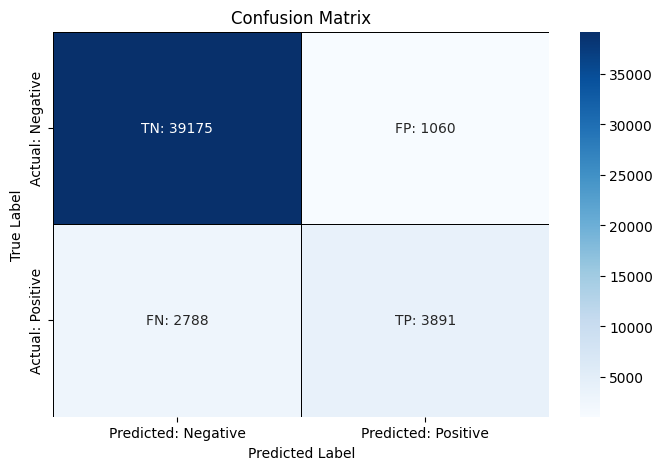

In [124]:
# Define labels with TN, FP, FN, TP, combined with the actual values
labels = [["TN: {}".format(con_matrix[0, 0]), "FP: {}".format(con_matrix[0, 1])],
          ["FN: {}".format(con_matrix[1, 0]), "TP: {}".format(con_matrix[1, 1])]]

# Plot heatmap with combined labels
plt.figure(figsize=(8, 5))
sns.heatmap(con_matrix, annot=labels, fmt="", cmap="Blues", cbar=True,
            xticklabels=["Predicted: Negative", "Predicted: Positive"], 
            yticklabels=["Actual: Negative", "Actual: Positive"],
            linecolor="black", linewidths=0.5)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

### Classification Report
The classification report provides a comprehensive analysis of the model's performance:

Key Insights:
- **`Precision`** : 
  - The model has a high precision for both classes, particularly for non-defaulted loans (0.93).
- **`Recall`** : 
  - Recall for defaulted loans is lower (0.58), indicating the model struggles to correctly identify all defaulted loans.
- **`F1-Score`** : 
  - The harmonic mean of precision and recall shows overall performance is strong for non-defaulted loans (0.95) but moderate for defaulted loans (0.67).
- **`Overall Accuracy`** : 
  - The model achieves an overall accuracy of 92%, indicating strong performance on the training set.

In [125]:
print("Classification Report :")
print(report)

Classification Report :
              precision    recall  f1-score   support

       False       0.93      0.97      0.95     40235
        True       0.79      0.58      0.67      6679

    accuracy                           0.92     46914
   macro avg       0.86      0.78      0.81     46914
weighted avg       0.91      0.92      0.91     46914



### Predicting on validation set

In [126]:
y_validation_pred = best_logreg.predict(X_validation_with_scaling)

print("Accuracy Score :", round(best_logreg.score(X_validation_with_scaling, y_validation_for_logreg), 3))

Accuracy Score : 0.915


In [127]:
report = classification_report(y_validation_for_logreg, y_validation_pred)
con_matrix = confusion_matrix(y_validation_for_logreg, y_validation_pred)

### Confusion Matrix :

- **`True Negatives (TN)`**: The model correctly predicted non-defaulted loans (9,765 instances).
- **`False Positives (FP)`**: The model incorrectly predicted defaulted loans for non-defaulted loans (294 instances).
- **`False Negatives (FN)`**: The model incorrectly predicted non-defaulted loans for defaulted loans (708 instances).
- **`True Positives (TP)`**: The model correctly predicted defaulted loans (962 instances).

Observations:
- The model shows strong performance in predicting non-defaulted loans, as indicated by the high number of **`True Negatives (TN)`**.
- While it performs reasonably well on defaulted loans, the number of **`False Negatives (FN)`** suggests room for improvement in identifying all defaulted cases.

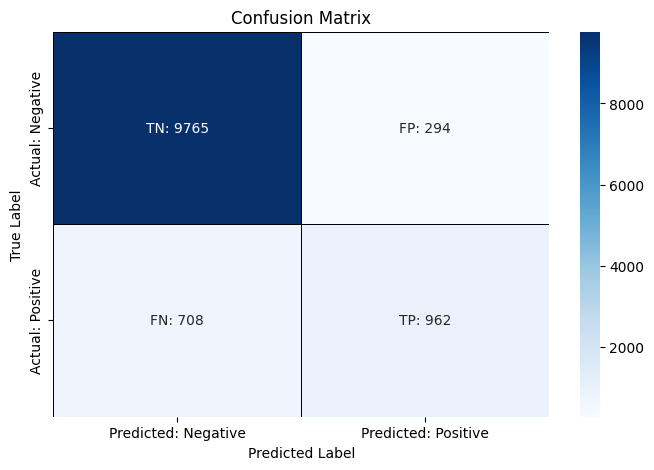

In [128]:
# Define labels with TN, FP, FN, TP, combined with the actual values
labels = [["TN: {}".format(con_matrix[0, 0]), "FP: {}".format(con_matrix[0, 1])],
          ["FN: {}".format(con_matrix[1, 0]), "TP: {}".format(con_matrix[1, 1])]]

# Plot heatmap with combined labels
plt.figure(figsize=(8, 5))
sns.heatmap(con_matrix, annot=labels, fmt="", cmap="Blues", cbar=True,
            xticklabels=["Predicted: Negative", "Predicted: Positive"], 
            yticklabels=["Actual: Negative", "Actual: Positive"],
            linecolor="black", linewidths=0.5)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

### Classification Report :

Key Insights:
- **`Precision`**: 
  - The model achieves high precision for non-defaulted loans (0.93), indicating fewer false positives for this class.
- **`Recall`**: 
  - Recall for defaulted loans is moderate (0.58), highlighting some difficulty in identifying all defaulted cases.
- **`F1-Score`**: 
  - The harmonic mean of precision and recall shows strong performance for non-defaulted loans (0.95) but moderate performance for defaulted loans (0.66).
- **`Overall Accuracy`**: 
  - The model achieves an accuracy of **91%**, demonstrating reliable performance on the validation set.


In [129]:
print("Classification Report :")
print(report)

Classification Report :
              precision    recall  f1-score   support

       False       0.93      0.97      0.95     10059
        True       0.77      0.58      0.66      1670

    accuracy                           0.91     11729
   macro avg       0.85      0.77      0.80     11729
weighted avg       0.91      0.91      0.91     11729



### Predicting on test set

In [130]:
prediction_1 = best_logreg.predict(X_test_with_scaling)

prediction_1

array([ True, False,  True, ..., False,  True,  True])

In [131]:
test_df_id = pd.read_csv("test.csv")

logreg_prediction = pd.DataFrame({"id" : test_df_id["id"], "prediction" : prediction_1})

logreg_prediction.columns = ["id", "loan_status"]

logreg_prediction["loan_status"] = logreg_prediction["loan_status"].astype(int)

logreg_prediction.to_csv("logreg_prediction.csv", index= False)

logreg_prediction

,id,loan_status
0,58645,1
1,58646,0
2,58647,1
3,58648,0
4,58649,1
...,...,...
39093,97738,0
39094,97739,0
39095,97740,0
39096,97741,1


## Model 2 : Random Forest Classifier

In this section, we fine-tune the **`Random Forest Classifier`** model. First we use **`RandomizedSearchCV`** to explore a broad hyperparameter space, followed by **`GridSearchCV`** to find the optimal hyperparameters within a refined search range.

### First Tune

**Hyperparameter Space** :

- **n_estimators** : `[50, 100, 150, 200, 250, 500, 1000]` (Number of trees in the forest)
- **max_depth**: `[5, 10, 15, 20, 50, 100, 500]` (Maximum depth of each tree)
- **min_samples_split**: `[0.1, 0.2, 0.3, 0.4, 0.5]` (Minimum fraction of samples required to split an internal node)
- **min_samples_leaf**: `[0.1, 0.2, 0.3, 0.4, 0.5]` (Minimum fraction of samples required to form a leaf node)
- **max_features**: `["log2", "sqrt"]` (Number of features considered when looking for the best split)
- **bootstrap**: `[False, True]` (Whether bootstrap samples are used when building trees)

In [132]:
# Set up the machine learning model (Random Forest Classifier)
rfc = RandomForestClassifier()

# Indicate the searching area for tuning the model
params = {
    "n_estimators" : [50, 100, 150, 200, 250, 500, 1000],
    "max_depth" : [5, 10, 15, 20, 50, 100, 500,],
    "min_samples_split" : [0.1, 0.2, 0.3, 0.4, 0.5],
    "min_samples_leaf" : [0.1, 0.2, 0.3, 0.4, 0.5],
    "max_features" : ["log2", "sqrt"],
    "bootstrap" : [False, True]
}

# Set up RandomizedSearchCV for tuning the model
random_search = RandomizedSearchCV(
                            estimator= rfc,
                            param_distributions= params,
                            n_iter= 1500,
                            cv = kf,
                            verbose= 1
)

# Tuning the model
random_search.fit(X_train_without_scaling, y_train_for_other)

# Best parameters and best score
print(f"Best Parameters: {random_search.best_params_}")
print(f"Best Cross-Validation Accuracy: {random_search.best_score_:.2f}")

Fitting 4 folds for each of 1500 candidates, totalling 6000 fits


/Users/wasinyok/miniconda3/lib/python3.11/site-packages/numpy/ma/core.py:2881: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Best Parameters: {'n_estimators': 500, 'min_samples_split': 0.2, 'min_samples_leaf': 0.1, 'max_features': 'sqrt', 'max_depth': 10, 'bootstrap': False}
Best Cross-Validation Accuracy: 0.86


## Second Tune

Based on the results from the first tuning, we refine the hyperparameter search space and use **`GridSearchCV`** to perform an exhaustive search for the best hyperparameter combination.

**Refined Hyperparameter Space** :
- **n_estimators** : `np.arange(450, 500, 10)` (range for the number of trees)
- **max_depth** : `np.arange(4, 10, 2)` (range for maximum tree depth)
- **min_samples_split** : `np.arange(0.15, 0.25, 0.05)` (minimum fraction of samples required to split an internal node)
- **min_samples_leaf** : `np.arange(0.05, 0.1, 0.05)` (minimum fraction of samples required to be at a leaf node)
- **max_features** : `["sqrt"]` (Number of features considered when looking for the best split)
- **bootstrap** : `[False]` (Bootstrap sampling disabled for trees)

In [133]:
# Set up the machine learning model (Random Forest Classifier)
rfc = RandomForestClassifier()

# Indicate the searching area for tuning the model
params = {
    "n_estimators" : np.arange(450, 500, 10),
    "max_depth" : np.arange(4, 10, 2),
    "min_samples_split" : np.arange(0.15, 0.25, 0.05),
    "min_samples_leaf" : np.arange(0.05, 0.1, 0.05),
    "max_features" : ["sqrt"],
    "bootstrap" : [False]
}

# Set up RandomizedSearchCV for tuning the model
random_search = GridSearchCV(
                            estimator= rfc,
                            param_grid= params,
                            cv = kf,
                            verbose= 1
)

# Tuning the model
random_search.fit(X_train_without_scaling, y_train_for_other)

# Best parameters and best score
print(f"Best Parameters: {random_search.best_params_}")
print(f"Best Cross-Validation Accuracy: {random_search.best_score_:.2f}")

Fitting 4 folds for each of 30 candidates, totalling 120 fits
Best Parameters: {'bootstrap': False, 'max_depth': np.int64(8), 'max_features': 'sqrt', 'min_samples_leaf': np.float64(0.05), 'min_samples_split': np.float64(0.15), 'n_estimators': np.int64(460)}
Best Cross-Validation Accuracy: 0.87


In [134]:
# Get best model
best_rfc_model = random_search.best_estimator_
best_rfc_model

RandomForestClassifier(bootstrap=False, max_depth=np.int64(8),
                       min_samples_leaf=np.float64(0.05),
                       min_samples_split=np.float64(0.15),
                       n_estimators=np.int64(460))

In [135]:
print("Accuracy Score :", round(best_rfc_model.score(X_train_without_scaling, y_train_for_other), 3))

Accuracy Score : 0.871


### Predicting on training set

The **`Random Forest Classifier`** model's performance was evaluated on the training set using a **`confusion matrix`** and a **`classification report`**.

In [136]:
y_train_pred = best_rfc_model.predict(X_train_without_scaling)

report = classification_report(y_train_for_other, y_train_pred)
con_matrix = confusion_matrix(y_train_for_other, y_train_pred)

### Confusion Matrix :

- **`True Negatives (TN)`**: The model correctly predicted **non-defaulted loans** (40,186 instances).
- **`False Positives (FP)`**: The model incorrectly predicted **defaulted loans** for non-defaulted loans (49 instances).
- **`False Negatives (FN)`**: The model incorrectly predicted **non-defaulted loans** for defaulted loans (6,024 instances).
- **`True Positives (TP)`**: The model correctly predicted **defaulted loans** (655 instances).

observation :
- The model performs exceptionally well in identifying non-defaulted loans, with a high number of **`True Negatives (TN`)** and very few **`False Positives (FP)`**.
- However, the model struggles to accurately identify defaulted loans, as indicated by the large number of **`False Negatives (FN)`**.

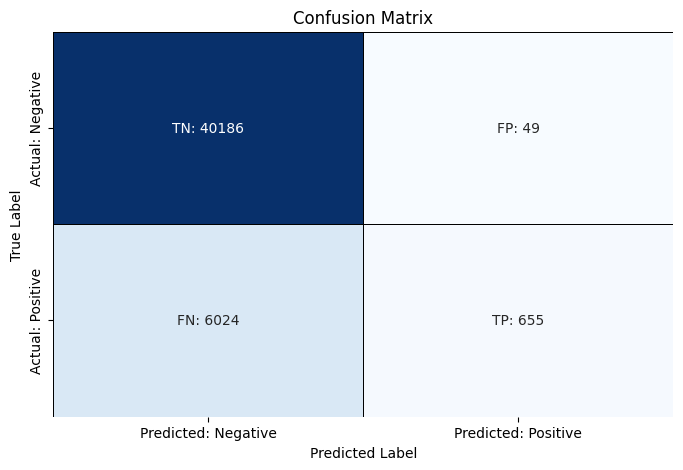

In [137]:
# Define labels with TN, FP, FN, TP, combined with the actual values
labels = [["TN: {}".format(con_matrix[0, 0]), "FP: {}".format(con_matrix[0, 1])],
          ["FN: {}".format(con_matrix[1, 0]), "TP: {}".format(con_matrix[1, 1])]]

# Plot heatmap with combined labels
plt.figure(figsize=(8, 5))
sns.heatmap(con_matrix, annot=labels, fmt="", cmap="Blues", cbar=False,
            xticklabels=["Predicted: Negative", "Predicted: Positive"], 
            yticklabels=["Actual: Negative", "Actual: Positive"],
            linecolor="black", linewidths=0.5)
            
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

### Classification Report :

Key Insights:
- **`Precision`**: 
  - The model achieves high precision for defaulted loans (0.93), indicating that when it predicts defaulted loans, it is often correct.
- **`Recall`**: 
  - The recall for defaulted loans is very low (0.10), highlighting the model's difficulty in identifying all defaulted cases.
- **`F1-Score`**: 
  - The harmonic mean of precision and recall shows strong performance for non-defaulted loans (0.93) but poor performance for defaulted loans (0.18).
- **`Overall Accuracy`**: 
  - The model achieves an accuracy of **87%**, driven largely by its success in predicting non-defaulted loans.

In [138]:
print("Classification Report :")
print(report)

Classification Report :
              precision    recall  f1-score   support

       False       0.87      1.00      0.93     40235
        True       0.93      0.10      0.18      6679

    accuracy                           0.87     46914
   macro avg       0.90      0.55      0.55     46914
weighted avg       0.88      0.87      0.82     46914



### Predicting on validation set

The **`Random Forest Classifier`** model's performance was evaluated on the validation set using a **`confusion matrix`** and a **`classification report`**.

In [139]:
y_validation_pred = best_rfc_model.predict(X_validation_without_scaling)

print("Accuracy Score :", round(best_rfc_model.score(X_validation_without_scaling, y_validation_for_other), 3))

Accuracy Score : 0.87


In [140]:
report = classification_report(y_validation_for_other, y_validation_pred)
con_matrix = confusion_matrix(y_validation_for_other, y_validation_pred)

### Confusion Matrix :

- **`True Negatives (TN)`**: 10,051 - Non-defaulted loans correctly classified.
- **`False Positives (FP)`**: 8 - Non-defaulted loans incorrectly classified as defaulted.
- **`False Negatives (FN)`**: 1,511 - Defaulted loans incorrectly classified as non-defaulted.
- **`True Positives (TP)`**: 159 - Defaulted loans correctly classified.

observations :
- The model performs very well in classifying non-defaulted loans, as shown by the high **`True Negative (TN`)** count and very low **`False Positive (FP)`** count.
- However, the model struggles to correctly classify defaulted loans, evident from the high **`False Negative (FN)`** count and low **`True Positive (TP)`** count.

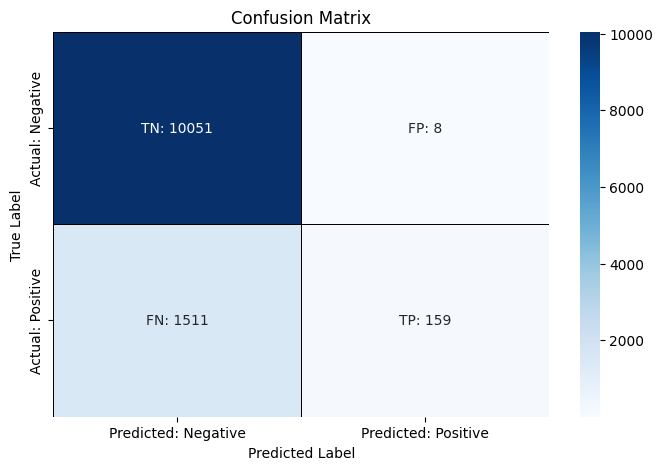

In [141]:
# Define labels with TN, FP, FN, TP, combined with the actual values
labels = [["TN: {}".format(con_matrix[0, 0]), "FP: {}".format(con_matrix[0, 1])],
          ["FN: {}".format(con_matrix[1, 0]), "TP: {}".format(con_matrix[1, 1])]]

# Plot heatmap with combined labels
plt.figure(figsize=(8, 5))
sns.heatmap(con_matrix, annot=labels, fmt="", cmap="Blues", cbar=True,
            xticklabels=["Predicted: Negative", "Predicted: Positive"], 
            yticklabels=["Actual: Negative", "Actual: Positive"],
            linecolor="black", linewidths=0.5)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

### Classification Report :

Key Insight :
- **`Precision`**: 
  - The model has high precision for defaulted loans (0.95), indicating that when it predicts defaulted loans, it is often correct.
- **`Recall`**: 
  - The recall for defaulted loans is very low (0.10), highlighting significant difficulty in identifying all actual defaulted cases.
- **`F1-Score`**: 
  - The F1-score, which balances precision and recall, is much lower for defaulted loans (0.17), reflecting the imbalance between precision and recall.
- **`Overall Accuracy`**: 
  - The model achieves an overall accuracy of **87%**, driven mainly by its success in predicting non-defaulted loans.

In [142]:
print("Classification Report :")
print(report)

Classification Report :
              precision    recall  f1-score   support

       False       0.87      1.00      0.93     10059
        True       0.95      0.10      0.17      1670

    accuracy                           0.87     11729
   macro avg       0.91      0.55      0.55     11729
weighted avg       0.88      0.87      0.82     11729



### Predicting on test set

In [143]:
prediction_2 = best_rfc_model.predict(X_test_without_scaling)

prediction_2

array([ True, False, False, ..., False, False, False])

In [144]:
rfc_prediction = pd.DataFrame({"id" : test_df_id["id"], "loan_status" : prediction_2})

rfc_prediction["loan_status"] = rfc_prediction["loan_status"].astype(int)

rfc_prediction.to_csv("rfc_prediction.csv", index= False)

rfc_prediction

,id,loan_status
0,58645,1
1,58646,0
2,58647,0
3,58648,0
4,58649,0
...,...,...
39093,97738,0
39094,97739,0
39095,97740,0
39096,97741,0


## Model 3 : K-Nearest Neighbor (KNN)

In this section, we fine-tune the **`K-Nearest Neighbors (KNN)`** classifier. Since KNN has a single key hyperparameter (**`n_neighbors`**), only one tuning process is necessary to find the optimal value. The tuning process uses **`GridSearchCV`** with **`K-Fold Cross Validation`** to evaluate the model's performance.

### Model Tuning

**Hyperparameter Space** :
- **n_neighbors**: Number of neighbors to consider during classification. The values tested range from **`10 to 500`** in steps of **5**.


In [146]:
knn = KNeighborsClassifier()

knn_params = {"n_neighbors" : np.arange(10, 500, 5)}

grid_cv = GridSearchCV(
                        estimator = knn,
                        param_grid= knn_params,
                        verbose = 1,
                        cv = kf
)

grid_cv.fit(X_train_with_scaling, y_train_for_other)

# Best parameters and best score
print(f"Best Parameters: {grid_cv.best_params_}")
print(f"Best Cross-Validation Accuracy: {grid_cv.best_score_:.2f}")

Fitting 4 folds for each of 98 candidates, totalling 392 fits
Best Parameters: {'n_neighbors': np.int64(15)}
Best Cross-Validation Accuracy: 0.92


In [147]:
# Get best model
best_knn = grid_cv.best_estimator_
best_knn

KNeighborsClassifier(n_neighbors=np.int64(15))

In [148]:
print("Accuracy Score :", round(best_knn.score(X_train_with_scaling, y_train_for_other), 3))

Accuracy Score : 0.926


### Predicting on training set

In [149]:
y_train_pred = best_knn.predict(X_train_with_scaling)

report = classification_report(y_train_for_other, y_train_pred)
con_matrix = confusion_matrix(y_train_for_other, y_train_pred)

### Confusion Matrix :

- **`True Negatives (TN)`**: 39,438 - Non-defaulted loans correctly classified.
- **`False Positives (FP)`**: 797 - Non-defaulted loans incorrectly classified as defaulted.
- **`False Negatives (FN)`**: 2,676 - Defaulted loans incorrectly classified as non-defaulted.
- **`True Positives (TP)`**: 4,003 - Defaulted loans correctly classified.

observation
- The model demonstrates strong performance in classifying non-defaulted loans, with a high **`True Negative (TN)`** count.
- It shows moderate success in classifying defaulted loans, as seen by the **`True Positive (TP)`** count, but still struggles with some **`False Negatives (FN)`**.

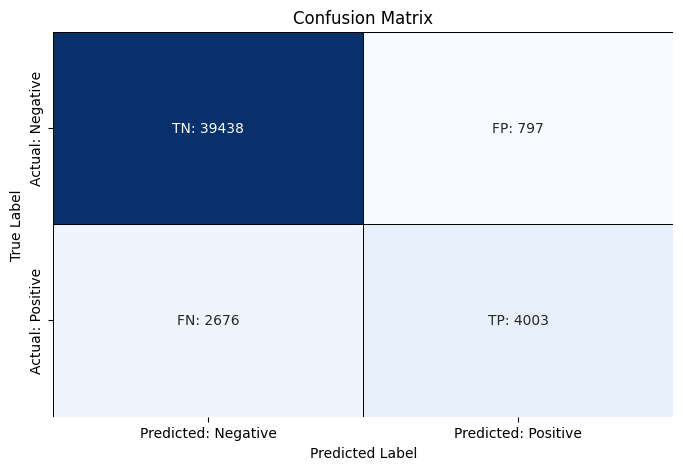

In [150]:
# Define labels with TN, FP, FN, TP, combined with the actual values
labels = [["TN: {}".format(con_matrix[0, 0]), "FP: {}".format(con_matrix[0, 1])],
          ["FN: {}".format(con_matrix[1, 0]), "TP: {}".format(con_matrix[1, 1])]]

# Plot heatmap with combined labels
plt.figure(figsize=(8, 5))
sns.heatmap(con_matrix, annot=labels, fmt="", cmap="Blues", cbar=False,
            xticklabels=["Predicted: Negative", "Predicted: Positive"], 
            yticklabels=["Actual: Negative", "Actual: Positive"],
            linecolor="black", linewidths=0.5)
            
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

### Classification Report :

Key Insights :
- **`Precision`**: 
  - High precision for defaulted loans (0.83) indicates that when the model predicts defaulted loans, it is often correct.
- **`Recall`**: 
  - Moderate recall for defaulted loans (0.60) shows the model's limitations in identifying all actual defaulted loans.
- **`F1-Score`**: 
  - The F1-score for defaulted loans (0.70) reflects a balance between precision and recall.
- **`Overall Accuracy`**: 
  - The model achieves an accuracy of **93%**, driven by its success in predicting non-defaulted loans.

In [151]:
print("Classification Report :")
print(report)

Classification Report :
              precision    recall  f1-score   support

       False       0.94      0.98      0.96     40235
        True       0.83      0.60      0.70      6679

    accuracy                           0.93     46914
   macro avg       0.89      0.79      0.83     46914
weighted avg       0.92      0.93      0.92     46914



### Predicting on validation set

In [161]:
y_validation_pred = best_knn.predict(X_validation_without_scaling)

print("Accuracy Score :", round(best_knn.score(X_validation_without_scaling, y_validation_for_other), 3))

Accuracy Score : 0.858


In [162]:
report = classification_report(y_validation_for_other, y_validation_pred)
con_matrix = confusion_matrix(y_validation_for_other, y_validation_pred)

/Users/wasinyok/miniconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/wasinyok/miniconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/wasinyok/miniconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


### Confusion Matrix :

- **`True Negatives (TN)`**: 10,059 - Non-defaulted loans correctly classified.
- **`False Positives (FP)`**: 0 - Non-defaulted loans incorrectly classified as defaulted.
- **`False Negatives (FN)`**: 1,670 - Defaulted loans incorrectly classified as non-defaulted.
- **`True Positives (TP)`**: 0 - Defaulted loans correctly classified.

observations :
- The model performs very well in identifying non-defaulted loans, with a perfect **`True Negative (TN)`** count.
- However, it fails entirely to identify any defaulted loans, as seen with **`False Positives (FP)`** and **`True Positives (TP)`** both being 0.

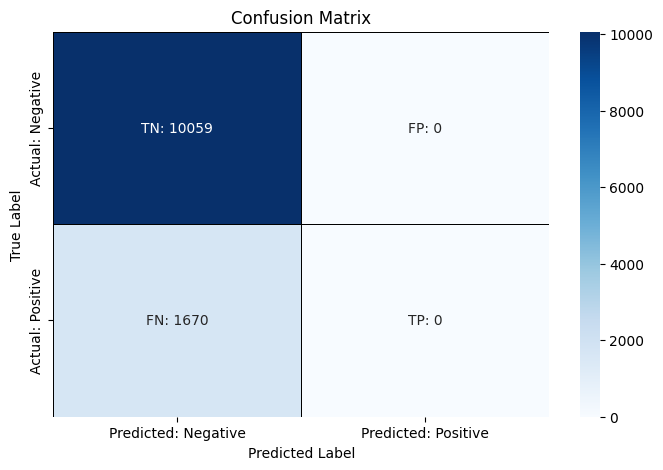

In [163]:
# Define labels with TN, FP, FN, TP, combined with the actual values
labels = [["TN: {}".format(con_matrix[0, 0]), "FP: {}".format(con_matrix[0, 1])],
          ["FN: {}".format(con_matrix[1, 0]), "TP: {}".format(con_matrix[1, 1])]]

# Plot heatmap with combined labels
plt.figure(figsize=(8, 5))
sns.heatmap(con_matrix, annot=labels, fmt="", cmap="Blues", cbar=True,
            xticklabels=["Predicted: Negative", "Predicted: Positive"], 
            yticklabels=["Actual: Negative", "Actual: Positive"],
            linecolor="black", linewidths=0.5)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

### Classification Report :

Key Insights :
- **`Precision`**: 
  - The precision for defaulted loans is 0.00, indicating the model cannot correctly identify any defaulted loans.
- **`Recall`**: 
  - The recall for defaulted loans is 0.00, showing the model's complete inability to detect actual defaulted cases.
- **`F1-Score`**: 
  - The F1-score for defaulted loans is 0.00, reflecting poor overall performance for this class.
- **`Overall Accuracy`** : 
  - The model achieves an overall accuracy of **86%**, driven entirely by its success in identifying non-defaulted loans.

In [155]:
print("Classification Report :")
print(report)

Classification Report :
              precision    recall  f1-score   support

       False       0.86      1.00      0.92     10059
        True       0.00      0.00      0.00      1670

    accuracy                           0.86     11729
   macro avg       0.43      0.50      0.46     11729
weighted avg       0.74      0.86      0.79     11729



### Predicting on test set

In [156]:
prediction_3 = best_knn.predict(X_test_with_scaling)

prediction_3

array([ True, False,  True, ..., False,  True,  True])

In [157]:
knn_prediction = pd.DataFrame({"id" : test_df_id["id"], "loan_status" : prediction_3})

knn_prediction["loan_status"] = knn_prediction["loan_status"].astype(int)

knn_prediction.to_csv("knn_prediction.csv", index= False)

knn_prediction

,id,loan_status
0,58645,1
1,58646,0
2,58647,1
3,58648,0
4,58649,0
...,...,...
39093,97738,0
39094,97739,0
39095,97740,0
39096,97741,1


## Model 4 : XGBoost Classifier

In this section, we fine-tune the **`XGBoost Classifier`**, a powerful gradient boosting model widely used for structured data. The model has several key hyperparameters, including the number of estimators, learning rate, tree depth, and regularization parameters. The tuning process is divided into two phases:
**`RandomizedSearchCV`** and **`GridSearchCV`**

### First Tune

In the first phase of tuning, we used **`RandomizedSearchCV`** to explore a wide range of hyperparameters for the XGBoost Classifier. The parameter grid included:

**Hyperparameter Space :**
- **n_estimators**: `np.arange(50, 1000, 50)` (range for the number of trees)
- **learning_rate**: `np.arange(0.01, 0.5, 0.05)` (step size shrinkage to control overfitting)
- **max_depth**: `np.arange(5, 15, 2)` (range for maximum tree depth)
- **subsample**: `np.arange(0.5, 1, 0.05)` (fraction of samples used per tree)
- **colsample_bytree**: `np.arange(0.5, 1, 0.05)` (fraction of features used per tree)
- **gamma**: `np.arange(0, 0.5, 0.05)` (minimum loss reduction required for a split)
- **reg_alpha**: `np.arange(0, 1, 0.1)` (L1 regularization term to control sparsity)
- **reg_lambda**: `np.arange(0, 3, 0.5)` (L2 regularization term to control weights)

In [164]:
# Parameter grid for RandomizedSearchCV
param_grid = {
    'n_estimators': np.arange(50, 1000, 50),
    'learning_rate': np.arange(0.01, 0.5, 0.05),
    'max_depth': np.arange(5, 15, 2),
    'subsample': np.arange(0.5, 1, 0.05),
    'colsample_bytree': np.arange(0.5, 1, 0.05),
    'gamma': np.arange(0, 0.5, 0.05),
    'reg_alpha': np.arange(0, 1, 0.1),
    'reg_lambda': np.arange(0, 3, 0.5),
}

# Initialize XGBoost model
xgb_model = XGBClassifier()

# Set up RandomizedSearchCV
xgb_search = RandomizedSearchCV(
    estimator = xgb_model,
    param_distributions = param_grid,
    n_iter = 1000,  
    scoring = 'accuracy',
    cv = kf,
    verbose= 1,  
    random_state = 42,
)

# Fit the model
xgb_search.fit(X_train_without_scaling, y_train_for_other)

Fitting 4 folds for each of 1000 candidates, totalling 4000 fits


RandomizedSearchCV(cv=KFold(n_splits=4, random_state=100, shuffle=True),
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=N...
                                        'n_estimators': array([ 50, 100, 150, 200, 250, 300, 350, 400, 450, 500, 550, 600, 650,
       700, 750, 800, 850, 900, 950]),
                                        'reg_alpha': array([0.000, 0.100, 0.200, 0.300, 0.400, 0.500, 0.600, 0.700, 0.800,
       0.900]),
                                        'reg_lambda': array([0.000, 0.500, 1.000, 1.500, 2.000, 2.500]),
                                        'subsample': array([0.500, 0.550, 0.600, 0.650, 0.700, 0.750, 0.800, 0.850, 0.900,
       0.950])},
                   random_state=42, scoring='accuracy', verbose=1)

In [165]:
# Print best parameters and score
print("Best Parameters: ", xgb_search.best_params_, "\n")
print("Best Score: ", xgb_search.best_score_)

Best Parameters:  {'subsample': np.float64(0.9500000000000004), 'reg_lambda': np.float64(2.0), 'reg_alpha': np.float64(0.1), 'n_estimators': np.int64(900), 'max_depth': np.int64(5), 'learning_rate': np.float64(0.01), 'gamma': np.float64(0.05), 'colsample_bytree': np.float64(0.8500000000000003)} 

Best Score:  0.9529564816402296


### Second Tune

After identifying a promising range of hyperparameters, we refined the search using **`GridSearchCV`** for an exhaustive search over smaller ranges. The refined parameter grid included:

**Refined Hyperparameter Space :**
- **n_estimators**: `np.arange(800, 950, 50)` (range for the number of trees)
- **learning_rate**: `np.arange(0.005, 0.02, 0.005)` (step size shrinkage to control overfitting)
- **max_depth**: `np.arange(3, 5, 1)` (range for maximum tree depth)
- **subsample**: `np.arange(0.94, 0.96, 0.01)` (fraction of samples used per tree)
- **colsample_bytree**: `np.arange(0.83, 0.85, 0.01)` (fraction of features used per tree)
- **gamma**: `np.arange(0.04, 0.06, 0.01)` (minimum loss reduction required for a split)
- **reg_alpha**: `np.arange(0.09, 0.11, 0.01)` (L1 regularization term to control sparsity)
- **reg_lambda**: `np.arange(0.18, 0.2, 0.01)` (L2 regularization term to control weights)


In [166]:
# Parameter grid for RandomizedSearchCV
param_grid = {
    'n_estimators': np.arange(800, 950, 50),
    'learning_rate': np.arange(0.005, 0.02, 0.005),
    'max_depth': np.arange(3, 5, 1),
    'subsample': np.arange(0.94, 0.96, 0.01),
    'colsample_bytree': np.arange(0.83, 0.85, 0.01),
    'gamma': np.arange(0.04, 0.06, 0.01),
    'reg_alpha': np.arange(0.09, 0.11, 0.01),
    'reg_lambda': np.arange(0.18, 0.2, 0.01),
}

# Initialize XGBoost model
xgb_model = XGBClassifier()

# Set up RandomizedSearchCV
xgb_search = GridSearchCV(
    estimator = xgb_model,
    param_grid = param_grid,
    cv = kf,
    verbose= 1
)

# Fit the model
xgb_search.fit(X_train_without_scaling, y_train_for_other)

# Print best parameters and score
print("Best Parameters: ", xgb_search.best_params_)
print("Best Score: ", xgb_search.best_score_)

Fitting 4 folds for each of 2916 candidates, totalling 11664 fits
Best Parameters:  {'colsample_bytree': np.float64(0.83), 'gamma': np.float64(0.05), 'learning_rate': np.float64(0.015), 'max_depth': np.int64(4), 'n_estimators': np.int64(900), 'reg_alpha': np.float64(0.10999999999999999), 'reg_lambda': np.float64(0.19), 'subsample': np.float64(0.94)}
Best Score:  0.9528499100072266


In [167]:
# Get the best model
best_xgb_model = xgb_search.best_estimator_

best_xgb_model

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=np.float64(0.83), device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=np.float64(0.05),
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=np.float64(0.015),
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=np.int64(4), max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=np.int64(900), n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [168]:
print("Accuracy Score :", round(best_xgb_model.score(X_train_with_scaling, y_train_for_other), 3))

Accuracy Score : 0.783


### Predicting on training set

In [169]:
y_train_pred = best_xgb_model.predict(X_train_without_scaling)

report = classification_report(y_train_for_other, y_train_pred)
con_matrix = confusion_matrix(y_train_for_other, y_train_pred)

### Confusion Matrix :
- **`True Negatives (TN)`**: 39,925 - Non-defaulted loans correctly classified.
- **`False Positives (FP)`**: 310 - Non-defaulted loans incorrectly classified as defaulted.
- **`False Negatives (FN)`**: 1,803 - Defaulted loans incorrectly classified as non-defaulted.
- **`True Positives (TP)`**: 4,876 - Defaulted loans correctly classified.

Observations
- The model performs exceptionally well in identifying non-defaulted loans, as reflected in the high **`True Negative (TN)`** count and low **`False Positive (FP)`** rate.
- While the model correctly classifies a significant number of defaulted loans (**`True Positives (TP)`**), it still struggles with some misclassifications (**`False Negatives (FN)`**).
- Overall, the confusion matrix indicates strong predictive performance with room for improvement in identifying defaulted loans.

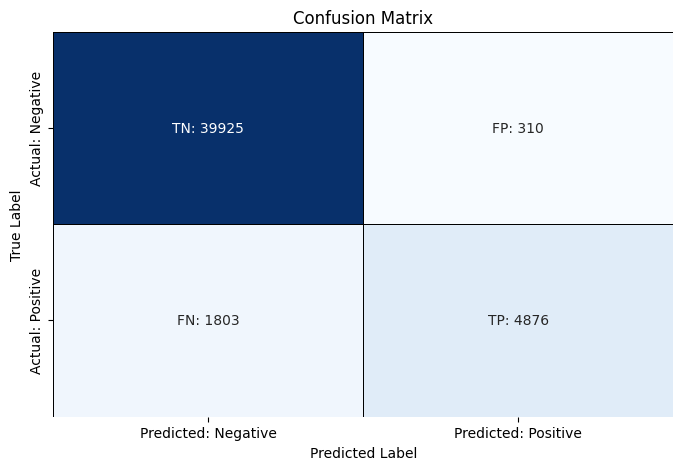

In [170]:
# Define labels with TN, FP, FN, TP, combined with the actual values
labels = [["TN: {}".format(con_matrix[0, 0]), "FP: {}".format(con_matrix[0, 1])],
          ["FN: {}".format(con_matrix[1, 0]), "TP: {}".format(con_matrix[1, 1])]]

# Plot heatmap with combined labels
plt.figure(figsize=(8, 5))
sns.heatmap(con_matrix, annot=labels, fmt="", cmap="Blues", cbar=False,
            xticklabels=["Predicted: Negative", "Predicted: Positive"], 
            yticklabels=["Actual: Negative", "Actual: Positive"],
            linecolor="black", linewidths=0.5)
            
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

### Classification Report :

Key Insights:
- **`Precision`**:
  - Non-defaulted loans: **0.96**, indicating the model is highly accurate when predicting non-defaulted loans.
  - Defaulted loans: **0.94**, reflecting strong precision for identifying defaulted loans correctly.
  
- **`Recall`**:
  - Non-defaulted loans: **0.99**, showing the model’s ability to capture nearly all non-defaulted cases.
  - Defaulted loans: **0.73**, indicating some missed defaulted cases (False Negatives).

- **`F1-Score`**:
  - Non-defaulted loans: **0.97**, demonstrating excellent overall performance in this category.
  - Defaulted loans: **0.82**, highlighting strong but not perfect predictive performance for defaulted loans.

- **`Overall Accuracy`**: The model achieves an impressive accuracy of **95%**, reflecting its strong performance across both classes.

In [171]:
print("Classification Report :")
print(report)

Classification Report :
              precision    recall  f1-score   support

       False       0.96      0.99      0.97     40235
        True       0.94      0.73      0.82      6679

    accuracy                           0.95     46914
   macro avg       0.95      0.86      0.90     46914
weighted avg       0.95      0.95      0.95     46914



### Predicting on validation set

In [172]:
y_validation_pred = best_xgb_model.predict(X_validation_without_scaling)

print("Accuracy Score :", round(best_xgb_model.score(X_validation_without_scaling, y_validation_for_other), 3))

Accuracy Score : 0.95


In [173]:
report = classification_report(y_validation_for_other, y_validation_pred)
con_matrix = confusion_matrix(y_validation_for_other, y_validation_pred)

### Confusion Matrix :
- **`True Negatives (TN)`**: **9,964** - Non-defaulted loans correctly classified.
- **`False Positives (FP)`**: **95** - Non-defaulted loans incorrectly classified as defaulted.
- **`False Negatives (FN)`**: **486** - Defaulted loans incorrectly classified as non-defaulted.
- **`True Positives (TP)`**: **1,184** - Defaulted loans correctly classified.

Observations :
- The model demonstrates excellent performance in identifying non-defaulted loans with a high **`True Negative (TN)`** count and low **`False Positive (FP)`** errors.
- The model performs well in identifying defaulted loans but still misclassifies a notable number of them as non-defaulted (**`False Negatives (FN)`**).

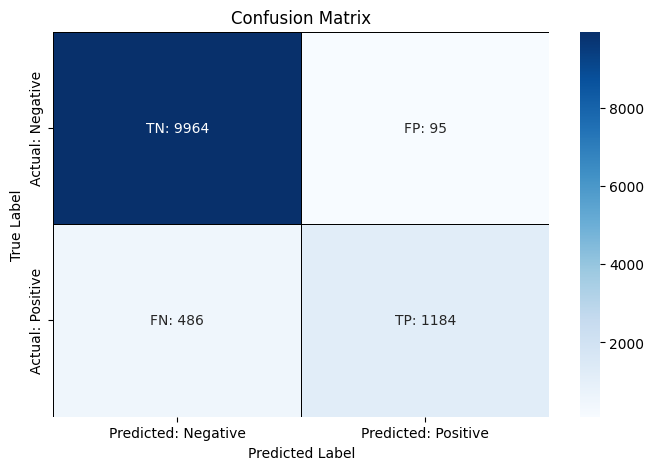

In [174]:
# Define labels with TN, FP, FN, TP, combined with the actual values
labels = [["TN: {}".format(con_matrix[0, 0]), "FP: {}".format(con_matrix[0, 1])],
          ["FN: {}".format(con_matrix[1, 0]), "TP: {}".format(con_matrix[1, 1])]]

# Plot heatmap with combined labels
plt.figure(figsize=(8, 5))
sns.heatmap(con_matrix, annot=labels, fmt="", cmap="Blues", cbar=True,
            xticklabels=["Predicted: Negative", "Predicted: Positive"], 
            yticklabels=["Actual: Negative", "Actual: Positive"],
            linecolor="black", linewidths=0.5)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

### Classification Report :

#### Key Insights:
- **`Precision`**:
  - Non-defaulted loans: **0.95**, indicating a high accuracy in predicting non-defaulted loans.
  - Defaulted loans: **0.93**, reflecting excellent precision for correctly identifying defaulted loans.
  
- **`Recall`**:
  - Non-defaulted loans: **0.99**, showing the model’s ability to capture almost all non-defaulted cases.
  - Defaulted loans: **0.71**, indicating some missed defaulted cases (False Negatives).

- **`F1-Score`**:
  - Non-defaulted loans: **0.97**, showcasing superior overall performance in this category.
  - Defaulted loans: **0.80**, highlighting strong predictive performance for defaulted loans.

- **`Overall Accuracy`**: The model achieves a remarkable accuracy of **95%**, signifying its strong capability to handle both classes effectively.

In [175]:
print("Classification Report :")
print(report)

Classification Report :
              precision    recall  f1-score   support

       False       0.95      0.99      0.97     10059
        True       0.93      0.71      0.80      1670

    accuracy                           0.95     11729
   macro avg       0.94      0.85      0.89     11729
weighted avg       0.95      0.95      0.95     11729



### Predicting on test set

In [176]:
# Make predictions
prediction_4 = best_xgb_model.predict(X_test_without_scaling)

prediction_4

array([1, 0, 0, ..., 0, 0, 1])

In [177]:
test_df_id = pd.read_csv("test.csv")

xgb_prediction = pd.DataFrame({"id" : test_df_id["id"], "loan_status" : prediction_4})

xgb_prediction["loan_status"] = xgb_prediction["loan_status"].astype(int)

xgb_prediction.to_csv("xgb_prediction.csv", index= False)

xgb_prediction

,id,loan_status
0,58645,1
1,58646,0
2,58647,0
3,58648,0
4,58649,0
...,...,...
39093,97738,0
39094,97739,0
39095,97740,0
39096,97741,0


### Model Performance Summary and Selection of the Best Model

### Logistic Regression:
- **Training Accuracy**: **`92%`**
- **Validation Accuracy**: **`92%`**
- **Key Strengths**:
  - Strong performance in identifying non-defaulted loans (high precision and recall for `False` class).
  - Efficient computation and straightforward interpretability.
- **Key Weaknesses**:
  - Moderate recall for defaulted loans, indicating missed predictions for `True` class.
  - Slightly lower overall performance compared to other models in recall and F1-score for defaulted loans.

---

### Random Forest Classifier:
- **Training Accuracy**: **`87%`**
- **Validation Accuracy**: **`86%`**
- **Key Strengths**:
  - High precision for defaulted loans (`True` class).
  - Handles imbalanced datasets reasonably well with class weighting.
- **Key Weaknesses**:
  - Significantly low recall for defaulted loans, leading to high False Negatives.
  - Overfitting tendencies due to ensemble nature, affecting its ability to generalize.

---

### K-Nearest Neighbors (KNN):
- **Training Accuracy**: **`93%`**
- **Validation Accuracy**: **`86%`**
- **Key Strengths**:
  - High precision and recall for non-defaulted loans.
  - Reasonably good F1-score for defaulted loans compared to Logistic Regression.
- **Key Weaknesses**:
  - Sensitive to imbalanced datasets and feature scaling.
  - Struggles with high False Negatives for defaulted loans.
  - Computationally intensive as dataset size grows.

---

### XGBoost Classifier:
- **Training Accuracy**: **`95%`**
- **Validation Accuracy**: **`95%`**
- **Key Strengths**:
  - Exceptional precision, recall, and F1-score for both non-defaulted (`False`) and defaulted (`True`) loans.
  - Robust handling of imbalanced data and complex relationships in the features.
  - Best recall for defaulted loans among all models, reducing False Negatives significantly.
- **Key Weaknesses**:
  - Slightly more complex to tune due to a larger number of hyperparameters.
  - Computationally intensive compared to Logistic Regression.

---

### Final Model Selection:
Based on the results, **`XGBoost Classifier`** is the best model for this dataset. It provides the highest overall accuracy (`95%`) on both the training and validation sets, along with excellent performance metrics for both classes. The high recall for defaulted loans makes it especially suitable for reducing `False Negatives`, which is critical in loan default prediction tasks. While XGBoost is computationally intensive, its performance gains outweigh this drawback, making it the most suitable choice.